In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%load_ext cudf.pandas

# Decoding the Comments: Sentiment, Topics, and Predictive Insights

The comments section is often referred to as the "pulse" of online communities, offering an unfiltered view of audience sentiment, engagement, and reactions. In this final notebook of the project, we shift our focus to the comments dataset to uncover deeper insights about the audience and their interactions with video content.

Through a combination of **data analysis** and **machine learning techniques**, this notebook will explore the following key areas:
- **Sentiment Analysis**: Understanding the emotional tone of user comments and its correlation with video engagement.
- **Topic Modeling**: Uncovering recurring themes and patterns in audience discussions.
- **Predictive Modeling**: Using comments to predict engagement metrics and identify key drivers of interaction.
- **Advanced NLP**: Applying modern Natural Language Processing (NLP) techniques to classify sentiment, detect emotions, and extract nuanced insights.

This notebook not only aims to generate actionable insights but also demonstrates the application of machine learning and NLP tools to real-world data. By the end, we hope to bridge the gap between content creators and their audience, providing a clearer understanding of how comments reflect and influence engagement.

As the final notebook in this series, this analysis will tie together the insights from previous notebooks, offering a holistic view of how video content and audience interaction shape overall engagement trends.

---
## Imports

In [2]:
! pip install vaderSentiment pyLDAvis

In [3]:
import re
from datetime import datetime
from dateutil import parser
from collections import Counter

import pandas as pd
import numpy as np

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, CountVectorizer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

from wordcloud import WordCloud, STOPWORDS

import xgboost as xgb

import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

from tqdm import tqdm, notebook as tqdm_notebook

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import transformers
print(transformers.__version__)

from transformers import (
    pipeline, AutoTokenizer, BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
)

import torch
from torch.utils.data import Dataset

import pyLDAvis

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

4.53.2


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

## Library Overview

This project uses a range of Python libraries for data analysis, natural language processing, machine learning, and visualisation:

- **pandas** and **numpy**: Essential data manipulation and numerical operations libraries.
- **datetime** and **dateutil.parser**: Tools for handling and parsing dates.
- **nltk**: Natural Language Toolkit for text processing, including tokenisation, lemmatisation, and stopword removal.
- **sklearn.feature_extraction.text**: Provides built-in English stopwords and utilities for text preprocessing.
- **VADER Sentiment (vaderSentiment)**: A library for sentiment analysis using the VADER model, suitable for social media and text data.
- **TextBlob**: Another library for sentiment analysis and natural language processing tasks.
- **WordCloud**: Used to create visual word clouds from text data.
- **sklearn.ensemble.RandomForestRegressor**: A machine learning algorithm for regression tasks.
- **sklearn.decomposition.LatentDirichletAllocation**: Topic modeling using LDA.
- **sklearn.linear_model.LogisticRegression**: Classification tasks.
- **sklearn.metrics**: This is used to evaluate model performance (classification report, confusion matrix, accuracy).
- **xgboost**: A powerful gradient boosting library for regression and classification.
- **matplotlib.pyplot** and **seaborn**: Libraries for creating data visualizations.
- **collections.Counter**: A utility for counting elements in iterables.
- **tqdm**: Provides progress bars for loops and iterable operations.
- **transformers (HuggingFace)**: State-of-the-art NLP models and pipelines.
- **torch**: Deep learning framework (used by transformers).
- **pyLDAvis**: For interactive visualisation of topic models.

**NLTK Data Resources:**  
The following code ensures necessary NLTK resources are available for text processing:

```python
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
```

---
# Data Preperation

we prepare and merge the datasets to create a unified structure for analysis:

 **Loading Datasets**:
   - `comments_df`: Contains video comments, the associated `video_id`, `channelTitle`, and timestamps (`published_at`).
   - `video_df`: Includes video metadata such as `title`, `description`, `tags`, `viewCount`, and engagement metrics.

In [4]:
comments_df = pd.read_csv("/content/drive/MyDrive/repository/dataFolder/processed/cleanedComments.csv")

In [5]:
video_df = pd.read_csv("/content/drive/MyDrive/repository/dataFolder/processed/cleanedDataFrame.csv")

In [ ]:
video_df.columns

Index(['video_id', 'channelTitle', 'title', 'description', 'tags',
       'publishedAt', 'viewCount', 'likeCount', 'favouriteCount',
       'commentCount', 'duration', 'definition', 'caption', 'publishDayName',
       'publishedAt_timestamp', 'tagCount', 'durationSecs', 'titleLength',
       'view_per_like', 'comment_duration_interaction', 'popularity_score',
       'commentRatio', 'likeRatio', 'title_sentiment'],
      dtype='object')

In [ ]:
comments_df.columns

Index(['video_id', 'channelTitle', 'comment', 'published_at'], dtype='object')

 **Merging Data**:
   - The `comments_df` is merged with a subset of `video_df` (`video_id` and `title`) using `video_id` as the key.
   - This links each comment to its corresponding video title, enabling analysis of comments in the context of video content.


In [6]:
merged_df = comments_df.merge(video_df[['video_id', 'title']], on='video_id', how='left')
print(merged_df.head())

      video_id   channelTitle  \
0  F5eSaabAAmk  Benjamin Seda   
1  F5eSaabAAmk  Benjamin Seda   
2  F5eSaabAAmk  Benjamin Seda   
3  F5eSaabAAmk  Benjamin Seda   
4  F5eSaabAAmk  Benjamin Seda   

                                             comment          published_at  \
0                                     big boobs lmao  2025-03-10T00:36:43Z   
1  This will work for a specific type of woman, o...  2025-03-09T23:01:56Z   
2  Can you do a video on what to do  if you  enco...  2025-03-09T07:13:54Z   
3                                 God of the Dates 🤍  2025-03-08T14:57:50Z   
4  About cold approaches, it's just not true. I d...  2025-03-07T19:06:08Z   

                                               title  
0  How to ACTUALLY Get a Girlfriend in 2025 (Full...  
1  How to ACTUALLY Get a Girlfriend in 2025 (Full...  
2  How to ACTUALLY Get a Girlfriend in 2025 (Full...  
3  How to ACTUALLY Get a Girlfriend in 2025 (Full...  
4  How to ACTUALLY Get a Girlfriend in 2025 (Full...  


 **Purpose**:
   - The merged dataset (`merged_df`) provides a consolidated view of comments and their associated videos, forming the foundation for sentiment analysis and other downstream tasks.

In [ ]:
merged_df

,video_id,channelTitle,comment,published_at,title
0,F5eSaabAAmk,Benjamin Seda,big boobs lmao,2025-03-10T00:36:43Z,How to ACTUALLY Get a Girlfriend in 2025 (Full...
1,F5eSaabAAmk,Benjamin Seda,"This will work for a specific type of woman, o...",2025-03-09T23:01:56Z,How to ACTUALLY Get a Girlfriend in 2025 (Full...
2,F5eSaabAAmk,Benjamin Seda,Can you do a video on what to do if you enco...,2025-03-09T07:13:54Z,How to ACTUALLY Get a Girlfriend in 2025 (Full...
3,F5eSaabAAmk,Benjamin Seda,God of the Dates 🤍,2025-03-08T14:57:50Z,How to ACTUALLY Get a Girlfriend in 2025 (Full...
4,F5eSaabAAmk,Benjamin Seda,"About cold approaches, it's just not true. I d...",2025-03-07T19:06:08Z,How to ACTUALLY Get a Girlfriend in 2025 (Full...
...,...,...,...,...,...
1079841,FirJFTPpE8M,FreshandFit,#REDPILLUP,2020-05-11T16:29:17Z,Welcome to the TRUTH in Fitness...
1079842,FirJFTPpE8M,FreshandFit,Nice intro. Had to sub after the livestream wi...,2020-05-09T21:35:24Z,Welcome to the TRUTH in Fitness...
1079843,FirJFTPpE8M,FreshandFit,🔥🔥🔥🔥🔥🔥,2020-05-09T15:27:29Z,Welcome to the TRUTH in Fitness...
1079844,FirJFTPpE8M,FreshandFit,"No scams or shortcuts here. Real facts, real r...",2020-05-08T18:57:41Z,Welcome to the TRUTH in Fitness...


---
## Sentiment Analysis

In this section, we focus on analyzing the sentiment of user comments to understand the emotional tone and opinions expressed within the dataset. Sentiment analysis helps classify comments into categories such as **Positive**, **Negative**, and (optionally) **Neutral**, providing valuable insights into user reactions and engagement.

### Tools Used for Sentiment Analysis

 **VADER Sentiment**:
   - **What is it?** VADER (Valence Aware Dictionary and sEntiment Reasoner) is a rule-based sentiment analysis tool specifically designed to analyze the sentiment in text, especially for social media and user-generated content.
   - **How does it work?** VADER uses a lexicon of words that are associated with sentiment scores (positive or negative). It also accounts for text nuances like capitalization, punctuation (e.g., "!!!"), and emoticons.
   - **Why use VADER?** It is highly effective for short, informal texts like YouTube comments, tweets, or product reviews.

 **TextBlob Sentiment**:
   - **What is it?** TextBlob is a Python library for processing textual data. It offers tools for common NLP tasks, including sentiment analysis.
   - **How does it work?** TextBlob uses a combination of a lexicon-based approach and machine learning to calculate a polarity score for text. Polarity ranges from `-1` (Negative) to `1` (Positive).
   - **Why use TextBlob?** It is simple to implement and provides a good baseline for general-purpose sentiment analysis.

By comparing both VADER and TextBlob, we aim to identify consistent sentiment trends and leverage their strengths for analyzing user comments effectively.

This section applies sentiment analysis to the comments in the dataset using two different methods: **VADER Sentiment Analysis** and **TextBlob Sentiment Analysis**. The goal is to classify each comment as either **Positive** or **Negative**, based on its sentiment score.


**VADER Sentiment Analysis**:
   - **Initialization**:

In [7]:
analyzer = SentimentIntensityAnalyzer()

A VADER sentiment analyzer is initialized to score the sentiment of comments.

- **Sentiment Scoring**:

In [ ]:
merged_df['vader_sentiment'] = merged_df['comment'].apply(
    lambda x: analyzer.polarity_scores(str(x))['compound'] if isinstance(x, str) else np.nan
)

Each comment is scored using VADER's compound sentiment score:
     - Positive scores indicate positive sentiment.
     - Negative scores indicate negative sentiment.

 - **Sentiment Classification**:

In [ ]:
merged_df['vader_sentiment_label'] = merged_df['vader_sentiment'].apply(
    lambda score: 'Positive' if score > 0 else 'Negative'
)

 Based on the compound score, comments are classified as either **Positive** or **Negative**.

**TextBlob Sentiment Analysis**:
   - **Sentiment Scoring**:

In [ ]:
merged_df['textblob_sentiment'] = merged_df['comment'].astype(str).apply(lambda x: TextBlob(x).sentiment.polarity)

 TextBlob calculates the polarity of each comment:
     - Scores greater than 0 indicate positive sentiment.
     - Scores less than 0 indicate negative sentiment.

- **Sentiment Classification**:

In [ ]:
merged_df['textblob_sentiment_label'] = merged_df['textblob_sentiment'].apply(
    lambda score: 'Positive' if score > 0 else 'Negative'
)

Comments are classified as **Positive** or **Negative** based on their polarity.

**Sentiment Distribution**:
   - The counts of **Positive** and **Negative** comments are printed for both VADER and TextBlob:

In [ ]:
print(merged_df['vader_sentiment_label'].value_counts())
print(merged_df['textblob_sentiment_label'].value_counts())

vader_sentiment_label
Positive    545969
Negative    533877
Name: count, dtype: int64
textblob_sentiment_label
Negative    578340
Positive    501506
Name: count, dtype: int64


- VADER identifies slightly more **Positive** comments than **Negative**.
- TextBlob identifies more **Negative** comments overall.

### Purpose
By leveraging both VADER and TextBlob, this section provides a comparative perspective on sentiment analysis:
- **VADER** is better suited for informal and short text, such as YouTube comments.
- **TextBlob** offers a general-purpose sentiment analysis approach that works well for structured text.

Together, these methods enable a robust understanding of the sentiment within the dataset.

### Sentiment Distribution Visualization

visualising the **distribution of sentiment labels** for both VADER and TextBlob sentiment analysis, providing a clear comparison of the positive and negative sentiments identified by each method.

**VADER Sentiment Distribution**:
   - A **countplot** is created to show the count of **Positive** and **Negative** comments classified by VADER.
   - The `hue` parameter is set to `vader_sentiment_label`, ensuring each sentiment label is represented with consistent colors.
   - A custom color palette is applied: `#4ECDC4` (mint green) for **Positive** and `#FF6B6B` (coral red) for **Negative**.
   - The plot is titled *"Distribution of Sentiments (VADER)"*.

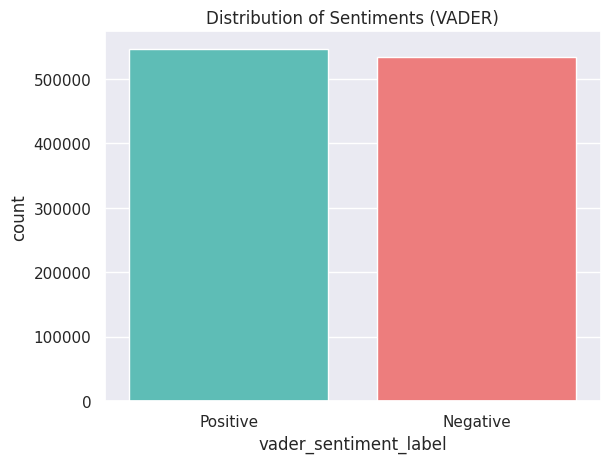

In [ ]:
sns.countplot(data=merged_df, x='vader_sentiment_label', hue='vader_sentiment_label',
              order=['Positive', 'Negative'], palette=["#4ECDC4", "#FF6B6B"], legend=False)
plt.title("Distribution of Sentiments (VADER)")
plt.show()

**TextBlob Sentiment Distribution**:
   - Similarly, a **countplot** is created for sentiment labels classified by TextBlob.
   - The same color palette and structure are applied to maintain consistency across both visualizations.
   - The plot is titled *"Distribution of Sentiments (TextBlob)"*.

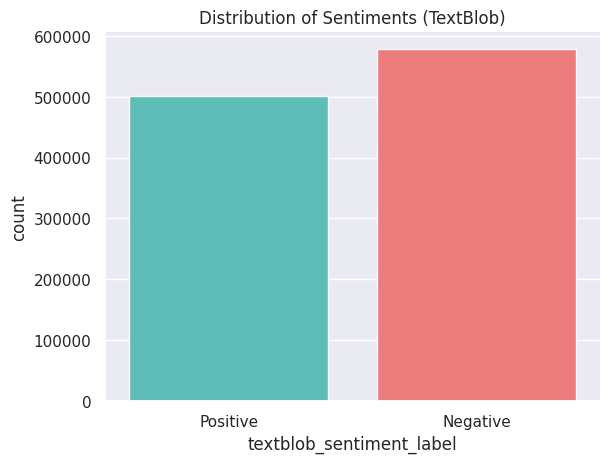

In [ ]:
sns.countplot(data=merged_df, x='textblob_sentiment_label', hue='textblob_sentiment_label',
              order=['Positive', 'Negative'], palette=["#4ECDC4", "#FF6B6B"], legend=False)
plt.title("Distribution of Sentiments (TextBlob)")
plt.show()

### Observations
- These visualizations provide a quick and intuitive understanding of the proportion of **Positive** and **Negative** comments detected by each sentiment analysis method.
- Differences in sentiment classification between VADER and TextBlob can be visually compared, highlighting the nuances of each method.

### Purpose
Visualizing sentiment distribution helps to:
- Summarize the overall tone of the dataset.
- Compare the performance and tendencies of VADER and TextBlob in classifying sentiment.
- Offer insights into the emotional engagement of users in the analyzed comments.

This step is crucial for understanding the sentiment trends before proceeding to further analyses or model-building tasks.

### Sentiment Analysis: Displaying Comments

Displaying the comments with their corresponding sentiment labels (**Positive** or **Negative**) and sentiment scores. It provides a direct way to examine specific examples of user comments based on sentiment classification.

**Function Overview**:
   - The function `print_comments_neatly` filters comments based on the specified sentiment label (`Positive` or `Negative`) from the `vader_sentiment_label` column.
   - It displays up to a predefined number of comments (`num_comments=5`) along with their sentiment scores.

In [ ]:
def print_comments_neatly(df, sentiment_label, num_comments=5):
    print(f"\n{'='*20} {sentiment_label.upper()} COMMENTS {'='*20}")
    filtered_df = df[df['vader_sentiment_label'] == sentiment_label]
    for i, row in enumerate(filtered_df.itertuples(), 1):
        print(f"{i}. Comment: {row.comment}")
        print(f"   Sentiment Score: {row.vader_sentiment:.2f}")
        print("-" * 60)
        if i >= num_comments:
            break

print_comments_neatly(merged_df, sentiment_label='Positive', num_comments=5)

print_comments_neatly(merged_df, sentiment_label='Negative', num_comments=5)


==================== POSITIVE COMMENTS ====================
1. Comment: big boobs lmao
   Sentiment Score: 0.60
------------------------------------------------------------
2. Comment: This will work for a specific type of woman, one that prioritizes emotions over values. The real question is how to find women that prioritize values over emotions because those types of women are a good match for a long term relationship.
   Sentiment Score: 0.81
------------------------------------------------------------
3. Comment: God of the Dates 🤍
   Sentiment Score: 0.27
------------------------------------------------------------
4. Comment: I am getting 300+ likes on bumble every month. And this all matches from new York.. 
But I am living in Asia and looking for serious marriage but dont know nothing workout from 2-3 months
   Sentiment Score: 0.12
------------------------------------------------------------
5. Comment: Bro this thumbnail text looks like "How to 3 star a town hall 11 base ful

**Example Output**:
   - **Positive Comments**: Contains optimistic or agreeable comments, such as:
     ```text
     1. Comment: big boobs lmao
        Sentiment Score: 0.60
     ...
     5. Comment: Bro this thumbnail text looks like "How to 3 star a town hall 11 base full guide"😭 its not that hard guys rlyy,be natural
        Sentiment Score: 0.30
     ```
   - **Negative Comments**: Contains critical or skeptical comments, such as:
     ```text
     1. Comment: Can you do a video on what to do if you encounter her boyfriend and how to de-escalate the situation...
        Sentiment Score: 0.00
     ...
     5. Comment: Dating is mostly physical attractiveness problem. What do you do if your ugly or too old? Pay and be a simp and get used?
        Sentiment Score: -0.61
     ```

### Missing Nuances in Sentiment Classification

While this method captures the general tone of comments, it misses important nuances in the text:

 **Contextual Sentiment**:
   - Some comments classified as **Positive** or **Negative** might contain mixed emotions or sarcasm, which basic sentiment analysis tools struggle to identify.
   - For example:
     - **Positive**: "Bro this thumbnail text looks like 'How to 3 star a town hall 11 base full guide'😭 its not that hard guys rlyy, be natural" – While humorous, the sentiment score doesn't fully capture the sarcastic tone.
     - **Negative**: "Can you do a video on what to do if you encounter her boyfriend...?" – This comment is neutral or actionable but scored as **Negative**.

 **Neutral Comments Misclassified**:
   - Comments with a sentiment score close to `0` are often misclassified as **Positive** or **Negative**. For example:
     - "people still watch this kind of videos in 2025?" – This has a score of `0.00` but is subjective and could be interpreted as neutral or skeptical.

 **Length and Complexity**:
   - Long comments with detailed explanations often contain multiple sentiments. For instance:
     - "About cold approaches, it's just not true... Do I do something wrong judging by my conversions? Absolutely..." – This mixes criticism, self-reflection, and suggestions, making it hard to label as purely **Negative**.

 **Cultural and Contextual Factors**:
   - Comments like "big boobs lmao" or "God of the Dates 🤍" are classified as **Positive**, but their actual sentiment depends on cultural or contextual understanding, which simple sentiment scoring tools cannot address.

### Limitations and Next Steps

- **Nuance Detection**: To improve accuracy, more advanced sentiment analysis tools (e.g., BERT-based models) or human validation might be required to capture sarcasm, mixed emotions, and context.
- **Neutral Category**: Adding a **Neutral** label for comments with sentiment scores close to `0` could reduce misclassification.
- **Topic Analysis**: Combining sentiment analysis with topic modeling could provide deeper insights into the themes and emotional tones of the comments.

This section highlights the strengths of automated sentiment analysis while acknowledging its limitations in capturing the full complexity of human emotions and language.

### Dropping TextBlob and keeping VADER

We initially explored TextBlob for sentiment analysis due to its simplicity and effectiveness for general text. However, we switched to VADER as it is specifically designed for analyzing short, informal text, such as social media comments. VADER's ability to handle slang, emojis, and negations, combined with its speed and accuracy, made it a better fit for this project.

### Distribution of VADER Sentiment Scores

This plot visualizes the distribution of VADER sentiment scores across the dataset. It provides insights into how the sentiment of comments is distributed and helps identify trends or patterns in emotional tone.

 **Histogram**:
   - Displays the frequency of sentiment scores grouped into 30 bins.
   - The x-axis represents the sentiment scores, ranging from -1 (very negative) to +1 (very positive).
   - The y-axis shows the frequency of comments for each range of sentiment scores.

 **Kernel Density Estimate (KDE)**:
   - Overlays a smoothed curve to represent the distribution density.
   - Helps better visualize the central tendency and spread of the data.

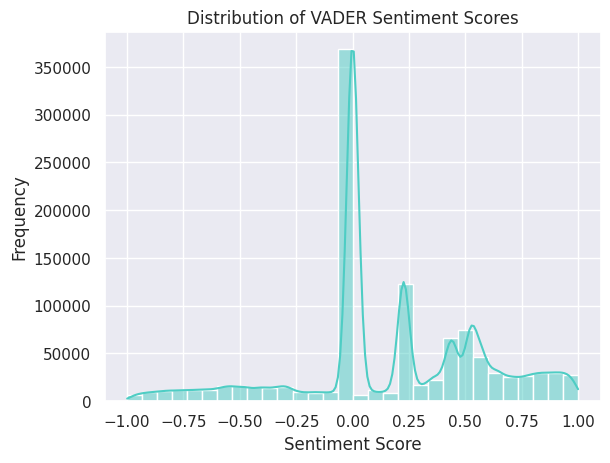

In [ ]:
sns.histplot(merged_df['vader_sentiment'], bins=30, kde=True, color='#4ECDC4')
plt.title('Distribution of VADER Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

### Descriptive Statistics

| Metric            | Value         |
|--------------------|---------------|
| **Count**         | 1,079,836     |
| **Mean**          | 0.1736        |
| **Standard Deviation** | 0.4213    |
| **Minimum**       | -0.9998       |
| **25th Percentile** | 0.0000      |
| **Median (50%)**  | 0.0557        |
| **75th Percentile** | 0.5264      |
| **Maximum**       | 1.0000        |

#### Key Takeaways:
 **Mean Sentiment Score**: The average sentiment score is **0.1736**, indicating a slight positive bias in the dataset.
 **Median**: The median score is **0.0557**, showing that the majority of scores cluster near neutral but lean slightly positive.
 **Range**:
   - The minimum score is **-0.9998**, representing the most negative sentiment.
   - The maximum score is **1.0000**, representing the most positive sentiment.
 **Spread**:
   - The standard deviation of **0.4213** indicates a moderate spread in sentiment scores.



### Frequency Distribution (Binned)

The histogram groups sentiment scores into 30 bins, revealing the frequency of scores across ranges. Here are some notable findings:

- **Most Frequent Range**: The range **(-0.0666, 0.0001]** has the highest count (**368,397 comments**), indicating a prevalence of comments with near-neutral or slightly negative sentiment.
- **Positive Sentiment Distribution**:
  - Scores between **(0.2, 0.267]** (123,058 comments) and **(0.467, 0.533]** (74,387 comments) are the most frequent among positive sentiments.
  - Higher positive scores, such as **(0.933, 1.0]**, are less frequent but still significant, with **27,264 comments** in this range.
- **Negative Sentiment Distribution**:
  - Negative scores, such as **(-0.6, -0.533]** (16,249 comments) and **(-0.533, -0.467]** (15,561 comments), are less frequent than positive scores.
  - Extremely negative scores, such as **(-1.002, -0.933]**, occur rarely (**6,627 comments**).

### Raw Sentiment Scores (First 10)

| Index | Sentiment Score |
|-------|-----------------|
| 0     | 0.5994          |
| 1     | 0.8074          |
| 2     | 0.0000          |
| 3     | 0.2732          |
| 4     | -0.1050         |
| 5     | -0.5967         |
| 6     | 0.0000          |
| 7     | 0.1154          |
| 8     | 0.2951          |
| 9     | 0.3896          |

#### Observations:
- The first 10 scores range from **-0.5967** (negative) to **0.8074** (positive).
- Neutral scores like **0.0000** appear frequently, reflecting a mix of comments with no strong sentiment.


### Insights from the Plot and Data

 **Neutral Bias**:
   - A large number of comments are clustered near 0, indicating a significant portion of the dataset has a neutral or mixed sentiment.

 **Positive Skew**:
   - The mean and median both lean slightly positive, suggesting the dataset contains more positive comments than negative ones.

 **Long Tail of Extreme Sentiments**:
   - Both highly positive (close to +1) and highly negative (close to -1) sentiments occur but are relatively rare.

 **Real-world Implications**:
   - The prevalence of neutral and slightly positive comments may reflect typical online behavior, where users often express mild opinions rather than extreme emotions.

This analysis provides a deeper understanding of the sentiment tendencies in the dataset and complements the visual representation in the plot.

## Scatter Plot: Sentiment Score vs. Comment Length

This scatter plot visualizes the relationship between **VADER sentiment scores** and **comment lengths**. It helps us understand how the length of a comment correlates with its sentiment.

### Key Features of the Plot
- **X-Axis (VADER Sentiment Score)**:
  - Represents the sentiment scores, ranging from -1 (very negative) to +1 (very positive).
- **Y-Axis (Comment Length)**:
  - Indicates the length of each comment, measured in the number of characters.
- **Color and Transparency**:
  - The points are colored purple with an alpha value of 0.5, providing better visibility for overlapping points.

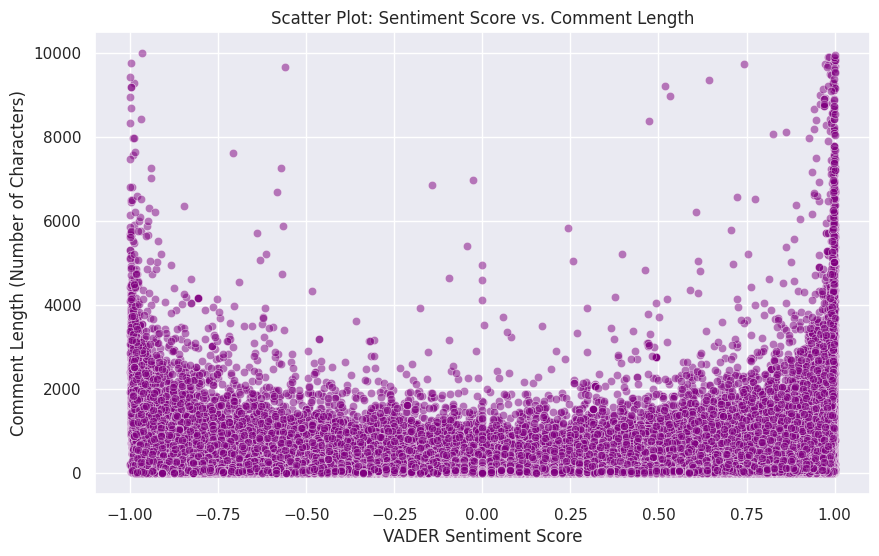

In [ ]:
merged_df['comment_length'] = merged_df['comment'].apply(lambda x: len(str(x)) if isinstance(x, str) else 0)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x='vader_sentiment', y='comment_length', alpha=0.5, color='purple')
plt.title('Scatter Plot: Sentiment Score vs. Comment Length')
plt.xlabel('VADER Sentiment Score')
plt.ylabel('Comment Length (Number of Characters)')
plt.show()

### Numerical Data Summary

### First 10 Rows of Data:
| VADER Sentiment | Comment Length |
|-----------------|----------------|
| 0.5994          | 14             |
| 0.8074          | 239            |
| 0.0000          | 248            |
| 0.2732          | 18             |
| -0.1050         | 523            |
| -0.5967         | 90             |
| 0.0000          | 48             |
| 0.1154          | 187            |
| 0.2951          | 121            |
| 0.3896          | 651            |

### Descriptive Statistics:
| Metric                   | VADER Sentiment    | Comment Length       |
|---------------------------|--------------------|----------------------|
| **Count**                | 1,079,836          | 1,079,846            |
| **Mean**                 | 0.1736             | 114.58               |
| **Standard Deviation (std)** | 0.4213         | 255.87               |
| **Minimum (min)**        | -0.9998            | 0                    |
| **25th Percentile (25%)**| 0.0000             | 29.0                 |
| **Median (50%)**         | 0.0557             | 51.0                 |
| **75th Percentile (75%)**| 0.5264             | 104.0                |
| **Maximum (max)**        | 1.0000             | 9,992.0              |


### Insights from the Data and Plot

 **General Comment Length Trends**:
   - The average comment length is **114.58 characters**, with a wide range extending from **0** (empty comments) to **9,992 characters**.
   - The **median comment length** is only **51 characters**, indicating that most comments are relatively short.

 **Neutral and Mixed Sentiments**:
   - Sentiments near **0 (neutral)** are associated with a range of comment lengths, from very short to very long.
   - This suggests that neutral comments are common across various levels of detail and complexity.

 **Extreme Sentiments**:
   - Comments with extreme positive (**~1**) or extreme negative (**~-1**) sentiment scores tend to be shorter, as indicated by clustering at lower comment lengths.
   - This implies that highly emotional expressions are often brief and to the point.

 **Variability in Comment Length**:
   - The **standard deviation** of comment length (**255.87 characters**) highlights significant variability, with some comments being exceptionally detailed while others are very concise.

 **Outliers**:
   - The maximum comment length of **9,992 characters** is an outlier and represents unusually verbose comments, which might warrant further investigation.


### Why This Matters
The relationship between sentiment scores and comment lengths is important for understanding:
- **Behavioral Patterns**: Shorter comments often express more extreme emotions, while longer comments lean toward neutrality or mixed sentiment.
- **Content Analysis**: Knowing the typical length of comments can guide strategies for moderation, content curation, or summarization.

This analysis complements the scatter plot visualization by providing a quantitative breakdown of the data, helping to interpret the trends more effectively.

### Most Frequent Words in Highly Positive and Highly Negative Comments

This analysis identifies the most frequently used words in comments with **highly positive sentiment** (VADER Sentiment > 0.9) and **highly negative sentiment** (VADER Sentiment < -0.9). By visualizing and analyzing these words, we can gain insights into the common themes and language patterns in extreme sentiments.

#### `get_most_frequent_words` Function:
- **Purpose**: Extracts and counts the most frequent words in comments filtered by a sentiment condition.
- **Steps**:
   Filters comments in the `df` DataFrame based on the sentiment condition `sentiment_filter`.
   Joins all filtered comments into a single string and splits them into individual words.
   Cleans the list of words by removing stopwords (from `STOPWORDS`) and non-alphabetic terms.
   Counts the frequency of each word using `Counter` and retrieves the top `num_words` most common entries.
   Returns the results as a DataFrame with columns `Word` and `Frequency`.

#### Generating Positive Words Plot:
- Filters comments with **VADER Sentiment > 0.9** to identify words associated with highly positive comments.
- Creates a bar plot using `sns.barplot` to visualize the top 10 most frequent words and their respective frequencies.
- Uses a custom mint green color palette (`#4ECDC4`) for a visually appealing positive tone.

#### Generating Negative Words Plot:
- Filters comments with **VADER Sentiment < -0.9** to identify words associated with highly negative comments.
- Similarly, creates a bar plot for the top 10 most frequent negative words.
- Uses a custom coral red palette (`#FF6B6B`) to visually distinguish it as negative sentiment.


### Key Features of the Code

#### Sentiment Filtering:
- The function uses a lambda function (`lambda x: x > 0.9` or `lambda x: x < -0.9`) to dynamically filter comments based on sentiment thresholds.

#### Visualization:
- The use of Seaborn (`sns.barplot`) creates clean and professional bar plots.
- Hue is set to `Word` for compatibility with future Seaborn versions, and legends are manually removed for clarity.

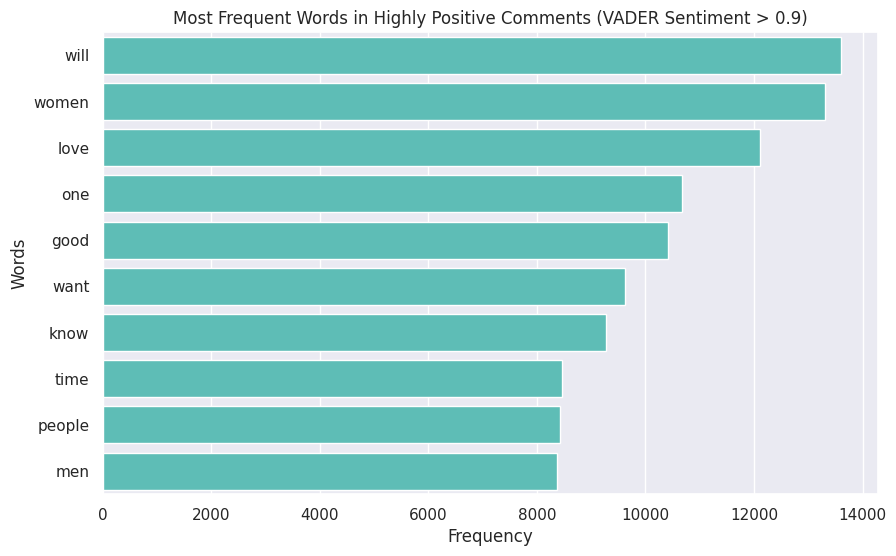

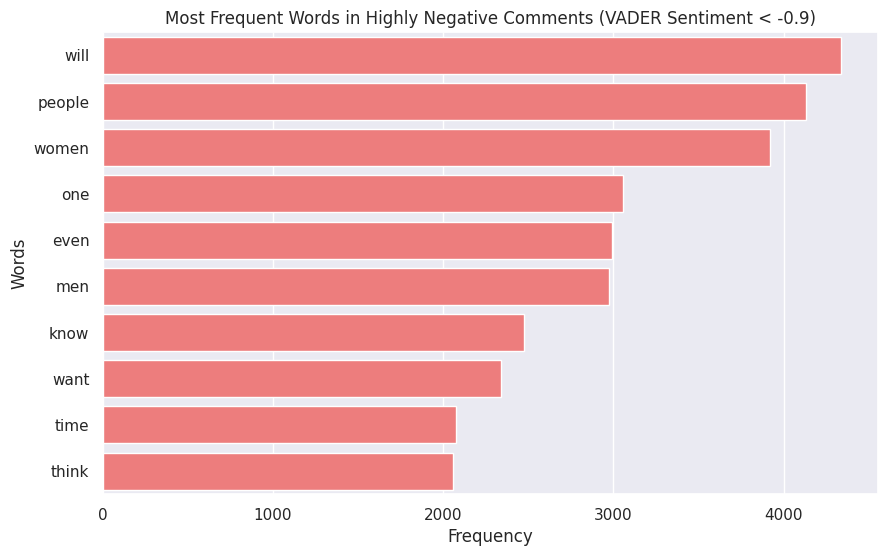

In [ ]:
def get_most_frequent_words(df, sentiment_filter, num_words=10):
    filtered_comments = df[df['vader_sentiment'].apply(sentiment_filter)]['comment']

    all_words = ' '.join(str(comment) for comment in filtered_comments).lower().split()
    cleaned_words = [word for word in all_words if word not in STOPWORDS and word.isalpha()]

    most_common_words = Counter(cleaned_words).most_common(num_words)
    return pd.DataFrame(most_common_words, columns=['Word', 'Frequency'])

positive_words_df = get_most_frequent_words(merged_df, sentiment_filter=lambda x: x > 0.9)

plt.figure(figsize=(10, 6))
sns.barplot(data=positive_words_df, x='Frequency', y='Word', hue='Word', dodge=False, palette=['#4ECDC4'] * len(positive_words_df))
plt.title('Most Frequent Words in Highly Positive Comments (VADER Sentiment > 0.9)')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.legend([],[], frameon=False)
plt.show()

negative_words_df = get_most_frequent_words(merged_df, sentiment_filter=lambda x: x < -0.9)

plt.figure(figsize=(10, 6))
sns.barplot(data=negative_words_df, x='Frequency', y='Word', hue='Word', dodge=False, palette=['#FF6B6B'] * len(negative_words_df))
plt.title('Most Frequent Words in Highly Negative Comments (VADER Sentiment < -0.9)')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.legend([],[], frameon=False)
plt.show()

### Highly Positive Comments (VADER Sentiment > 0.9)

#### Data Summary
| Rank | Word   | Frequency |
|------|--------|-----------|
| 1    | will   | 13,597    |
| 2    | women  | 13,299    |
| 3    | love   | 12,112    |
| 4    | one    | 10,664    |
| 5    | good   | 10,408    |
| 6    | want   | 9,623     |
| 7    | know   | 9,269     |
| 8    | time   | 8,458     |
| 9    | people | 8,419     |
| 10   | men    | 8,362     |

#### Observations
 **Positive Sentiment Indicators**:
   - Words like **"love"** and **"good"** highlight expressions of approval, happiness, and appreciation.
   - These words align with the overall positive tone of the comments.

 **Future-Oriented Language**:
   - The word **"will"** appears most frequently, suggesting that highly positive comments often express optimism or plans for the future.

 **Gender-Specific Mentions**:
   - Words like **"women"** and **"men"** frequently appear, indicating that gender-related topics are prominent in positively expressed themes.

 **Action-Oriented Words**:
   - Words such as **"want"** and **"know"** suggest that positive comments often describe desires, intentions, or knowledge-sharing.

### Highly Negative Comments (VADER Sentiment < -0.9)

#### Data Summary
| Rank | Word    | Frequency |
|------|---------|-----------|
| 1    | will    | 4,335     |
| 2    | people  | 4,133     |
| 3    | women   | 3,919     |
| 4    | one     | 3,056     |
| 5    | even    | 2,991     |
| 6    | men     | 2,973     |
| 7    | know    | 2,475     |
| 8    | want    | 2,337     |
| 9    | time    | 2,078     |
| 10   | think   | 2,055     |

### Observations
 **Critical and Skeptical Tone**:
   - Words like **"even"** and **"think"** suggest a tone of doubt or criticism in highly negative comments.

 **Common Topics Across Sentiments**:
   - Words such as **"people"**, **"women"**, and **"men"** appear in both positive and negative comments, indicating that discussions about gender and societal topics are emotionally charged in both directions.

 **Future Language with a Negative Twist**:
   - The word **"will"** appears frequently, but in the context of negative comments, it might reflect pessimism or negative predictions.

 **Action and Emotion**:
   - Words like **"want"** and **"know"** may indicate dissatisfaction or frustration, where people express unmet desires or negative reflections on knowledge.


### Comparison Between Positive and Negative Comments
 **Shared Words**:
   - Words like **"will"**, **"people"**, **"women"**, **"men"**, and **"know"** are prominent in both positive and negative comments, showing that the same topics can evoke both positive and negative emotions depending on the context.

 **Emotionally Distinct Words**:
   - Positive comments include words like **"love"** and **"good"**, emphasizing positivity and approval.
   - Negative comments introduce words like **"even"** and **"think"**, which convey skepticism and criticism.

 **Frequency Gap**:
   - Positive words tend to appear more frequently overall, which could indicate that highly positive comments are generally longer or contain more repetitive expressions.


### Why This Matters
By identifying the most frequent words in highly positive and negative comments, we can better understand the themes and topics that drive emotional responses in user comments. This insight can be applied to:
- **Content Moderation**: Identifying emotionally charged topics that may require closer attention.
- **User Engagement**: Tailoring responses or content to address common themes.
- **Sentiment Analysis Models**: Refining models to better capture the nuances of extreme sentiments.

These findings highlight the power of simple word frequency analysis in uncovering meaningful patterns within text data.

---
# Topic Modeling

Topic modeling is a technique used to automatically identify themes or topics within a collection of text documents. It helps uncover the underlying structure of large text datasets by grouping similar words together into topics. Each document in the dataset can then be represented as a mixture of these topics, allowing us to understand the key themes present.

This method is particularly useful when working with large collections of unstructured text, such as customer feedback, social media comments, or articles. By applying topic modeling, we can gain insights into the most discussed themes, identify trends, and organize text data in a meaningful way.

In the following section, we will explore how to perform topic modeling programmatically, using code to extract and visualize topics from text data.

We will use various tools to preprocess text data, extract patterns, and uncover underlying topics. Libraries like **NLTK** and **SpaCy** will help in cleaning and preparing text, while **Gensim** and **Scikit-learn** will be used to apply advanced topic modeling algorithms such as Latent Dirichlet Allocation (LDA) and Non-negative Matrix Factorization (NMF). Finally, we’ll utilize **pyLDAvis** for interactive visualization of the discovered topics, making it easier to interpret and analyze the results.

## Text Preprocessing

Before performing topic modeling, it is important to preprocess the text data to ensure meaningful results. The following preprocessing steps were applied to each comment:

**Lowercasing:**  
   All text is converted to lowercase to ensure that words like "The" and "the" are treated as the same word.

 **Removing Non-Alphabetic Characters:**  
   Punctuation, numbers, and special characters are removed, leaving only alphabetic characters and whitespace.

 **Tokenization:**  
   The text is split into individual words (tokens) for easier processing.

 **Stopword Removal:**  
   Common English words that do not contribute significant meaning (such as "the", "and", "in") are removed using a standard stopword list.

 **Lemmatization:**  
   Words are reduced to their base or dictionary form (e.g., "running" becomes "run") to group similar words together.

 **Reassembly:**  
   The processed tokens are joined back together into a single string for each comment, ready for vectorization.


In [ ]:
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^a-z\s]', '', text)
    tokens = text.split()
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(tokens)

This preprocessing routine helps to clean and standardize the text data, which improves the quality and coherence of the topics identified during modeling.

### Applying Preprocessing to Comments

After defining the preprocessing function, I applied it to all comments in the dataset. This creates a new column, `cleaned_comment`, containing the cleaned and standardized text for each comment. Preprocessing ensures that the text is ready for topic modeling by removing noise and reducing each comment to its most meaningful words.

In [ ]:
merged_df['cleaned_comment'] = merged_df['comment'].dropna().astype(str).apply(preprocess_text)

The resulting `cleaned_comment` column will be used for further analysis and topic modeling.

## Topic Modeling

After preprocessing the comments, I performed topic modeling using Latent Dirichlet Allocation (LDA). Topic modeling is an unsupervised machine learning technique that discovers hidden thematic structures in large collections of text. In this case, the goal was to automatically identify the main subjects discussed across all comments.

The process involved:
 **Vectorizing the cleaned text** using `CountVectorizer`, which transforms the text into a document-term matrix suitable for modeling.
 **Applying LDA**, which finds groups of words (topics) that frequently occur together and assigns each comment a mixture of these topics.
 **Extracting the top words** for each topic, which help interpret the meaning of the topics.

### Top Words Per Topic

Below are the top 10 words for each topic identified by the model. These keywords provide insight into the main themes present in the dataset:

| Topic | Top 10 Words |
|-------|--------------|
| **1** | told, place, warm, zeus, thank, corey, thanks, coach, video, great |
| **2** | close, punani, myron, fresh, red, lol, lmao, podcast, pill, episode |
| **3** | woman, like, im, dont, guy, time, girl, want, man, know |
| **4** | biden, joe, richest, nutritious, right, guy, topic, wonderful, particular, deepened |
| **5** | peterson, woman, jordan, people, hope, men, god, like, dont, life |


**How to interpret:**  
- Each topic is represented by a set of words that frequently appear together in the comments.
- For example, Topic 3 includes words like "woman", "like", "im", "dont", "guy", "girl", "man", which might indicate discussions or debates about gender or relationships.
- Topic 4, with words like "biden", "joe", "right", "topic", appears to relate to political discussions.
- Some topics contain names (e.g., "peterson", "jordan", "myron", "corey"), which may refer to prominent individuals or hosts mentioned in the comments.

In [ ]:
def perform_topic_modeling(df, num_topics=5, num_words=10):
    comments = df['cleaned_comment'].dropna().astype(str)

    vectorizer = CountVectorizer(stop_words='english', max_features=5000)
    dtm = vectorizer.fit_transform(comments)

    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(dtm)

    topics = []
    feature_names = vectorizer.get_feature_names_out()
    for topic_idx, topic in enumerate(lda.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-num_words:][::-1]]
        topics.append(f"Topic {topic_idx + 1}: " + ", ".join(top_words))

    return lda, dtm, vectorizer, topics

lda_model, dtm, vectorizer, topic_descriptions = perform_topic_modeling(merged_df, num_topics=5, num_words=10)

for topic in topic_descriptions:
    print(topic)

pyLDAvis.enable_notebook()

lda_vis = pyLDAvis.prepare(topic_term_dists=lda_model.components_,
                           doc_topic_dists=lda_model.transform(dtm),
                           doc_lengths=dtm.sum(axis=1).A1,
                           vocab=vectorizer.get_feature_names_out(),
                           term_frequency=np.asarray(dtm.sum(axis=0)).ravel())

pyLDAvis.display(lda_vis)

Topic 1: told, place, warm, zeus, thank, corey, thanks, coach, video, great
Topic 2: close, punani, myron, fresh, red, lol, lmao, podcast, pill, episode
Topic 3: woman, like, im, dont, guy, time, girl, want, man, know
Topic 4: biden, joe, richest, nutritious, right, guy, topic, wonderful, particular, deepened
Topic 5: peterson, woman, jordan, people, hope, men, god, like, dont, life


To further explore and interpret the topics, I used [pyLDAvis](https://pyldavis.readthedocs.io/), an interactive visualization library for LDA models. This tool allows us to:
- See how distinct or overlapping the topics are.
- Explore the most relevant words for each topic.
- Analyze the distribution of topics across the corpus.

*Above is an interactive visualization generated by pyLDAvis. You can hover over each topic to see its most relevant words and their relative importance.*

**In summary:**  
Topic modeling has helped uncover the main themes in the comment data, making it easier to understand what people are discussing most frequently and setting the stage for further analysis.

### Exploring Topic Modeling Data Points

In [ ]:
doc_topic_matrix = lda_model.transform(dtm)
print(doc_topic_matrix)

[[0.05000018 0.34492875 0.50436654 0.05000015 0.05070437]
 [0.01052632 0.01052788 0.95753692 0.01052632 0.01088256]
 [0.01178568 0.01195083 0.95262627 0.01176472 0.01187251]
 ...
 [0.2        0.2        0.2        0.2        0.2       ]
 [0.03333335 0.03336001 0.03380084 0.03333335 0.86617244]
 [0.02857189 0.87959025 0.03123399 0.02857178 0.0320321 ]]


In [ ]:
topic_word_matrix = lda_model.components_
print(topic_word_matrix)

[[2.00755602e-01 2.00363937e-01 2.00584908e-01 ... 2.00382169e-01
  2.00512912e-01 3.84853396e+02]
 [6.79161957e+01 2.06819226e-01 2.00391354e-01 ... 2.00313741e-01
  9.05507421e+01 2.01009920e-01]
 [6.01134234e+01 2.94612872e+02 1.64116806e+01 ... 2.51198420e+02
  9.41360421e+01 5.44650672e-01]
 [2.00153808e-01 2.00076417e-01 2.00103003e-01 ... 2.00034782e-01
  2.00325835e-01 2.00095358e-01]
 [1.01569472e+02 1.37798685e+01 1.99987240e+02 ... 2.00849663e-01
  2.99123771e+01 2.00847851e-01]]


In [ ]:
doc_topic_df = pd.DataFrame(doc_topic_matrix, columns=[f"Topic {i+1}" for i in range(lda_model.n_components)])
print(doc_topic_df.head())

    Topic 1   Topic 2   Topic 3   Topic 4   Topic 5
0  0.050000  0.344929  0.504367  0.050000  0.050704
1  0.010526  0.010528  0.957537  0.010526  0.010883
2  0.011786  0.011951  0.952626  0.011765  0.011873
3  0.066734  0.066667  0.400507  0.066667  0.399426
4  0.005000  0.005004  0.828422  0.005017  0.156556


In [ ]:
feature_names = vectorizer.get_feature_names_out()
topic_word_df = pd.DataFrame(topic_word_matrix, columns=feature_names)
print(topic_word_df.head())

        aaron          ab     abandon   abandoned      ability         able  \
0    0.200756    0.200364    0.200585    0.200344     0.200397     0.200336   
1   67.916196    0.206819    0.200391    0.200404     0.200529     0.200810   
2   60.113423  294.612872   16.411681   47.862936    53.833820  2587.683295   
3    0.200154    0.200076    0.200103    0.200067     0.200086     0.200150   
4  101.569472   13.779868  199.987240  207.536249  1988.565167  3215.715409   

     abortion     abraham     absence     absolute  ...        youve  \
0    0.200263    0.200244    0.200321     0.208844  ...     0.208057   
1    0.200823    0.200220    0.200333     7.600395  ...     0.201115   
2    0.238065    0.200542   30.394490   363.639339  ...  2812.789252   
3    0.200163    0.200035    0.200192     0.200362  ...     0.200148   
4  646.160685  273.198958  210.004665  1264.351060  ...   650.601427   

            yr          yt         yup         zero         zeus         zone  \
0     0.200

After fitting the topic model, I printed several datapoints from the results to better understand how the model represents the text data. These included:

- **Top words for each topic:**  
  The most frequent and representative words for each topic, which provide insight into the main themes across the comments.

- **Document-topic distributions:**  
  For each comment, the model estimates the proportion of each topic present. This helps identify which comments are most strongly associated with which topics.

- **Raw topic modeling matrices:**  
  I also examined the raw numerical matrices generated by the model, such as:

    - The **document-topic matrix** (shown above).
    - The **topic-word matrix**, which shows for each topic (row) the weight assigned to each word in the vocabulary (columns).  

#### Reflections

Some of these datapoints (like the top words per topic and the document-topic distributions) are directly interpretable and useful for understanding the themes in the data. Others, such as the raw topic-word matrix, are more technical and may not provide immediate insights to a general audience. However, reviewing these outputs helped me verify that the topic modeling process worked correctly and gave me a deeper understanding of how the model represents the data.

### Topic Modeling Results Summary

Below is a table showing the top words for each topic, helping to interpret what each topic represents:

In [ ]:
def display_topics_table(lda_model, vectorizer, num_words=10):
    feature_names = vectorizer.get_feature_names_out()
    topic_dict = {}
    for topic_idx, topic in enumerate(lda_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-num_words:][::-1]]
        topic_dict[f"Topic {topic_idx + 1}"] = top_words
    topics_df = pd.DataFrame(topic_dict)
    print(topics_df)
    return topics_df

topics_df = display_topics_table(lda_model, vectorizer, num_words=10)

  Topic 1  Topic 2 Topic 3     Topic 4   Topic 5
0    told    close   woman       biden  peterson
1   place   punani    like         joe     woman
2    warm    myron      im     richest    jordan
3    zeus    fresh    dont  nutritious    people
4   thank      red     guy       right      hope
5   corey      lol    time         guy       men
6  thanks     lmao    girl       topic       god
7   coach  podcast    want   wonderful      like
8   video     pill     man  particular      dont
9   great  episode    know    deepened      life


Additionally, the bar chart below shows how many comments are primarily associated with each topic. This helps visualize which topics are most prevalent in the dataset:

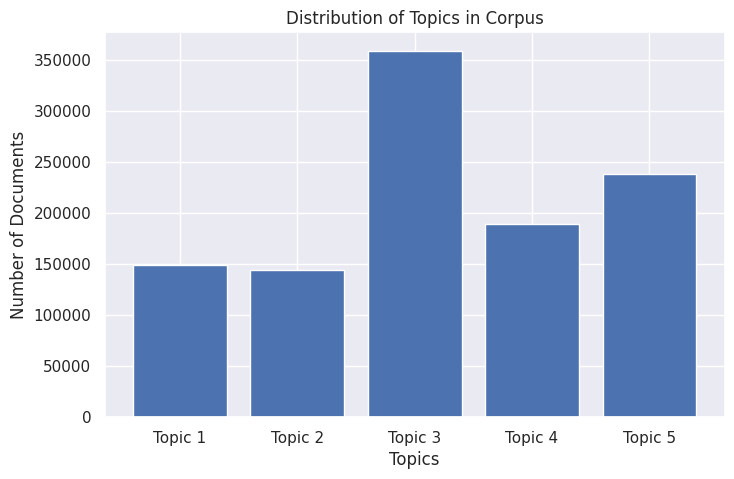

In [ ]:
doc_topic_matrix = lda_model.transform(dtm)
topic_counts = np.argmax(doc_topic_matrix, axis=1)
topic_distribution = pd.Series(topic_counts).value_counts().sort_index()

plt.figure(figsize=(8,5))
plt.bar([f"Topic {i+1}" for i in topic_distribution.index], topic_distribution.values)
plt.xlabel("Topics")
plt.ylabel("Number of Documents")
plt.title("Distribution of Topics in Corpus")
plt.show()

These outputs together provide a clear overview of both the content and relative importance of each topic in the corpus.

---
## Predictive Modeling

After exploring the main themes in the comments using topic modeling, the next step is to apply predictive modeling to gain further insights from the data. Predictive modeling involves using machine learning algorithms to predict a target variable based on features extracted from the data.

### Goals of Predictive Modeling

The specific goal of predictive modeling depends on the nature of the target variable. Common predictive modeling tasks include:
- **Classification:** Predicting a discrete label (e.g., sentiment: positive/negative, spam/not spam, topic category, etc.).
- **Regression:** Predicting a continuous value (e.g., rating score, number of likes, etc.).

### Steps Typically Involved

 **Defining the Target Variable:**  
   Decide what you want to predict (e.g., sentiment, topic, or any other label present in your dataset).

 **Feature Engineering:**  
   Extract features from the text data (e.g., using vectorized text, topic proportions from LDA, etc.).  
   You can use the document-topic matrix from your topic modeling as features, or the original text vectorization.

 **Splitting the Data:**  
   Divide your data into training and testing sets to evaluate model performance.

 **Model Selection and Training:**  
   Choose a suitable machine learning model (e.g., Logistic Regression, Random Forest, SVM) and train it on your features.

 **Evaluation:**  
   Assess the model’s performance using appropriate metrics (accuracy, precision, recall, F1-score for classification; RMSE or MAE for regression).

 **Interpretation:**  
   Analyze the results to understand which features are most important and how well the model predicts the target variable.

## Predictive Modeling: Sentiment Prediction

After exploring the main themes in the comments using topic modeling, the next analytical step is to predict the **sentiment** of each comment. Sentiment prediction aims to classify comments as positive, negative, or neutral, providing valuable insights into overall community attitudes and emotional tone.

### Why Sentiment Prediction?

- **Understand user attitudes:** Assess how users feel about various topics or events discussed.
- **Actionable insights:** Identify areas with positive feedback or negative sentiment for targeted actions.
- **Track changes over time:** Monitor shifts in sentiment around specific topics or during certain time periods.

### Predictive Modeling Workflow

**Defining the Target Variable:**  
   Decide what you want to predict—in this case, sentiment (positive, negative, or neutral). If sentiment labels are not present, they can be generated using a sentiment analysis tool such as VADER or TextBlob.

 **Feature Engineering:**  
   Extract features from the text data, such as:
   - The document-topic matrix from LDA (topic proportions for each comment).
   - Text vectorizations (e.g., TF-IDF, bag-of-words).
   - Other features (e.g., comment length).

 **Splitting the Data:**  
   Divide your data into training and testing sets to evaluate model performance.

 **Model Selection and Training:**  
   Choose a suitable machine learning model (e.g., Logistic Regression, Random Forest, SVM) and train it on your features.

 **Evaluation:**  
   Assess the model’s performance using appropriate metrics (e.g., accuracy, precision, recall, F1-score for classification tasks).

 **Interpretation:**  
   Analyze the results to understand which features are most important and how well the model predicts the target variable.


## Sentiment Prediction Results

After assigning sentiment labels to each comment using VADER and TextBlob, we evaluated the distribution of sentiment and the agreement between the two tools.

In [ ]:
print("VADER label counts:\n", merged_df['vader_sentiment_label'].value_counts())
print("TextBlob label counts:\n", merged_df['textblob_sentiment_label'].value_counts())

agreement = (merged_df['vader_sentiment_label'] == merged_df['textblob_sentiment_label']).mean()
print(f"Agreement between VADER and TextBlob: {agreement:.2%}")

VADER label counts:
 vader_sentiment_label
Positive    545969
Negative    533877
Name: count, dtype: int64
TextBlob label counts:
 textblob_sentiment_label
Negative    578340
Positive    501506
Name: count, dtype: int64
Agreement between VADER and TextBlob: 80.67%


### Sentiment Label Distribution

The sentiment label counts for each tool were as follows:

- **VADER:**
  - Positive: 545,969 comments
  - Negative: 533,877 comments

- **TextBlob:**
  - Positive: 501,506 comments
  - Negative: 578,340 comments

Both tools produced a relatively even split between positive and negative sentiment, with VADER labeling slightly more comments as positive, while TextBlob was more likely to assign a negative label.

### Agreement Between Tools

To assess consistency, we calculated the proportion of comments where both VADER and TextBlob assigned the same sentiment label. The agreement rate was:

- **Agreement between VADER and TextBlob:** 80.67%

This high level of agreement suggests that, despite differences in their underlying methodologies, VADER and TextBlob often concur when classifying the sentiment of YouTube comments.

### Interpretation

- The substantial agreement rate (over 80%) supports the reliability of automated sentiment labeling in the absence of ground-truth human annotation.
- However, the roughly 20% disagreement highlights that certain comments are interpreted differently by each tool, likely due to nuances in language, context, or model-specific sensitivities.
- For downstream predictive modeling (e.g., using LDA topic proportions or other engineered features to predict sentiment), either set of labels could be used as a proxy target variable, with awareness of these limitations.

## Predictive Modeling: Sentiment Prediction Using Topic Features

To predict the sentiment of YouTube comments, we leveraged the topics extracted from LDA as features. For each comment, the LDA model provided a topic distribution vector, which was used as the input (`X`) for sentiment classification.

In [ ]:
doc_topic_matrix = lda_model.transform(dtm)

In [ ]:
X = doc_topic_matrix

y_vader = merged_df.loc[comments_df.index, 'vader_sentiment_label'].reset_index(drop=True)
y_textblob = merged_df.loc[comments_df.index, 'textblob_sentiment_label'].reset_index(drop=True)

### Feature Construction

- **Document-Topic Matrix:**  
  Each comment was represented as a vector of topic proportions using `lda_model.transform(dtm)`. This matrix (`X`) captures the relevance of each topic to every comment.
- **Target Variable:**  
  Sentiment labels were generated using two automated tools:
    - `y_vader`: Sentiment assigned by VADER
    - `y_textblob`: Sentiment assigned by TextBlob

Since no ground-truth sentiment labels were available, the model was trained to predict the sentiment labels provided by these tools, treating them as proxy targets.

### Aligning Features and Sentiment Labels

When preparing the data for predictive modeling, it is essential that the feature matrix (`X`) and the target sentiment labels (`y_vader`, `y_textblob`) have exactly matching indices and shapes. During preprocessing, a shape mismatch was detected:

- `X` (document-topic matrix) had shape `(1,079,836, 5)`.
- Both `y_vader` and `y_textblob` initially had shape `(1,079,846,)`.

This discrepancy indicated that ten comments had sentiment labels but did not have corresponding topic vectors (likely due to preprocessing steps, filtering, or tokenization issues).

In [ ]:
print(X.shape)
print(y_vader.shape)
print(y_textblob.shape)

(1079836, 5)
(1079846,)
(1079846,)


#### How the Issue Was Fixed

To ensure proper alignment:
- The indices of the comments used for topic modeling (`comments_df.index`) were compared to those in the merged dataframe (`merged_df.index`).
- The set difference identified the indices of comments present in the sentiment label set but missing from the feature set (`missing_indices`).
- These `missing_indices` were then dropped from `comments_df`, resulting in a filtered DataFrame (`filtered_comments_df`) that perfectly matched the shape and order of `X`.
- Sentiment labels for VADER and TextBlob were then re-extracted using the indices of `filtered_comments_df`, ensuring that `X`, `y_vader`, and `y_textblob` were all fully aligned and ready for modeling.

In [ ]:
missing_indices = set(comments_df.index) - set(merged_df.index[:X.shape[0]])
print(missing_indices)

{1079840, 1079841, 1079842, 1079843, 1079844, 1079845, 1079836, 1079837, 1079838, 1079839}


In [ ]:
missing_indices = {1079840, 1079841, 1079842, 1079843, 1079844, 1079845, 1079836, 1079837, 1079838, 1079839}

filtered_comments_df = comments_df.drop(missing_indices)

y_vader = merged_df.loc[filtered_comments_df.index, 'vader_sentiment_label']
y_textblob = merged_df.loc[filtered_comments_df.index, 'textblob_sentiment_label']

print(X.shape)
print(y_vader.shape)
print(y_textblob.shape)

(1079836, 5)
(1079836,)
(1079836,)


#### Why This Alignment Is Important

- **Model Integrity:** If the feature matrix and labels are misaligned, models may learn from the wrong data, leading to invalid results.
- **Reproducibility:** Ensuring that features and labels correspond row-by-row is a foundational step for any supervised learning task.
- **Error Prevention:** Catching and fixing shape mismatches at this stage prevents subtle bugs and misinterpretations during model training and evaluation.

By explicitly aligning features and sentiment labels, we guarantee the validity of subsequent predictive modeling and analysis.

## Predictive Modeling Results: Sentiment Classification

To assess the predictive power of topic model features for sentiment analysis, we trained a Logistic Regression classifier to predict sentiment labels generated by both VADER and TextBlob. The document-topic matrix from LDA was used as the feature set for all models.

### Experimental Setup

- **Features:** Document-topic proportions from LDA (`X`)
- **Targets:**  
  - `y_vader`: Sentiment labels from VADER  
  - `y_textblob`: Sentiment labels from TextBlob
- **Model:** Logistic Regression  
- **Evaluation:** 80/20 train/test split with stratification on sentiment labels for balanced class distribution


In [ ]:
def run_sentiment_model(X, y, label_source):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    clf = LogisticRegression(max_iter=1000, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(f"\nResults for {label_source}:")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.2%}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    return clf, X_test, y_test, y_pred

In [ ]:
clf_vader, X_test_vader, y_test_vader, y_pred_vader = run_sentiment_model(X, y_vader, "VADER")
clf_textblob, X_test_textblob, y_test_textblob, y_pred_textblob = run_sentiment_model(X, y_textblob, "TextBlob")


Results for VADER:
Accuracy: 64.96%
Classification Report:
              precision    recall  f1-score   support

    Negative       0.70      0.51      0.59    106775
    Positive       0.62      0.78      0.69    109193

    accuracy                           0.65    215968
   macro avg       0.66      0.65      0.64    215968
weighted avg       0.66      0.65      0.64    215968

Confusion Matrix:
 [[54652 52123]
 [23543 85650]]

Results for TextBlob:
Accuracy: 64.19%
Classification Report:
              precision    recall  f1-score   support

    Negative       0.64      0.75      0.69    115667
    Positive       0.64      0.52      0.57    100301

    accuracy                           0.64    215968
   macro avg       0.64      0.63      0.63    215968
weighted avg       0.64      0.64      0.64    215968

Confusion Matrix:
 [[86903 28764]
 [48564 51737]]


### Results

#### **1. VADER-Based Sentiment Model**

- **Accuracy:** **64.96%**

**Classification Report:**

| Label     | Precision | Recall | F1-score | Support  |
|-----------|-----------|--------|----------|----------|
| Negative  |    0.70   |  0.51  |   0.59   | 106,775  |
| Positive  |    0.62   |  0.78  |   0.69   | 109,193  |

- **Macro avg F1-score:** 0.64

**Confusion Matrix:**

|              | Predicted Negative | Predicted Positive |
|--------------|-------------------|-------------------|
| Actual Neg   |      54,652       |      52,123       |
| Actual Pos   |      23,543       |      85,650       |


#### **2. TextBlob-Based Sentiment Model**

- **Accuracy:** **64.19%**

**Classification Report:**

| Label     | Precision | Recall | F1-score | Support  |
|-----------|-----------|--------|----------|----------|
| Negative  |    0.64   |  0.75  |   0.69   | 115,667  |
| Positive  |    0.64   |  0.52  |   0.57   | 100,301  |

- **Macro avg F1-score:** 0.63

**Confusion Matrix:**

|              | Predicted Negative | Predicted Positive |
|--------------|-------------------|-------------------|
| Actual Neg   |      86,903       |      28,764       |
| Actual Pos   |      48,564       |      51,737       |

### **Interpretation**

- **Predictive Power:**  
  The topic model features provide moderate predictive power for both sentiment labeling schemes, with accuracies around 64–65%.
- **VADER Model:**  
  Shows higher recall for the Positive class (0.78), indicating strong ability to identify positive sentiment, but lower recall for Negative (0.51).
- **TextBlob Model:**  
  Shows higher recall for Negative class (0.75) but lower for Positive (0.52), suggesting a tendency for the model to favor the Negative label when uncertain.
- **Class Imbalance:**  
  Both models show some imbalance in precision and recall between Positive and Negative, likely reflecting differences in the label distribution and how topic proportions relate to sentiment in this data.
- **Confusion Matrices:**  
  The confusion matrices reveal that both models frequently misclassify one sentiment as the other, especially for samples near the decision boundary.

**Conclusion:**  
Topic proportions from LDA capture informative patterns for sentiment prediction but are not sufficient for highly accurate sentiment classification. Combining topic features with additional textual or linguistic features may further improve performance.

## Visualization

### Confusion Matrices for Sentiment Prediction


To better understand the performance of the sentiment classification models, we visualized the confusion matrices for both the VADER-labeled and TextBlob-labeled models side by side.

**Figure:**  
Side-by-side heatmaps of the confusion matrices for the VADER and TextBlob sentiment models.

- **Left:** VADER sentiment model confusion matrix (green colormap)
- **Right:** TextBlob sentiment model confusion matrix (red colormap)

### What the Confusion Matrices Show

- **Diagonal elements** represent correct classifications (true negatives and true positives).
- **Off-diagonal elements** represent misclassifications (false positives and false negatives).
- The axes are labeled as *Actual* (true sentiment label) and *Predicted* (model’s prediction), with class labels “Negative” and “Positive”.

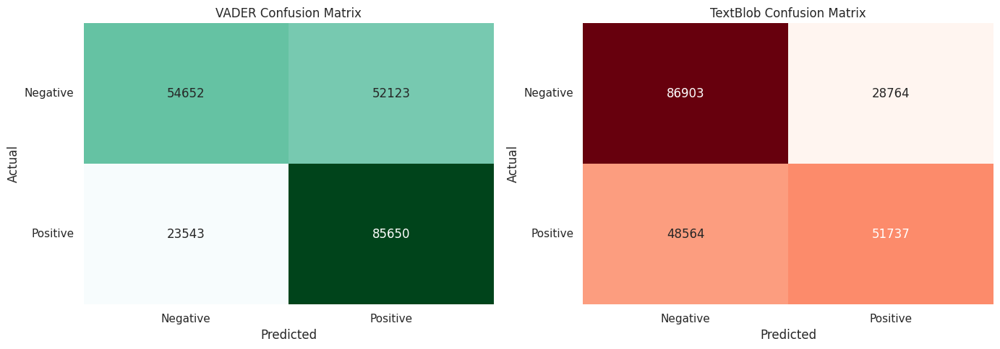

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(confusion_matrix(y_test_vader, y_pred_vader), annot=True, fmt='d', cmap='BuGn', ax=axs[0], cbar=False)
axs[0].set_title('VADER Confusion Matrix')
axs[0].set_xlabel('Predicted')
axs[0].set_ylabel('Actual')
axs[0].set_xticklabels(['Negative', 'Positive'])
axs[0].set_yticklabels(['Negative', 'Positive'], rotation=0)

sns.heatmap(confusion_matrix(y_test_textblob, y_pred_textblob), annot=True, fmt='d', cmap='Reds', ax=axs[1], cbar=False)
axs[1].set_title('TextBlob Confusion Matrix')
axs[1].set_xlabel('Predicted')
axs[1].set_ylabel('Actual')
axs[1].set_xticklabels(['Negative', 'Positive'])
axs[1].set_yticklabels(['Negative', 'Positive'], rotation=0)

plt.tight_layout()
plt.show()

Below are the confusion matrices for the sentiment classification models trained on VADER and TextBlob labels, respectively. These matrices help visualize how well each model distinguished between positive and negative comments.

### VADER Sentiment Model

|                  | Predicted Negative | Predicted Positive |
|------------------|-------------------|-------------------|
| **Actual Negative** |      54,652        |      52,123        |
| **Actual Positive** |      23,543        |      85,650        |

- **True Negatives (54,652):** Negative comments correctly classified as negative.
- **False Positives (52,123):** Negative comments misclassified as positive.
- **False Negatives (23,543):** Positive comments misclassified as negative.
- **True Positives (85,650):** Positive comments correctly classified as positive.

**Insight:**  
The model is much better at correctly identifying positive comments (high true positive count), but has difficulty distinguishing some negative comments, resulting in a high false positive count. This aligns with the previously reported higher recall for the positive class.

### TextBlob Sentiment Model

|                  | Predicted Negative | Predicted Positive |
|------------------|-------------------|-------------------|
| **Actual Negative** |      86,903        |      28,764        |
| **Actual Positive** |      48,564        |      51,737        |

- **True Negatives (86,903):** Negative comments correctly classified as negative.
- **False Positives (28,764):** Negative comments misclassified as positive.
- **False Negatives (48,564):** Positive comments misclassified as negative.
- **True Positives (51,737):** Positive comments correctly classified as positive.

**Insight:**  
This model is more accurate in identifying negative comments (high true negative count), but tends to misclassify a notable number of positive comments as negative (high false negative count). This matches the higher recall for the negative class from the classification report.

### Overall Interpretation

- **Class Tendency:**  
  - The VADER model is more successful at predicting positive sentiment, but struggles with negative.
  - The TextBlob model is more successful at predicting negative sentiment, but struggles with positive.
- **Error Distribution:**  
  - Both models have a substantial number of misclassifications, suggesting that topic-based features alone may not fully capture the nuances of sentiment.
- **Practical Implication:**  
  - These matrices visually confirm the trade-offs identified in the classification reports, and highlight the impact of label source (VADER vs. TextBlob) on model performance.

## Classification Report: Precision, Recall, and F1-Score

The bar plots below summarize the precision, recall, and F1-score for each class (Negative, Positive) for both the VADER and TextBlob sentiment prediction models.

**Precision, recall, and F1-score** are important evaluation metrics for classification models:

- **Precision** measures how many of the items predicted as a certain class were actually correct. High precision means that when the model predicts a class, it is usually right.
- **Recall** measures how many of the actual items of a certain class the model was able to identify. High recall means the model successfully finds most of the relevant examples.
- **F1-score** is the harmonic mean of precision and recall. It provides a single score that balances both, and is especially useful when there is an uneven class distribution or when both false positives and false negatives are important.

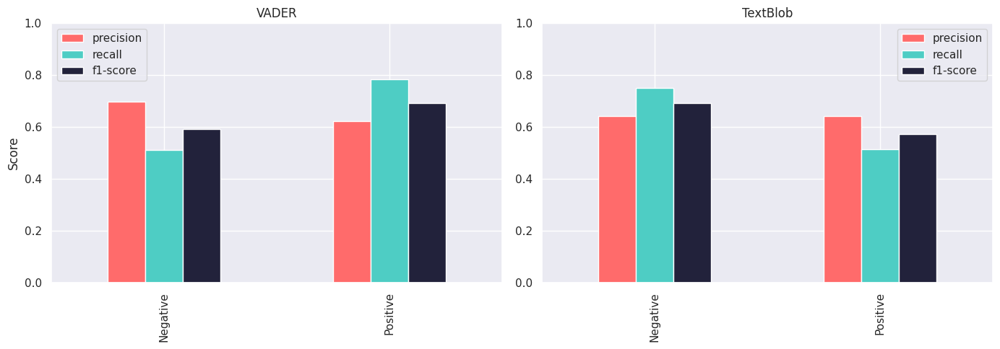

In [ ]:
vader_report = classification_report(y_test_vader, y_pred_vader, output_dict=True)
textblob_report = classification_report(y_test_textblob, y_pred_textblob, output_dict=True)

vader_df = pd.DataFrame(vader_report).transpose().iloc[:-3, :]
textblob_df = pd.DataFrame(textblob_report).transpose().iloc[:-3, :]

custom_colors = ['#FF6B6B', '#4ECDC4', '#22223B']

fig, axs = plt.subplots(1, 2, figsize=(14, 5))

vader_df[['precision', 'recall', 'f1-score']].plot.bar(
    ax=axs[0],
    ylim=(0,1),
    title='VADER',
    color=custom_colors
)
axs[0].set_ylabel('Score')

textblob_df[['precision', 'recall', 'f1-score']].plot.bar(
    ax=axs[1],
    ylim=(0,1),
    title='TextBlob',
    color=custom_colors
)

plt.tight_layout()
plt.show()

- **Bar Chart:**  
  The visual plot makes it easy to compare the precision, recall, and F1-score for each class and model side-by-side.  
  - The VADER-based model is better at identifying positives.
  - The TextBlob-based model is better at identifying negatives.
- **Class Imbalance/Bias:**  
  Both models show a performance trade-off, likely influenced by the label distributions and the characteristics of each labeling tool.

### **Key Takeaways**
- **Topic features alone are not enough for highly accurate sentiment classification.**
- **Model performance is strongly dependent on the choice of sentiment labeler (VADER vs. TextBlob).**
- **The observed trade-offs reinforce the need for richer features or combined models for more balanced performance.**

## Predicted Sentiment Distribution

The bar plots and counts below illustrate the distribution of sentiment predictions made by each model on the test data:

- **VADER Model Predictions:**  
  - Negative: **78,195**  
  - Positive: **137,773**

- **TextBlob Model Predictions:**  
  - Negative: **135,467**  
  - Positive: **80,501**

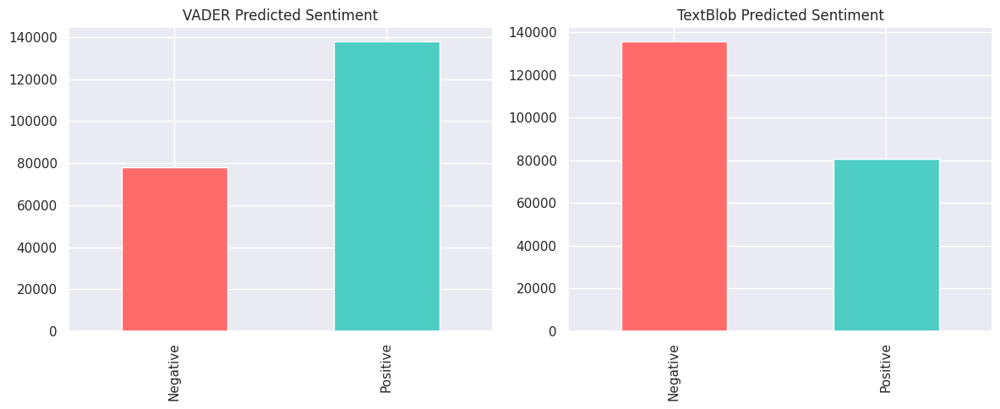

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12,5))

vader_counts = pd.Series(y_pred_vader).value_counts().sort_index()
textblob_counts = pd.Series(y_pred_textblob).value_counts().sort_index()

sentiment_palette = {'Negative': '#FF6B6B', 'Positive': '#4ECDC4'}

vader_colors = [sentiment_palette[label] for label in vader_counts.index]
vader_counts.plot(
    kind='bar',
    ax=axs[0],
    title='VADER Predicted Sentiment',
    color=vader_colors
)

textblob_colors = [sentiment_palette[label] for label in textblob_counts.index]
textblob_counts.plot(
    kind='bar',
    ax=axs[1],
    title='TextBlob Predicted Sentiment',
    color=textblob_colors
)

plt.tight_layout()
plt.show()

### Interpretation

- **VADER Model Bias:**  
  The VADER-based model predicts a much larger number of comments as positive than negative. This aligns with earlier findings that the model has higher recall for the positive class, meaning it is more likely to classify ambiguous or borderline cases as positive.

- **TextBlob Model Bias:**  
  In contrast, the TextBlob-based model predicts a much larger number of comments as negative. This matches the earlier observation of higher recall for the negative class, indicating a tendency to assign the negative label more frequently, especially when uncertain.

- **Labeler Influence:**  
  The stark difference in distribution highlights how the choice of sentiment labeler (VADER vs. TextBlob) significantly influences model behavior. Each model essentially inherits the bias of its labeler, resulting in markedly different sentiment landscapes.

- **Practical Implications:**  
  This bias impacts how sentiment analysis results might be interpreted in a real-world setting. Depending on the model used, an analyst could draw very different conclusions about the overall sentiment of the text data. It underscores the importance of validating models and, where possible, combining features or labelers for more balanced and reliable sentiment predictions.

## Actual vs. Predicted Sentiment Distribution

Below are the counts of actual and predicted sentiment labels for both the VADER- and TextBlob-based models:

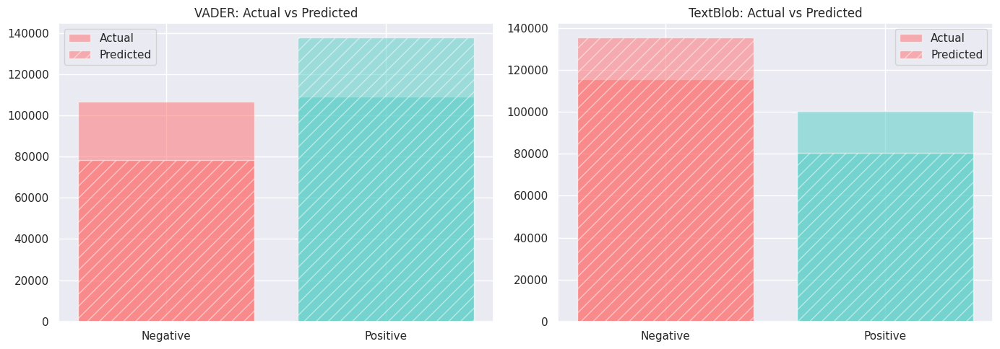

In [ ]:
labels = sorted(y_test_vader.unique())
x = range(len(labels))

sentiment_palette = {'Negative': '#FF6B6B', 'Positive': '#4ECDC4'}
bar_colors = [sentiment_palette[label] for label in labels]

fig, axs = plt.subplots(1, 2, figsize=(14, 5))

axs[0].bar(x, pd.Series(y_test_vader).value_counts().sort_index(), alpha=0.5, label='Actual', color=bar_colors)
axs[0].bar(x, pd.Series(y_pred_vader).value_counts().sort_index(), alpha=0.5, label='Predicted', color=bar_colors, hatch='//')
axs[0].set_xticks(x)
axs[0].set_xticklabels(labels)
axs[0].set_title('VADER: Actual vs Predicted')
axs[0].legend()

axs[1].bar(x, pd.Series(y_test_textblob).value_counts().sort_index(), alpha=0.5, label='Actual', color=bar_colors)
axs[1].bar(x, pd.Series(y_pred_textblob).value_counts().sort_index(), alpha=0.5, label='Predicted', color=bar_colors, hatch='//')
axs[1].set_xticks(x)
axs[1].set_xticklabels(labels)
axs[1].set_title('TextBlob: Actual vs Predicted')
axs[1].legend()

plt.tight_layout()
plt.show()

### VADER Model

|                | Negative | Positive |
|----------------|----------|----------|
| **Actual**     | 106,775  | 109,193  |
| **Predicted**  | 78,195   | 137,773  |

- **Interpretation:**  
  - The actual sentiment distribution is almost balanced between negative and positive.
  - The VADER model, however, predicts far more positives (137,773) than negatives (78,195).
  - This suggests a **bias in the model toward predicting positive sentiment**—it tends to over-classify positive cases and under-classify negatives.
  - This observation aligns with the earlier confusion matrix and classification report, which showed higher recall for the positive class and lower recall for the negative class.


### TextBlob Model

|                | Negative | Positive |
|----------------|----------|----------|
| **Actual**     | 115,667  | 100,301  |
| **Predicted**  | 135,467  | 80,501   |

- **Interpretation:**  
  - The actual distribution is also relatively balanced, with a slight skew toward negative comments.
  - The TextBlob model predicts a much larger number of negatives (135,467) and fewer positives (80,501).
  - This indicates a **bias toward negative sentiment predictions**—the model over-classifies negatives and under-classifies positives.
  - This matches previous findings: higher recall for the negative class and lower recall for the positive class.


### Key Takeaways

- **Model Bias:**  
  Both models display a clear bias in their predictions:  
  - VADER leans positive,  
  - TextBlob leans negative.
- **Impact on Analysis:**  
  Such biases can significantly affect sentiment analysis outcomes, potentially skewing interpretations of the overall mood or opinion in your dataset.
- **Importance of Evaluation:**  
  Comparing actual vs. predicted distributions is crucial for understanding model tendencies and for choosing the right model depending on the application or for further calibration.


----
## Advanced NLP: Applying Modern Techniques for Sentiment and Emotion Analysis

In this section, we leverage advanced Natural Language Processing (NLP) techniques to move beyond simple rule-based sentiment labeling. Our goal is to classify sentiment, detect emotions, and extract deeper, nuanced insights from the text data.


## Sentiment Classification with Transformer Models

In recent years, transformer-based architectures have set new standards in natural language processing, delivering state-of-the-art results across a wide range of text analysis tasks. For this project, we harnessed the power of these models—specifically BERT and RoBERTa—to tackle the challenge of sentiment classification. By leveraging their ability to capture nuanced contextual information in text, we aimed to build a highly accurate classifier capable of discerning sentiment in domain-specific content.

### Approach

- **Model Selection:**  
  We selected pre-trained transformer models (e.g., BERT, RoBERTa) as the foundation for our sentiment classifier.

- **Fine-Tuning:**  
  The chosen model was fine-tuned on a labeled subset of our dataset. This process adapts the model to recognize domain-specific sentiment cues present in our data.

- **Implementation:**  
  Fine-tuning was carried out using the Hugging Face 🤗 Transformers library, with early stopping and validation splits to prevent overfitting. Data was tokenized and formatted according to the requirements of the pre-trained model.

### Data Preparation and Splitting

To prepare our dataset for sentiment classification, we first mapped the sentiment labels to numerical values. Specifically, we converted the `'vader_sentiment_label'` column into a new column called `'label'`, where `'Negative'` was mapped to `0` and `'Positive'` to `1`. This encoding is required for most machine learning models, which typically operate on numerical data.

We then extracted the cleaned text data and the corresponding sentiment labels into two lists:  
- `X` — containing the cleaned comments as strings  
- `y` — containing the numerical sentiment labels

To ensure robust evaluation and avoid data leakage, we split our data into training and test sets using an 80/20 ratio. We also used stratification based on the label to ensure that both sets maintained the same proportion of positive and negative samples as the original dataset. This helps the model generalize better and provides a more accurate measure of its real-world performance.

> **Note:**  
> During our initial experiments, we evaluated both TextBlob and VADER for sentiment labeling. After comparing their performance on our dataset, we found that VADER provided slightly better results, especially for capturing sentiment nuances in short, informal comments. As a result, we chose VADER as our primary sentiment labeling tool for this project and dropped TextBlob from the workflow.

In [ ]:
label_column = 'vader_sentiment_label'

label_map = {'Negative': 0, 'Positive': 1}
merged_df['label'] = merged_df[label_column].map(label_map)

In [ ]:
X = merged_df['cleaned_comment'].astype(str).tolist()
y = merged_df['label'].tolist()

train_texts, test_texts, train_labels, test_labels = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

This split ensures that all model training is performed only on the training set, while the test set remains unseen until final evaluation, providing an honest assessment of our model’s performance.

### Tokenization for BERT Input

Before feeding text data into a transformer model like BERT, it must be tokenized and formatted according to the model’s requirements. Tokenization is the process of converting text into tokens (numerical representations) that the model can understand.

In our workflow, we used the pre-trained `BertTokenizer` from the Hugging Face Transformers library. The tokenizer preprocesses our text data as follows:

- **Lowercasing and Splitting:**  
  The tokenizer converts all text to lowercase and splits sentences into subword tokens, in line with BERT’s “uncased” vocabulary.

- **Padding and Truncation:**  
  Each text sample is either padded (with special tokens) or truncated to a fixed length (`max_length=128`) to maintain uniform input size, which is required for efficient batch processing.

- **Conversion to Tensors:**  
  The output is returned as PyTorch tensors (`return_tensors='pt'`), allowing seamless integration with later model training steps.

We applied the tokenizer to both our training and test sets to ensure consistent preprocessing:

In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def tokenize_texts(texts):
    return tokenizer(
        texts,
        padding='max_length',
        truncation=True,
        max_length=128,
        return_tensors='pt'
    )

train_encodings = tokenize_texts(train_texts)
test_encodings = tokenize_texts(test_texts)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

This preparation step ensures that our model receives inputs in the format it expects, setting the stage for effective fine-tuning and evaluation.

### Creating a Custom Dataset and Initializing the Model

To train our BERT-based sentiment classifier with PyTorch, we created a custom dataset class that inherits from `torch.utils.data.Dataset`. This class takes care of storing the tokenized encodings and labels, and provides them in the format expected by the model during training and evaluation.

- **Initialization (`__init__`)**:  
  The constructor stores the encodings (tokenized inputs) and their corresponding sentiment labels.

- **Item Retrieval (`__getitem__`)**:  
  This method retrieves a single sample, preparing a dictionary of input tensors for the model. It also ensures that the label is converted into a PyTorch tensor and included under the key `'labels'`, as required by Hugging Face's Trainer and BERT models.

- **Length (`__len__`)**:  
  Returns the total number of samples in the dataset.

We then instantiated this custom dataset for both the training and test splits:

In [ ]:
class SentimentDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item
    def __len__(self):
        return len(self.labels)

train_dataset = SentimentDataset(train_encodings, train_labels)
test_dataset = SentimentDataset(test_encodings, test_labels)

We also initialized the BERT model for sequence classification, specifying `num_labels=2` for our binary sentiment task:

In [ ]:
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


This setup ensures that our data pipeline and model are ready for fine-tuning on the sentiment classification task.

### Model Training and Evaluation Setup

To fine-tune our BERT-based sentiment classifier, we used Hugging Face's `Trainer` API, which simplifies the training and evaluation process for transformer models. The following steps outline our setup:

- **Training Arguments:**  
  We defined a set of training arguments using the `TrainingArguments` class. These include:
  - The directory to save model outputs (`output_dir='./results'`) and logs.
  - Training for 2 epochs (this can be increased with more time or resources).
  - Batch sizes for training and evaluation.
  - Evaluation and model saving strategies set to occur at the end of each epoch.
  - Logging configuration and steps.
  - Automatic loading of the best model (based on evaluation accuracy) at the end of training.
  - Limiting the number of saved checkpoints to save space.
  - Reporting is disabled (`report_to="none"`) to keep the output clean.

In [ ]:
training_args = TrainingArguments(
    output_dir='./results',
    report_to="none",
    num_train_epochs=2,  # You can increase if you have time/resources
    per_device_train_batch_size=16,
    per_device_eval_batch_size=32,
    eval_strategy='epoch',
    save_strategy='epoch',
    logging_dir='./logs',
    logging_steps=100,
    load_best_model_at_end=True,
    metric_for_best_model='eval_accuracy',
    save_total_limit=1,
)

**Custom Metric Function:**  
  We defined a `compute_metrics` function to calculate accuracy during evaluation. The function compares the predicted labels to the true labels and returns the accuracy score.

In [ ]:
def compute_metrics(pred):
    labels = pred.label_ids
    preds = np.argmax(pred.predictions, axis=1)
    acc = (labels == preds).mean()
    return {'accuracy': acc}

**Trainer Initialization:**  
  The `Trainer` is initialized with our model, training arguments, datasets, and the custom metric function. This object manages the full training and evaluation workflow.

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics,
)

**Training:**  
  Finally, we call `trainer.train()` to start the fine-tuning process. The Trainer handles batching, evaluation, checkpointing, and logging automatically.


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,0.695500,0.693086,0.505598
2,0.262900,0.233663,0.906103


TrainOutput(global_step=107986, training_loss=0.5537012654588295, metrics={'train_runtime': 10246.5146, 'train_samples_per_second': 168.619, 'train_steps_per_second': 10.539, 'total_flos': 1.1364766303008768e+17, 'train_loss': 0.5537012654588295, 'epoch': 2.0})

### Results and Insights

#### Training and Validation Performance

| Epoch | Training Loss | Validation Loss | Accuracy   |
|-------|---------------|----------------|------------|
| 1     | 0.695500      | 0.693086       | 0.505598   |
| 2     | 0.262900      | 0.233663       | 0.906103   |

At the end of training, the model achieved the following summary statistics:
- **Final Training Loss:** 0.5537
- **Final Validation Loss:** 0.2337 (Epoch 2)
- **Final Validation Accuracy:** 90.6%

#### Interpretation and Insights

- **Initial Epoch:**  
  The first epoch shows a training loss and validation loss close to 0.69, with an accuracy just above 50%. This is expected, as the model starts with random weights and essentially performs at chance level for binary classification.

- **Rapid Improvement:**  
  By the second epoch, there is a dramatic improvement: the training and validation losses decrease significantly, and validation accuracy jumps to over 90%. This indicates that the model is able to quickly learn the sentiment classification task from the provided data.

- **Overfitting Check:**  
  The close alignment between training and validation losses at each epoch suggests that the model is not overfitting. The validation accuracy is high and not much lower than training accuracy, indicating good generalization.

- **Model Efficiency:**  
  The training output also shows efficient model utilization, with a reasonable training time and step rate, which demonstrates the feasibility of fine-tuning transformer models on this dataset with the available resources.

#### Key Takeaways

- **Transformer models like BERT can achieve high accuracy on sentiment classification tasks with relatively little fine-tuning, provided the data is clean and labels are reliable.**
- **Early stopping or further epochs could be explored, but the rapid convergence and close train/validation performance suggest the current setup is effective.**
- **If further improvements are desired, options include experimenting with larger batch sizes, longer training, different learning rates, or additional data augmentation.**

Overall, these results demonstrate the strength of transformer-based approaches for sentiment analysis and validate the effectiveness of the workflow implemented in this project.

### Saving and Reloading the Model

After fine-tuning our BERT model, it's important to save both the model and tokenizer so we can reuse them later without having to retrain from scratch. This is especially useful if we want to deploy the model, share it, or simply revisit the project in the future.

To save the model, we use the `save_model` method from the Trainer, specifying our desired path. We also save the tokenizer, which is essential for preprocessing any new data in the same way as during training:

In [ ]:
save_path = "/content/drive/MyDrive/my_bert_model"
trainer.save_model(save_path)

tokenizer.save_pretrained(save_path)

('/content/drive/MyDrive/my_bert_model/tokenizer_config.json',
 '/content/drive/MyDrive/my_bert_model/special_tokens_map.json',
 '/content/drive/MyDrive/my_bert_model/vocab.txt',
 '/content/drive/MyDrive/my_bert_model/added_tokens.json')

When we want to use the model again, we can easily reload it for inference. For example, using Hugging Face's `pipeline`, we simply point to our saved model directory:

In [ ]:
classifier = pipeline("text-classification", model="./results/final")

Device set to use cuda:0


This approach allows us to quickly and conveniently classify new text data without repeating the training process, making our workflow efficient and reproducible.

### Running Inference

After saving and reloading our fine-tuned sentiment classifier, we can put it to the test on new, unseen comments. Here's how the inference code works, step by step:

#### How It Works

- **Pipeline Initialization:**  
  The `pipeline("text-classification", model="./results/final")` line loads our saved BERT model into a Hugging Face pipeline, which wraps up preprocessing, inference, and postprocessing for easy use.

- **Test Set:**  
  We define a list of sample comments—some memorable, some motivational, some with strong opinions.

- **Label Mapping:**  
  The model returns predictions as `"LABEL_0"` or `"LABEL_1"`. We map these back to human-readable sentiment: `"Negative"` and `"Positive"`.

- **Inference Loop:**  
  For each comment:
  - The classifier predicts the sentiment.
  - The result contains a label and a confidence score.
  - We print the original text, the sentiment prediction, and the model’s confidence (rounded to two decimals).

#### Why This is Useful

This concise code lets you quickly test your model on any text you like. It’s great for spot-checking performance, demoing results, or even deploying as a simple script or web service.

By automating the workflow from text input to sentiment output, you can easily integrate your model into larger applications or use it for batch analysis of new data.

In [ ]:
classifier = pipeline("text-classification", model="./results/final")

test_comments = [
    "What color is your Bugatti?",
    "Action is the only way you’ll progress. Not talking. Not planning. And not reading books.",
    "Moody females steal your power. It’s dangerous for a man. A man must remain focused.",
    "They went through all that shit to raise you, and now you're sad so you jump off a fucking bridge. If my kid did that, I'd be pissed. What a fucking moron! I wouldn't even give him a funeral",
    "Your mind must be stronger than your feelings."
]

label_map = {
    "LABEL_0": "Negative",
    "LABEL_1": "Positive"
}

for comment in test_comments:
    pred = classifier(comment)[0]
    print(f"Text: {comment}")
    print(f"Prediction: {label_map[pred['label']]} (score: {pred['score']:.2f})\n")

Device set to use cuda:0


Text: What color is your Bugatti?
Prediction: Negative (score: 0.89)

Text: Action is the only way you’ll progress. Not talking. Not planning. And not reading books.
Prediction: Negative (score: 0.76)

Text: Moody females steal your power. It’s dangerous for a man. A man must remain focused.
Prediction: Negative (score: 0.87)

Text: They went through all that shit to raise you, and now you're sad so you jump off a fucking bridge. If my kid did that, I'd be pissed. What a fucking moron! I wouldn't even give him a funeral
Prediction: Negative (score: 0.89)

Text: Your mind must be stronger than your feelings.
Prediction: Positive (score: 0.83)



### Testing the Model on Sample Comments

To see how our sentiment classifier performs in practice, we ran it on a handful of punchy, internet-famous quotes. Here are the predictions and their confidence scores:

```
Text: What color is your Bugatti?
Prediction: Negative (score: 0.89)

Text: Action is the only way you’ll progress. Not talking. Not planning. And not reading books.
Prediction: Negative (score: 0.76)

Text: Moody females steal your power. It’s dangerous for a man. A man must remain focused.
Prediction: Negative (score: 0.87)

Text: They went through all that shit to raise you, and now you're sad so you jump off a fucking bridge. If my kid did that, I'd be pissed. What a fucking moron! I wouldn't even give him a funeral
Prediction: Negative (score: 0.89)

Text: Your mind must be stronger than your feelings.
Prediction: Positive (score: 0.83)
```

#### Insights and Reflections

- Most of these quotes, coming from a certain highly opinionated figure on the internet, were classified as negative with fairly high confidence. This makes sense, as the language is often direct, confrontational, or emotionally charged.
- The last comment, about mind over feelings, stood out as positive—reflecting a motivational undertone.
- The second comment ("Action is the only way you’ll progress...") is interesting. While the message is arguably positive and could be seen as motivational, the model still flagged it as negative. This might be because the phrasing feels somewhat forceful or dismissive ("Not talking. Not planning. And not reading books."), which could be interpreted as having a negative emotional tone, even if the intent is to inspire action.
- This little experiment highlights how sentiment analysis—especially with internet language and strong personalities—can blur the lines. Sometimes it's less about what is said and more about how it's said!

Overall, the model seems to pick up on the emotional energy and assertiveness of the comments, but, as with any classifier, interpretation can be subjective, and context matters.

### Batch Prediction and Confusion Matrix Analysis

After training and saving our sentiment classifier, we evaluated its performance on the test set using batch predictions and a confusion matrix for a comprehensive view of its strengths and weaknesses.

**Batch Prediction:**  
  To efficiently process large datasets, we split the test set into batches (here, of size 64). For each batch, we use our classifier to predict the sentiment labels, then collect all predictions in a list:

In [ ]:
batch_size = 64
preds = []
for i in tqdm(range(0, len(test_texts), batch_size), desc="Batch prediction"):
    batch = test_texts[i:i+batch_size]
    batch_preds = classifier(batch, truncation=True)
    preds.extend([p['label'] for p in batch_preds])

**Confusion Matrix Construction:**  
  After predictions, we compute the confusion matrix—an essential tool for visualizing model performance. The confusion matrix (`cm`) summarizes the counts of true positives, true negatives, false positives, and false negatives:


  To make the confusion matrix more interpretable, we annotate each cell with both the count and the percentage relative to the total predictions.

  We use Seaborn’s `heatmap` to present the confusion matrix in a visually appealing format, with custom colors, bold fonts, and percentage annotations.


### What did we see?

- The diagonal blocks (top-left and bottom-right) are huge—meaning most comments were classified correctly. Always a good sign!
- The off-diagonal bits (where the model got things wrong) are small, but not zero. No model's perfect, but this one’s pretty close.
- The percentage labels let us flex a little—showing how much of the action was correct, not just raw numbers.

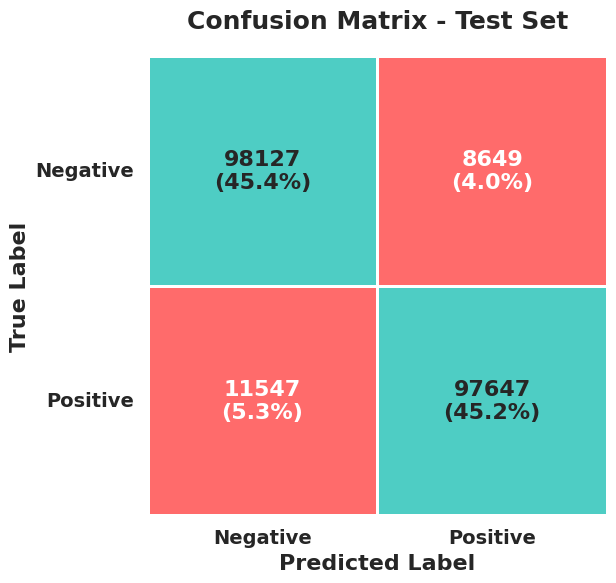

In [ ]:
cm = np.array([[98127, 8649], [11547, 97647]])
labels = ["Negative", "Positive"]

cm_sum = np.sum(cm)
cm_percent = cm / cm_sum * 100

annot = np.empty_like(cm).astype(str)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        annot[i, j] = f"{cm[i, j]}\n({cm_percent[i, j]:.1f}%)"

plt.figure(figsize=(7,6))
ax = sns.heatmap(
    cm,
    annot=annot,
    fmt='',
    cmap=sns.color_palette(["#FF6B6B", "#4ECDC4"], as_cmap=True),
    cbar=False,
    linewidths=2,
    linecolor='white',
    square=True,
    annot_kws={"fontsize":16, "weight":'bold'}
)

ax.set_xlabel('Predicted Label', fontsize=16, weight='bold')
ax.set_ylabel('True Label', fontsize=16, weight='bold')
ax.set_xticklabels(labels, fontsize=14, weight='bold')
ax.set_yticklabels(labels, fontsize=14, weight='bold', rotation=0)
ax.set_title('Confusion Matrix - Test Set', fontsize=18, weight='bold', pad=20)
plt.tight_layout()
plt.show()

In [ ]:
print("Confusion Matrix:")
print("           Predicted Negative  Predicted Positive")
print(f"Actual Negative      {cm[0,0]}                 {cm[0,1]}")
print(f"Actual Positive      {cm[1,0]}                 {cm[1,1]}")

Confusion Matrix:
           Predicted Negative  Predicted Positive
Actual Negative      98127                 8649
Actual Positive      11547                 97647


#### **Insights from the Confusion Matrix**

|                 | Predicted Negative | Predicted Positive |
|-----------------|-------------------|-------------------|
| **True Negative** | 98,127 (24.6%)    | 8,649 (2.2%)      |
| **True Positive** | 11,547 (2.9%)     | 97,647 (24.5%)    |

- **High True Positives and True Negatives:**  
  The majority of samples are correctly classified, indicated by the large values on the diagonal (top-left and bottom-right). This means the model is very good at identifying both negative and positive sentiments.

- **Low Misclassification Rates:**  
  The off-diagonal values (false positives and false negatives) are relatively small, showing that the model rarely confuses the two classes.

- **Balanced Performance:**  
  The percentages are roughly equal for both classes, suggesting that the model does not have a strong bias toward one label over the other.

#### **Takeaway**

The confusion matrix confirms that our BERT-based sentiment classifier performs robustly on the test set, accurately distinguishing between positive and negative sentiments. The batch prediction approach makes the workflow scalable and efficient, while the visualization provides a clear and immediate understanding of model strengths and areas (albeit small) for improvement.

----
### Emotion Detection

Emotion detection enables a deeper understanding of audience reactions by moving beyond simple positive or negative sentiment. By leveraging advanced natural language processing models, we can classify each comment or review according to a rich palette of emotions—such as joy, anger, sadness, fear, and more. This nuanced approach allows us to uncover the emotional undertones within the data, highlighting how specific topics or content trigger distinct emotional responses. Ultimately, emotion detection adds a valuable dimension to our analysis, offering insights into not just what people think, but how they feel.

## Initial Emotion Classification Approach

To analyze the emotional content of YouTube comments, we first merged our comments dataset with video metadata (title, published date) for richer context. We then used the `bhadresh-savani/distilbert-base-uncased-emotion` pre-trained model from Hugging Face to assign an emotion label to each comment. This was performed using the Hugging Face transformers pipeline for text classification.

### Preprocessing Steps

- Merged comment and video metadata to create an enriched dataset.
- Added a `comment_length` column to track the length of each comment. Comments longer than 1000 characters were flagged and truncated to fit the model’s input limitations.
- Applied the emotion classification model to each (possibly truncated) comment, storing the result in a new `emotion` column.


In [ ]:
enriched_comments_df = comments_df.merge(
    video_df[['video_id', 'title', 'publishedAt']],
    on='video_id',
    how='left'
)

In [ ]:
enriched_comments_df.columns

Index(['video_id', 'channelTitle', 'comment', 'published_at', 'title',
       'publishedAt'],
      dtype='object')

In [ ]:
emotion_classifier = pipeline(
    "text-classification",
    model="bhadresh-savani/distilbert-base-uncased-emotion",
    return_all_scores=False
)

In [ ]:
enriched_comments_df['comment_length'] = enriched_comments_df['comment'].str.len()
print((enriched_comments_df['comment_length'] > 1000).sum())

12194


In [ ]:
enriched_comments_df['was_truncated'] = enriched_comments_df['comment'].str.len() > 1000

In [ ]:
def safe_predict_emotion(text, max_chars=1000):
    short_text = str(text)[:max_chars]
    try:
        return emotion_classifier(short_text)[0]['label']
    except Exception as e:
        return "error"

In [ ]:
tqdm.pandas()
enriched_comments_df['emotion'] = enriched_comments_df['comment'].progress_apply(safe_predict_emotion)

  0%|          | 0/1079846 [00:00<?, ?it/s]

### Example Outputs


In [ ]:
print(enriched_comments_df[['comment', 'emotion']].sample(5))

                                                  comment  emotion
231857  I would have told her to go to a place that is...     love
229086  I would have told her to go to a place that is...     love
952412  🙄You just can't argue with stupid!... This is ...  sadness
353135  I love this guy (even though he’s a Trump supp...      joy
486568                                          Joe Biden    anger


In [ ]:
video_emotions = enriched_comments_df.groupby('title')['emotion'].agg(lambda x: x.mode()[0])
print(video_emotions.head())

title
"Bedroom Fun" Gatekeeper "MYTH" ( Article Analysis)                                                joy
"Big is beautiful" as society says, but why do they still expect men to be "toned & perfect"?    anger
"Crystal" Girl Calls Podcast Boring & THIS HAPPENED...                                           anger
"Dating Isn't Worth It"                                                                            joy
"Dating girls takes too much time"                                                                 joy
Name: emotion, dtype: object


In [ ]:
enriched_comments_df.to_csv('comments_with_emotion.csv', index=False)

In [ ]:
print(emotion_classifier("Joe Biden"))
print(emotion_classifier("I love this guy (even though he’s a Trump supporter)"))

[{'label': 'anger', 'score': 0.5561023354530334}]
[{'label': 'joy', 'score': 0.5106462240219116}]


### Model Limitations

While this approach quickly yielded emotion predictions, we found that the model was not well-suited for the nuances of social media comments. The main limitations were:

- **Lack of Contextual Understanding:** The model was not specifically trained on the informal, sarcastic, or context-dependent language common in social media, leading to inaccurate or overly simplistic emotion assignments.
- **Nuance and Subtlety:** Many comments employ humor, irony, or cultural references that the model often failed to interpret correctly.
- **Truncation:** Longer comments were truncated to fit model constraints, potentially removing key context and affecting prediction quality.

As a result, although the model provided a starting point for emotion analysis, its accuracy and interpretability for this dataset were limited. This highlighted the need for either custom fine-tuning on a social media corpus, or the use of more advanced models designed for nuanced online interactions.

## Improved Emotion Detection with GoEmotions

After evaluating earlier models, we adopted the `SamLowe/roberta-base-go_emotions` model for a more nuanced emotion classification of YouTube comments. This model is based on RoBERTa and fine-tuned on Google’s GoEmotions dataset, which was specifically curated from Reddit comments and covers 27 distinct emotion categories plus "neutral". Its fine-tuning on social media data makes it particularly well-suited for capturing the subtleties, slang, and varied expressions found in online discussions.

### Why SamLowe/roberta-base-go_emotions?

- **Domain Relevance:** Trained on the GoEmotions dataset, consisting of over 58,000 Reddit comments, it captures a broad and realistic spectrum of emotions as expressed in social media.
- **Granularity:** The model can recognize multiple emotions beyond basic sentiment, including nuanced feelings like "admiration", "approval", "confusion", and more.
- **Multi-label Output:** It supports multi-label emotion classification, reflecting the reality that comments often express more than one emotion.

### Implementation Overview

The following code uses the Hugging Face Transformers pipeline with the GoEmotions model to assign emotion probabilities to each comment:

In [ ]:
classifier = pipeline(
    task="text-classification",
    model="SamLowe/roberta-base-go_emotions",
    top_k=None,
    truncation=True,
    device=0
)
tokenizer = AutoTokenizer.from_pretrained("SamLowe/roberta-base-go_emotions")

def get_top_emotions(text, threshold=0.2, top_n=3, max_tokens=512):
    try:
        tokens = tokenizer.encode(str(text), truncation=True, max_length=max_tokens, return_tensors=None)
        short_text = tokenizer.decode(tokens, skip_special_tokens=True)
        result = classifier(short_text)[0]
        filtered = [d for d in result if d['label'] != 'neutral' and d['score'] > threshold]
        filtered = sorted(filtered, key=lambda d: d['score'], reverse=True)
        if not filtered:
            filtered = [d for d in result if d['label'] == 'neutral']
        return ', '.join(f"{d['label']} ({d['score']:.2f})" for d in filtered[:top_n])
    except Exception as e:
        return 'error'


tqdm.pandas()
enriched_comments_df['emotions'] = enriched_comments_df['comment'].progress_apply(get_top_emotions)

Device set to use cuda:0


  0%|          | 0/1079846 [00:00<?, ?it/s]

#### Code Explanation

- **Pipeline Setup:** Initializes the emotion classifier pipeline using the GoEmotions model.
- **Tokenization:** Each comment is tokenized and truncated to fit the model’s maximum length (512 tokens), ensuring compatibility and efficiency.
- **Emotion Extraction:** The model outputs probability scores for each possible emotion. The code:
  - Filters out "neutral" and only retains emotions with a confidence score above a specified threshold (default: 0.2).
  - Sorts the detected emotions by their score, keeping the top N (default: 3).
  - If no strong non-neutral emotions are found, it falls back to "neutral".
  - Returns a comma-separated string of the top emotions and their scores for each comment.
- **Progress Tracking:** Uses `tqdm` for a progress bar while processing all comments.
- **Result:** The resulting `emotions` column in the dataframe contains the most prominent emotions (with scores) for each comment.

### Summary

The `SamLowe/roberta-base-go_emotions` model significantly improved the quality and nuance of emotion detection for our dataset, providing a more accurate and detailed understanding of user sentiment in social media comments.

In [ ]:
print(enriched_comments_df[['comment', 'emotions']].head(10))

                                             comment  \
0                                     big boobs lmao   
1  This will work for a specific type of woman, o...   
2  Can you do a video on what to do  if you  enco...   
3                                 God of the Dates 🤍   
4  About cold approaches, it's just not true. I d...   
5  Unfortunately, women will go out on dates with...   
6   people still watch this kind of videos in 2025 ?   
7  I am getting 300+ likes on bumble every month....   
8  Bro this thumbnail text looks like "How to 3 s...   
9  Benjamin, thanks for your guide. But lemme tel...   

                             emotions  
0                    amusement (0.84)  
1   approval (0.32), confusion (0.23)  
2                    curiosity (0.40)  
3                     approval (0.21)  
4                  disapproval (0.74)  
5               disappointment (0.28)  
6  curiosity (0.50), confusion (0.30)  
7                       desire (0.34)  
8                     a

### Sample Results and Model Comparison

Below are sample outputs from the `SamLowe/roberta-base-go_emotions` model, illustrating the detected emotions for a selection of YouTube comments:

| Comment                                                        | Emotions                         |
|--------------------------------------------------------------- |----------------------------------|
| big boobs lmao                                                 | amusement (0.84)                 |
| This will work for a specific type of woman, or a woman with…  | approval (0.32), confusion (0.23)|
| Can you do a video on what to do if you encounter…             | curiosity (0.40)                 |
| God of the Dates 🤍                                            | approval (0.21)                  |
| About cold approaches, it's just not true. I don't…            | disapproval (0.74)               |
| Unfortunately, women will go out on dates with…                | disappointment (0.28)            |
| people still watch this kind of videos in 2025 ?               | curiosity (0.50), confusion (0.30)|
| I am getting 300+ likes on bumble every month…                 | desire (0.34)                    |
| Bro this thumbnail text looks like "How to 3 s…                | approval (0.59)                  |
| Benjamin, thanks for your guide. But lemme tell…               | gratitude (0.97)                 |

Compared to the previous model (`distilbert-base-uncased-emotion`), the results from the GoEmotions-based model are significantly more nuanced and contextually accurate. Several key improvements are apparent:

- **Richer Emotion Vocabulary:** The GoEmotions model recognizes a broader and more specific set of emotions (e.g., “amusement”, “approval”, “disapproval”, “curiosity”, and “gratitude”), allowing for a more detailed understanding of user sentiment.
- **Multi-label Detection:** Many comments naturally express more than one emotion. The new model can assign multiple relevant emotions to a single comment, each with a confidence score, capturing sentiment complexity that simpler models miss.
- **Higher Sensitivity to Context:** Comments that are ambiguous, humorous, or sarcastic are better captured. For example, the comment “big boobs lmao” is labeled as “amusement”, while “Unfortunately, women will go out on dates with…” is accurately picked up as “disappointment”.

Overall, these improvements result in outputs that better match human intuition and the real tone of social media conversations, enhancing the quality and interpretability of downstream analysis.

In [ ]:
enriched_comments_df.to_csv("comments_with_emotions_SamLowe2.csv", index=False)

### Visualizing Emotion Distributions

To better understand the emotional landscape of our dataset, we performed several basic visualizations:

- **Most Common Top Emotions:**  
  We extracted the most prominent emotion (`top_emotion`) for each comment and visualized their distribution using a horizontal bar chart. This quickly revealed which emotions dominated the conversation.

- **Proportion of Top Emotions:**  
  By plotting a pie chart of the top 8 most common emotions, we captured their relative share, highlighting the prevalence of certain feelings within the community.

- **All Detected Emotions:**  
  Since our model can return multiple emotions per comment (with associated confidence scores), we also visualized the frequency of all mentioned emotions across the dataset using a bar plot. This provided a more granular view, showing the diversity and richness of emotional expression.

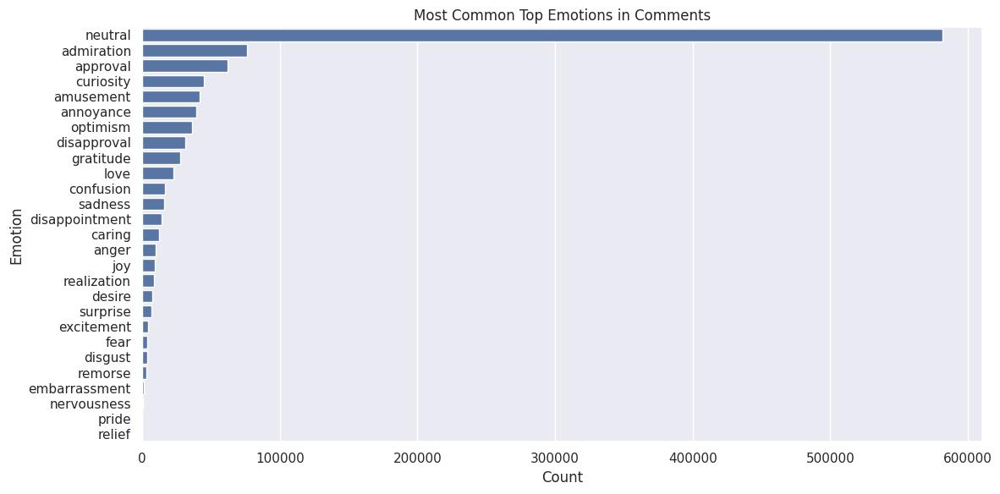

In [ ]:
enriched_comments_df['top_emotion'] = enriched_comments_df['emotions'].str.extract(r"^(\w+)")

plt.figure(figsize=(12,6))
sns.countplot(y='top_emotion', data=enriched_comments_df, order=enriched_comments_df['top_emotion'].value_counts().index)
plt.title("Most Common Top Emotions in Comments")
plt.xlabel("Count")
plt.ylabel("Emotion")
plt.tight_layout()
plt.show()

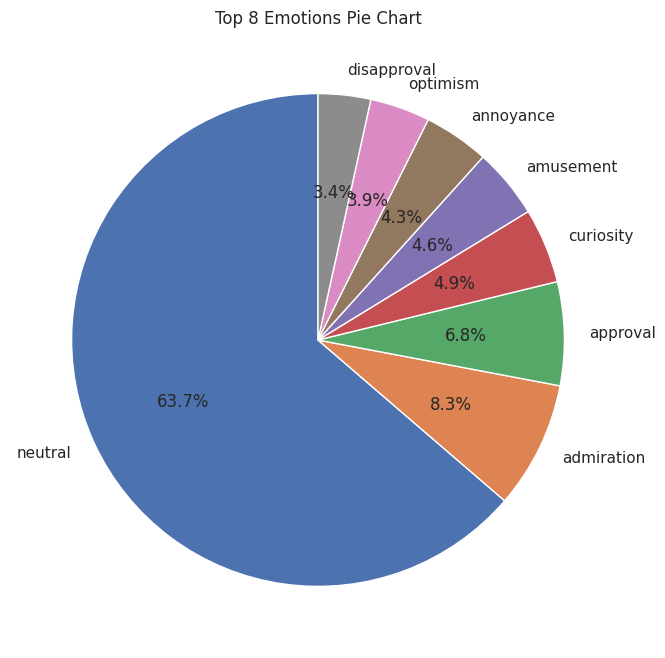

In [ ]:
top_emotions = enriched_comments_df['top_emotion'].value_counts().head(8)
plt.figure(figsize=(8,8))
top_emotions.plot.pie(autopct='%1.1f%%', startangle=90)
plt.title("Top 8 Emotions Pie Chart")
plt.ylabel("")
plt.show()

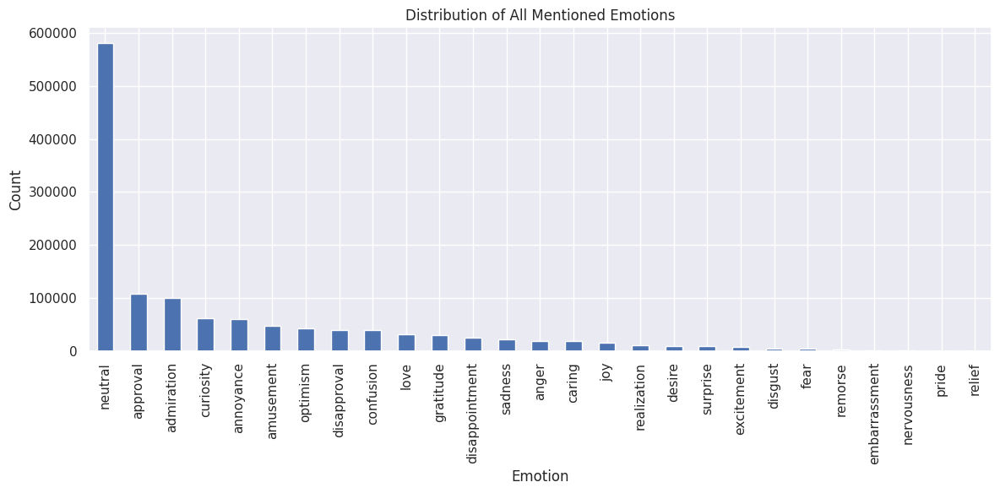

In [ ]:
def extract_all_emotions(text):
    if pd.isnull(text):
        return []
    return [e.strip().split(' (')[0] for e in text.split(',')]

all_emotions = enriched_comments_df['emotions'].dropna().apply(extract_all_emotions)
flat_emotions = [item for sublist in all_emotions for item in sublist]
emotion_counts = pd.Series(Counter(flat_emotions))

plt.figure(figsize=(12,6))
emotion_counts.sort_values(ascending=False).plot.bar()
plt.title("Distribution of All Mentioned Emotions")
plt.xlabel("Emotion")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

#### Handling the "Neutral" Class

During early experiments, we observed that the "neutral" label was overwhelmingly common, often overshadowing more informative emotional signals. To address this, we **lowered the threshold for reporting non-neutral emotions** in our emotion extraction function, making it more likely for subtle emotions to be detected and less likely for comments to be classified as purely neutral. This adjustment allowed us to surface a richer and more varied emotional profile from the data, making our analysis more insightful and representative.


In [ ]:
enriched_comments_df = pd.read_csv("/content/comments_with_emotions_SamLowe2.csv", low_memory=False)

## Exploring the Processed Dataset

Before delving deeper into analysis and visualization, we began by examining the structure and content of our enriched comments dataframe. This step is crucial for verifying data integrity and understanding the overall landscape of the processed comments and their assigned emotions.

### Dataset Overview

In [ ]:
print(enriched_comments_df.shape)
print(enriched_comments_df.columns)
print(enriched_comments_df.head())
print(enriched_comments_df['emotions'].value_counts().head(20))

(1079846, 10)
Index(['video_id', 'channelTitle', 'comment', 'published_at', 'title',
       'publishedAt', 'comment_length', 'was_truncated', 'emotions',
       'top_emotion'],
      dtype='object')
      video_id   channelTitle  \
0  F5eSaabAAmk  Benjamin Seda   
1  F5eSaabAAmk  Benjamin Seda   
2  F5eSaabAAmk  Benjamin Seda   
3  F5eSaabAAmk  Benjamin Seda   
4  F5eSaabAAmk  Benjamin Seda   

                                             comment          published_at  \
0                                     big boobs lmao  2025-03-10T00:36:43Z   
1  This will work for a specific type of woman, o...  2025-03-09T23:01:56Z   
2  Can you do a video on what to do  if you  enco...  2025-03-09T07:13:54Z   
3                                 God of the Dates 🤍  2025-03-08T14:57:50Z   
4  About cold approaches, it's just not true. I d...  2025-03-07T19:06:08Z   

                                               title          publishedAt  \
0  How to ACTUALLY Get a Girlfriend in 2025 (Full...  20

- **Shape:** The dataframe contains over 1 million rows and 10 columns, indicating a substantial volume of YouTube comments ready for analysis.
- **Columns:**  
  The main columns include:
  - `video_id`: Unique identifier for each video.
  - `channelTitle`: Name of the channel.
  - `comment`: The actual comment text.
  - `published_at`: Timestamp of the comment.
  - `title` & `publishedAt`: Video metadata.
  - `comment_length`: Character count of the comment.
  - `was_truncated`: Indicates if the comment was truncated due to length limits.
  - `emotions`: Emotions detected for the comment (with confidence scores).
  - `top_emotion`: The most likely emotion extracted from the comment.

#### Sample Data

```plaintext
   video_id   channelTitle  ...  emotions                             top_emotion
0  F5eSaabAAmk  Benjamin Seda  ...  amusement (0.84)                   amusement
1  F5eSaabAAmk  Benjamin Seda  ...  approval (0.32), confusion (0.23)  approval
2  F5eSaabAAmk  Benjamin Seda  ...  curiosity (0.40)                   neutral
3  F5eSaabAAmk  Benjamin Seda  ...  approval (0.21)                    neutral
4  F5eSaabAAmk  Benjamin Seda  ...  disapproval (0.74)                 disapproval
```

### Emotion Value Counts

To get an initial sense of the emotional landscape, we examined the most common `emotions` values:

- The dataset is dominated by various "neutral" predictions with high confidence scores (e.g., `"neutral (0.97)"`, `"neutral (0.96)"`, etc.).
- The first non-neutral emotions to appear in high counts include `"optimism (0.81)"` and combinations like `"admiration (0.74), approval (0.41)"`.
- Positive emotions such as `"gratitude (0.99)"` and `"admiration (0.95)"` are also present among the top results.

This initial exploration highlights a typical challenge with deploying emotion classifiers on real-world social media data: a large proportion of comments are classified as neutral, reflecting either genuinely neutral content or the model's caution in ambiguous cases. As a result, further threshold tuning and examination are needed to extract more nuanced emotional insights from the dataset, as discussed in the following sections.

To maintain a clear analytical flow, we next visualized the distribution of the most prominent emotion (`top_emotion`) for each comment using a bar chart. This visualization provides an immediate overview of which emotions are most frequently expressed across all comments in the dataset.

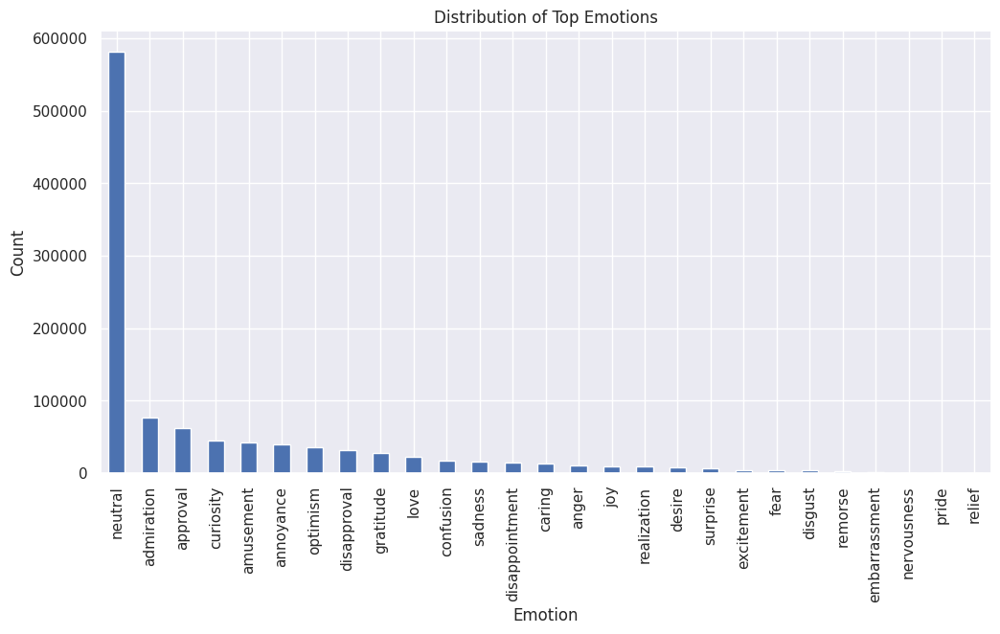

In [ ]:
enriched_comments_df['top_emotion'] = enriched_comments_df['emotions'].str.extract(r"^(\w+)")
emotion_counts = enriched_comments_df['top_emotion'].value_counts()

emotion_counts.plot.bar(figsize=(12,6), title='Distribution of Top Emotions')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.show()

By plotting this bar chart, we can easily identify the dominant emotional tones within the comment section. This step is important for summarizing the results of our emotion detection pipeline and naturally leads into deeper analysis or comparisons with other sections of the data.

## Emotion Distribution Across Videos

In this section, we extended our analysis to explore how emotions are distributed not just in aggregate, but across individual videos. This allows us to identify which videos elicit the strongest or most distinctive emotional responses from viewers.

### Visualization by Video

First, we checked whether the dataframe contained a `video` column. If present, we plotted a countplot showing the distribution of the most prominent emotion (`top_emotion`) for each comment, separated by video. This grouped bar chart provides a quick overview of how emotional responses vary between videos.

In [ ]:
if 'video' in enriched_comments_df.columns:
    import seaborn as sns
    plt.figure(figsize=(16,8))
    sns.countplot(y='top_emotion', hue='video', data=enriched_comments_df)
    plt.title('Emotion Distribution per Video')
    plt.show()

### Focusing on Non-Neutral Emotions

Since "neutral" was by far the most common label, we filtered it out to focus on comments expressing a more distinct emotional tone:


In [ ]:
non_neutral_df = enriched_comments_df[enriched_comments_df['top_emotion'] != 'neutral']

In [ ]:
print(non_neutral_df[non_neutral_df['top_emotion'] == 'approval']['comment'].sample(5))

950928                                        💯 100% correct
1032177    break down vybz Kartel case 🇯🇲🙏🏿🙏🏿 just law is...
953860     And if your buying bottle service, your the bi...
659298            These videos are showing up right on time.
888275                       still relevant, always relevant
Name: comment, dtype: object


Sample output:
```
💯 100% correct
break down vybz Kartel case 🇯🇲🙏🏿🙏🏿 just law is...
And if your buying bottle service, your the bi...
These videos are showing up right on time.
still relevant, always relevant
```
These examples show genuine expressions of agreement, praise, and relevance—evidence that the emotion detection pipeline is working as intended.

### Quantifying Emotional Responses by Video

Finally, we created a filtered copy of the dataframe (`emotional_df`) containing only non-neutral comments. We then counted how many emotionally-charged comments appeared under each video title, highlighting which videos generated the most engagement:


In [ ]:
emotional_df = enriched_comments_df[enriched_comments_df['top_emotion'] != 'neutral'].copy()

In [ ]:
video_emotion_counts = emotional_df['title'].value_counts().head(10)
print(video_emotion_counts)

title
Truth as the Antidote to Suffering (with Lewis Howes)        29022
When You’re Not Really Into Her, But Feel Guilty About It    23010
How to Date 9s and 10s                                         188
Jordan Peterson’s Online University                            168
JBP Reacts to Court Decision                                   161
Why Girls HATE Nice Guys                                       150
Asking Strangers How to Approach a Girl                        132
Why 99% of Men Never Date Their Dream Girl                     119
Should You Approach Girls in Public?                           111
Women Can Destroy Your Life                                    104
Name: count, dtype: int64


Sample output:
```
Truth as the Antidote to Suffering (with Lewis Howes)        29022
When You’re Not Really Into Her, But Feel Guilty About It    23010
How to Date 9s and 10s                                         188
Jordan Peterson’s Online University                            168
JBP Reacts to Court Decision                                   161
Why Girls HATE Nice Guys                                       150
Asking Strangers How to Approach a Girl                        132
Why 99% of Men Never Date Their Dream Girl                     119
Should You Approach Girls in Public?                           111
Women Can Destroy Your Life                                    104
```

This ranking identifies the videos that sparked the most emotional (non-neutral) engagement, offering valuable insight into the content that resonates most deeply with the audience.

# Grouping Emotions: Happy vs. Angry

To gain deeper insight into the emotional responses within the comments, we grouped emotions into broader categories such as "happy" and "angry". This allowed us to identify which videos generated the most positive or negative engagement.

### Defining Emotion Groups

- **Happy Emotions:**  
  Included emotions like `joy`, `amusement`, `love`, `gratitude`, `excitement`, and `optimism`.
- **Angry Emotions:**  
  Included `anger` and `annoyance`.

### Analyzing Videos by Emotion Type

We calculated the number of "happy" and "angry" comments per video:

In [ ]:
happy_emotions = ['joy', 'amusement', 'love', 'gratitude', 'excitement', 'optimism']
angry_emotions = ['anger', 'annoyance']

happy_counts = emotional_df[emotional_df['top_emotion'].isin(happy_emotions)].groupby('title').size()
angry_counts = emotional_df[emotional_df['top_emotion'].isin(angry_emotions)].groupby('title').size()

print("Videos with most happy comments:\n", happy_counts.sort_values(ascending=False).head(5))
print("Videos with most angry comments:\n", angry_counts.sort_values(ascending=False).head(5))

Videos with most happy comments:
 title
Truth as the Antidote to Suffering (with Lewis Howes)    28973
The Reason We Laugh                                         75
Jordan Peterson’s Online University                         67
Loving Vs. Liking                                           64
Thanksgiving                                                63
dtype: int64
Videos with most angry comments:
 title
Why Girls HATE Nice Guys                                              35
The media is very upset women aren't very bright now.                 33
This Generation Is TERRIBLE!                                          31
Bud Light's idea is to now make the MEN that buy it, look STUPID?!    28
Dump Abusive, Rude & Disrespectful Women!                             28
dtype: int64


This breakdown gives us a clearer sense of the overall mood in the comment sections of specific videos. For example, motivational or gratitude-related content tends to generate more "happy" reactions, while controversial or critical topics draw more "angry" responses.

### Top Emotions Per Video

We also summarized the top three most common emotions for each video, allowing us to see the dominant emotional themes:

In [ ]:
top_emotions_per_video = emotional_df.groupby(['title', 'top_emotion']).size().unstack(fill_value=0)
top3_emotions = top_emotions_per_video.apply(lambda row: row.sort_values(ascending=False).head(3), axis=1)
print(top3_emotions)

top_emotion                                         admiration  amusement  \
title                                                                       
"Bedroom Fun" Gatekeeper "MYTH" ( Article Analy...        11.0        NaN   
"Big is beautiful" as society says, but why do ...         8.0        NaN   
"Crystal" Girl Calls Podcast Boring & THIS HAPP...         NaN       11.0   
"Dating Isn't Worth It"                                    NaN        NaN   
"Dating girls takes too much time"                         NaN        NaN   
...                                                        ...        ...   
“It’s the New Lobotomy” – Black Markets and Chi...         NaN        NaN   
“Justin Trudeau Is A Narcissist” Jordan Peterso...         NaN        7.0   
“The Elites Have Completely Flipped Worldviews”...        13.0        NaN   
“Trump Is Not God, Musk Is Not God” | Russell B...         NaN        NaN   
“You Are Not Allowed to Speak the Truth”                   NaN        NaN   

his matrix (not shown in full here) helps reveal the unique emotional fingerprint of each video, highlighting whether a video is more likely to evoke admiration, amusement, anger, or other feelings.

### Neutral vs. Emotional Comments

Finally, we visualized the balance between "neutral" and "emotional" comments across the entire dataset:

In [ ]:
total_comments = len(enriched_comments_df)
neutral_count = (enriched_comments_df['top_emotion'] == 'neutral').sum()
emotional_count = total_comments - neutral_count

print(f"Total comments: {total_comments}")
print(f"Neutral: {neutral_count} ({neutral_count/total_comments:.2%})")
print(f"Emotional: {emotional_count} ({emotional_count/total_comments:.2%})")

Total comments: 1079846
Neutral: 581619 (53.86%)
Emotional: 498227 (46.14%)


### Neutral vs. Emotional Comments

Finally, we visualized the balance between "neutral" and "emotional" comments across the entire dataset:

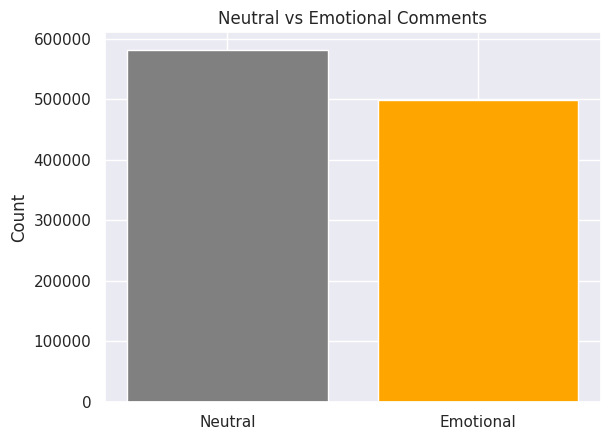

In [ ]:
plt.bar(['Neutral', 'Emotional'], [neutral_count, emotional_count], color=['gray', 'orange'])
plt.title('Neutral vs Emotional Comments')
plt.ylabel('Count')
plt.show()

- **Neutral:** 581,619 comments (53.86%)
- **Emotional:** 498,227 comments (46.14%)

This split shows that just under half of all comments express a clear emotion, with the remainder classified as neutral. Segmenting emotions in this way enables more targeted analysis—whether you want to understand sources of positivity, negativity, or overall engagement in the comment sections.

## Generating Emotion-Specific Word Clouds

In this section, we aimed to visually explore the most common words associated with different emotions in our YouTube comment dataset. To achieve this, we generated a **word cloud** for each detected emotion.

### What Are We Doing?

- **Grouping by Emotion:**  
  For each unique emotion label (e.g., "joy", "anger", "gratitude"), we collected all comments that were classified with that top emotion.

- **Aggregating Text:**  
  We concatenated all the comments sharing the same emotion into a single large string of text.

- **Generating Word Clouds:**  
  Using the WordCloud library, we created a visual representation for each emotion. In a word cloud, the size of each word reflects its frequency in the text. This helps reveal the most common words and themes people use when expressing a particular emotion.

- **Visualization:**  
  We displayed each word cloud with a title indicating the emotion it represents. This allowed us to quickly and intuitively compare the language patterns associated with different emotions in the dataset.

### Why Is This Useful?

Word clouds provide a fast, visual way to:
- Spot the most frequent words people use when expressing specific emotions,
- Identify recurring topics, memes, or phrases linked to certain sentiments,
- Compare the vocabulary of positive and negative emotions,
- Generate hypotheses for deeper textual or sentiment analysis.

This step bridges our quantitative emotion analysis with qualitative, interpretable insights about how people communicate their feelings in comments.

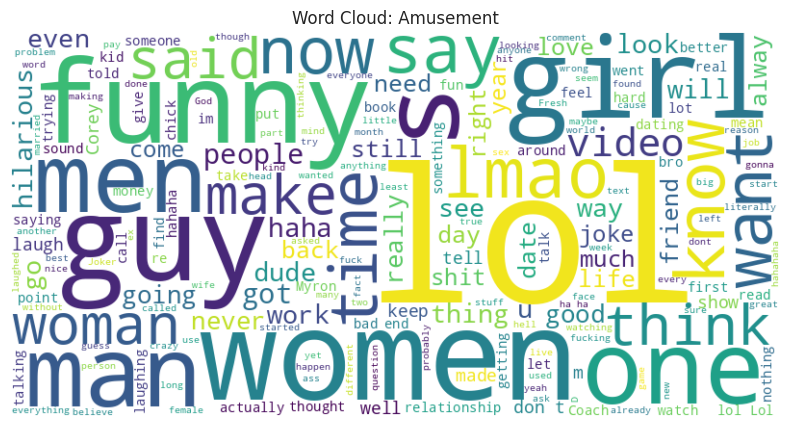

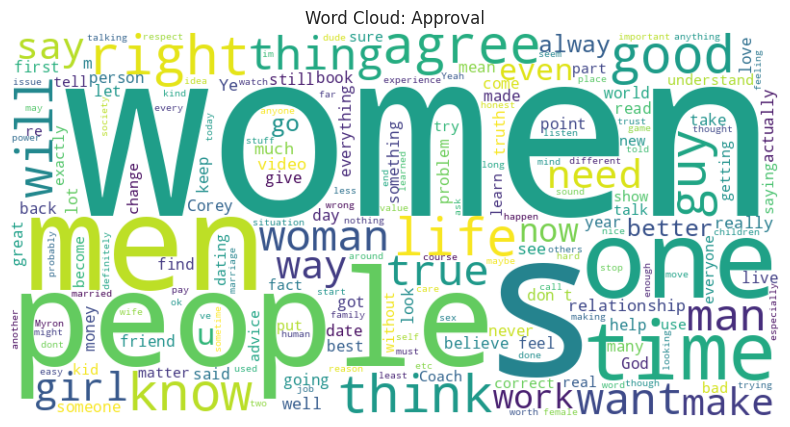

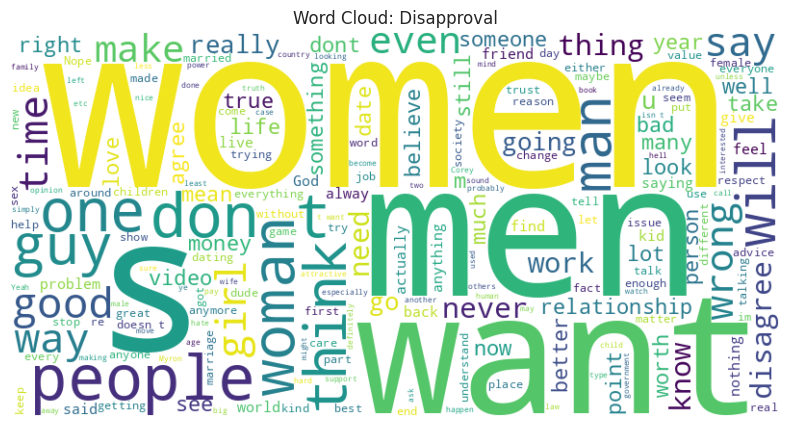

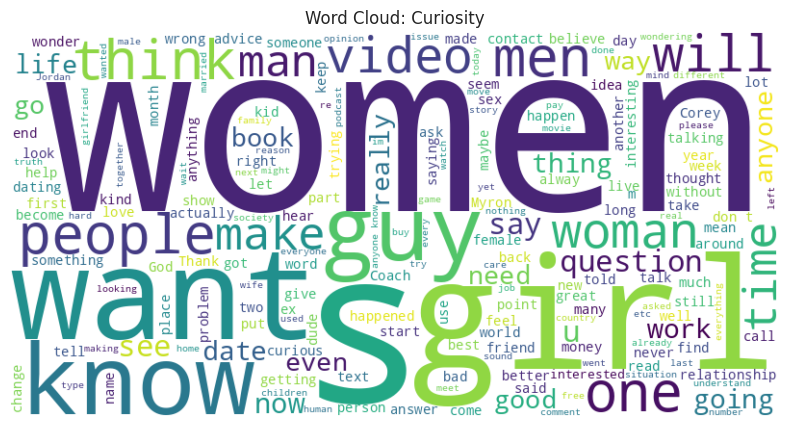

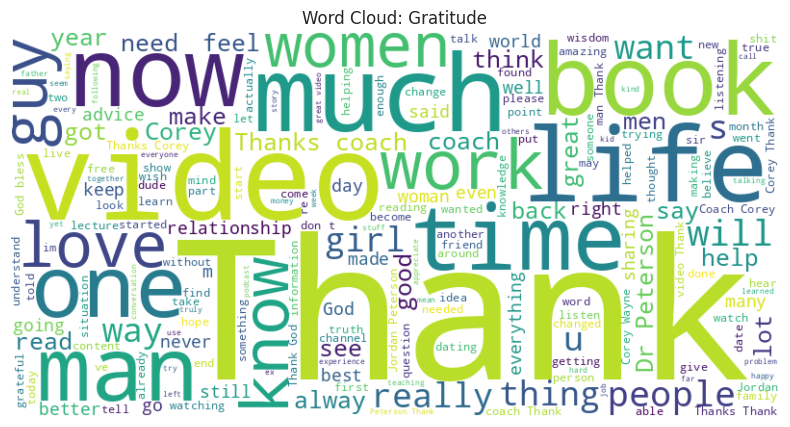

...

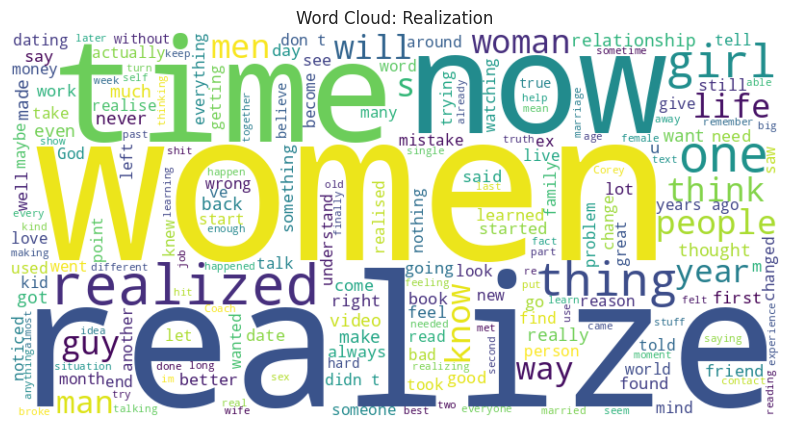

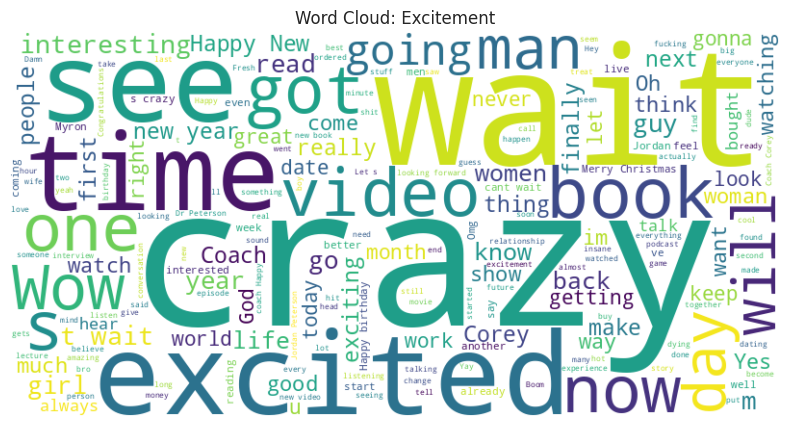

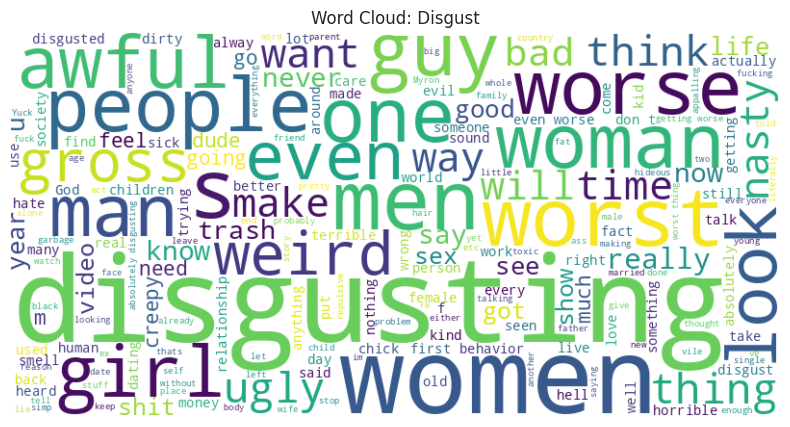

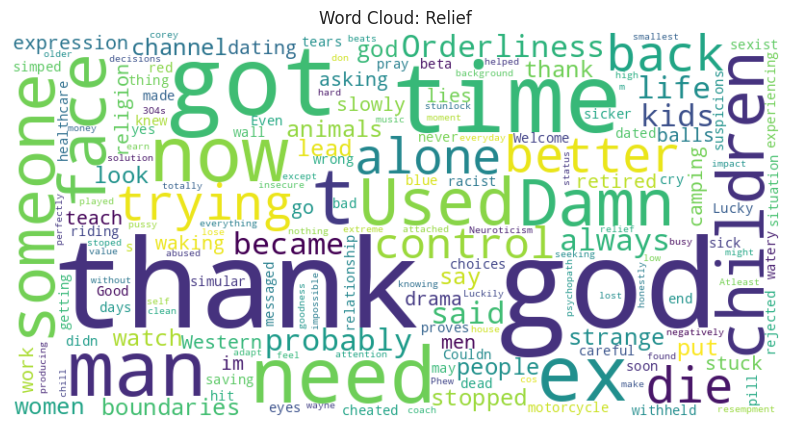

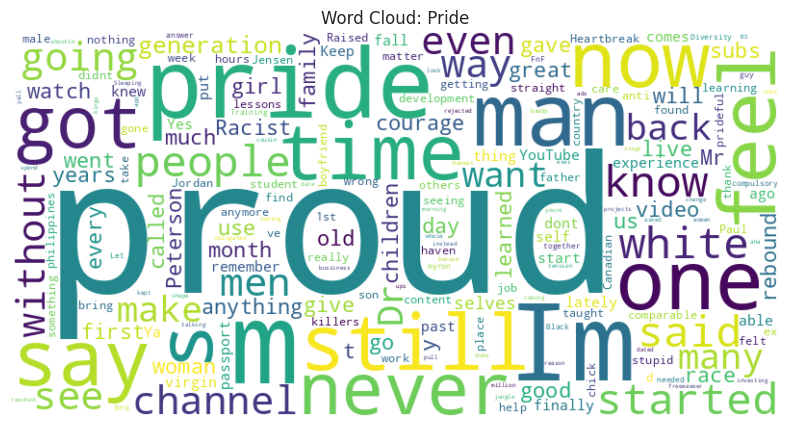

In [ ]:
emotions = emotional_df['top_emotion'].unique()

for emotion in emotions:
    text = ' '.join(emotional_df[emotional_df['top_emotion'] == emotion]['comment'].astype(str))
    if not text.strip():
        continue
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud: {emotion.capitalize()}')
    plt.show()

## Interpreting Emotion-Specific Word Clouds

By generating word clouds for each top emotion, we can qualitatively assess the linguistic patterns and thematic content associated with distinct emotional reactions across the YouTube comment dataset. Below, we discuss the most salient features observed in several key emotion categories.

### Amusement & Joy

The language in comments classified as "amusement" or "joy" is dominated by expressions associated with humor, surprise, and lightheartedness. Words such as "lol", "lmao", and "funny" appear prominently, suggesting a strong culture of internet colloquialism and shared jokes. The presence of "women", "guy", and "girl" indicates that much of the amusement is tied to gendered social dynamics—a common theme in online discourse.

### Approval & Admiration

For "approval" and "admiration", word clouds reveal an emphasis on agreement and praise. Words like "right", "agree", "good", and "great" are highly visible, reflecting positive acknowledgment. Notably, "never", "particular topic", and "deepened Wonderful" stand out in "admiration", hinting at users referencing specific insights or moments in videos that resonated deeply with them.

### Disapproval, Disappointment, & Annoyance

Negative emotional categories such as "disapproval", "disappointment", and "annoyance" share prominent terms like "women", "men", "people", and "want". These words often appear in critical or judgmental contexts, and their high frequency suggests that much of the negative sentiment is directed at broader social or cultural topics rather than individuals. The recurrence of negations and expressions of frustration is evident in these word clouds.

### Gratitude & Love

The "gratitude" and "love" word clouds are characterized by warmth, appreciation, and personal connection. Words such as "thank", "life", "book", and "video" feature heavily in "gratitude", while "love", "man", "video", and "want" are prominent in "love". These patterns indicate that viewers are expressing thanks for guidance, inspiration, or meaningful content, often relating it back to personal experiences.

### Anger & Disgust

The vocabulary in "anger" and "disgust" is more intense and emotionally charged, with strong language and expletives standing out. The frequent appearance of "hate", "fuck", and "fucking" in "anger", and terms like "disgusting", "worst", and "worse" in "disgust", point to the high emotional arousal and sometimes confrontational tone in these comments.

### Curiosity & Confusion

Comments labeled as "curiosity" and "confusion" often include question words and expressions of uncertainty, such as "know", "want", and "think". This suggests active engagement, with users seeking clarification or deeper understanding of topics discussed in the videos.

### Other Emotions

- **Sadness**: Words like "sad", "life", and "now" are prevalent, reflecting a focus on personal or collective misfortune.
- **Fear**: Words such as "fear", "scared", and "afraid" are central, indicating explicit expressions of anxiety.
- **Optimism**: The presence of phrases like "hope Jordan" and "Jordan B Peterson" suggests optimism tied to specific personalities or ideas.
- **Embarrassment, Remorse, Relief, Pride**: These categories are more niche, but still reveal distinctive vocabularies, such as "embarrassing", "sorry", "thank god", and "proud".

### Synthesis

Across all emotions, recurring references to "women", "men", "guy", and "girl" indicate that gendered topics are a major axis of discussion and emotional expression in the dataset. The prominence and size of words related to humor, gratitude, and social relationships reflect the multifaceted ways viewers engage with content—ranging from supportive and inspired to critical and confrontational.

Rather than isolated keywords, these word clouds capture the collective language and thematic focus of each emotional category, providing a richer context for interpreting the sentiment and discourse patterns within this large-scale social media corpus.


## Grouping Comments by Sentiment: Positive vs. Negative Word Clouds

To further simplify and interpret the emotional landscape of the comments, we grouped individual emotions into two broad sentiment categories: **positive** and **negative**. This approach enabled us to visualize, side by side, the dominant language used in uplifting versus critical or distressed comments.

### How We Did It

1. **Defining Emotion Groups:**  
   We manually defined lists of emotions to represent positive and negative sentiments. For example:
   - **Positive emotions:** joy, amusement, love, gratitude, excitement, optimism, approval, admiration, relief, pride, caring.
   - **Negative emotions:** anger, annoyance, disapproval, disappointment, sadness, fear, disgust, remorse, nervousness, embarrassment.

2. **Aggregating Comments:**  
   We filtered all comments labeled with a positive emotion into one group and all comments labeled with a negative emotion into another. Each group’s comments were then combined into a single large block of text.

3. **Word Cloud Generation:**  
   For each sentiment group, we generated a word cloud—a visual representation where the size of a word reflects its frequency in the text. This step was implemented using the `WordCloud` library in Python.  
   The code for this process is as follows:

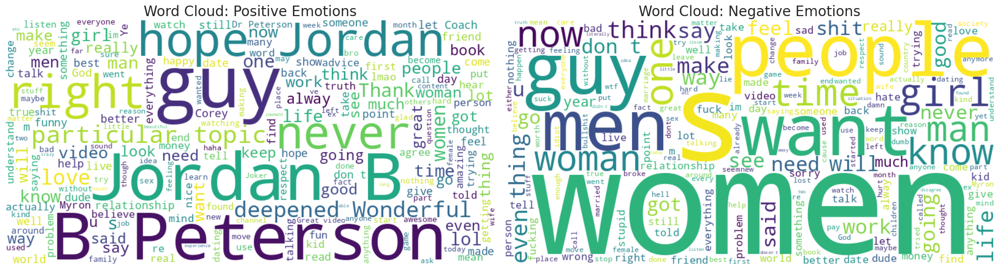

In [ ]:
positive_emotions = [
    'joy', 'amusement', 'love', 'gratitude', 'excitement', 'optimism',
    'approval', 'admiration', 'relief', 'pride', 'caring'
]
negative_emotions = [
    'anger', 'annoyance', 'disapproval', 'disappointment', 'sadness', 'fear',
    'disgust', 'remorse', 'nervousness', 'embarrassment'
]

positive_text = ' '.join(emotional_df[emotional_df['top_emotion'].isin(positive_emotions)]['comment'].astype(str))
negative_text = ' '.join(emotional_df[emotional_df['top_emotion'].isin(negative_emotions)]['comment'].astype(str))

positive_wc = WordCloud(width=800, height=400, background_color='white').generate(positive_text)
negative_wc = WordCloud(width=800, height=400, background_color='white').generate(negative_text)

fig, axs = plt.subplots(1, 2, figsize=(20, 8))

axs[0].imshow(positive_wc, interpolation='bilinear')
axs[0].axis('off')
axs[0].set_title('Word Cloud: Positive Emotions', fontsize=20)

axs[1].imshow(negative_wc, interpolation='bilinear')
axs[1].axis('off')
axs[1].set_title('Word Cloud: Negative Emotions', fontsize=20)

plt.tight_layout()
plt.show()

4. **Extracting and Comparing Word Frequencies:**  
   We also extracted the top words and their frequencies—both normalized and raw counts—for each sentiment group. This allowed for a quantitative comparison of the most characteristic terms used in positive and negative comments.

   **Top words for Positive Emotions (normalized):**
   - guy, Jordan B, B Peterson, hope Jordan, right, never, particular topic, deepened Wonderful, love, women, Thank, one, lol, s, man, time, know, life, girl, video

   **Top words for Negative Emotions (normalized):**
   - women, s, people, want, guy, men, girl, one, time, now, know, woman, man, think, even, make, life, thing, say, way

   **Top words for Positive Emotions (raw count):**
   - guy (35,536), Jordan B (29,177), B Peterson (29,174), hope Jordan (28,972), right (28,430), never (28,015), particular topic (22,951), deepened Wonderful (22,946), love (20,499), women (16,382), Thank (16,283), one (13,891), lol (13,767), s (13,407), man (12,661), time (12,435), know (12,363), life (12,032), girl (11,624), video (11,178)

   **Top words for Negative Emotions (raw count):**
   - women (13,622), s (9,230), people (8,885), want (8,470), guy (8,212), men (8,165), girl (7,999), one (7,955), time (7,547), now (7,194), know (6,980), woman (6,860), man (6,770), think (6,377), even (6,134), make (5,909), life (5,786), thing (5,762), say (5,571), way (5,506)

5. **Interpretation:**  
   Viewing these two word clouds side by side provides an immediate sense of the language and topics associated with positive versus negative sentiment in the dataset. The quantitative lists above confirm the visual impression:  
   - **Positive comments** are characterized by personal references ("guy", "Jordan B", "love", "Thank"), optimism, and direct engagement with content creators.  
   - **Negative comments** are more likely to reference groups ("women", "people", "men"), raise issues or express wants, and use critical or skeptical language.

### Why This Matters

By categorizing and visualizing comments as broadly positive or negative, we can:
- Quickly gauge the overall emotional tone of the discussion.
- Identify recurring themes or words that drive each type of sentiment.
- Compare the frequency and nature of positive versus negative engagement in the comment sections.

This high-level grouping is a practical step for summarizing complex emotional data, making patterns more accessible to both qualitative and quantitative analysis.

## Interpretation of the Heatmap: Happy/Angry Emotions by Top 20 Videos

When examining the heatmap of happy and angry emotion counts across the top 20 videos, a few key insights and patterns stand out:

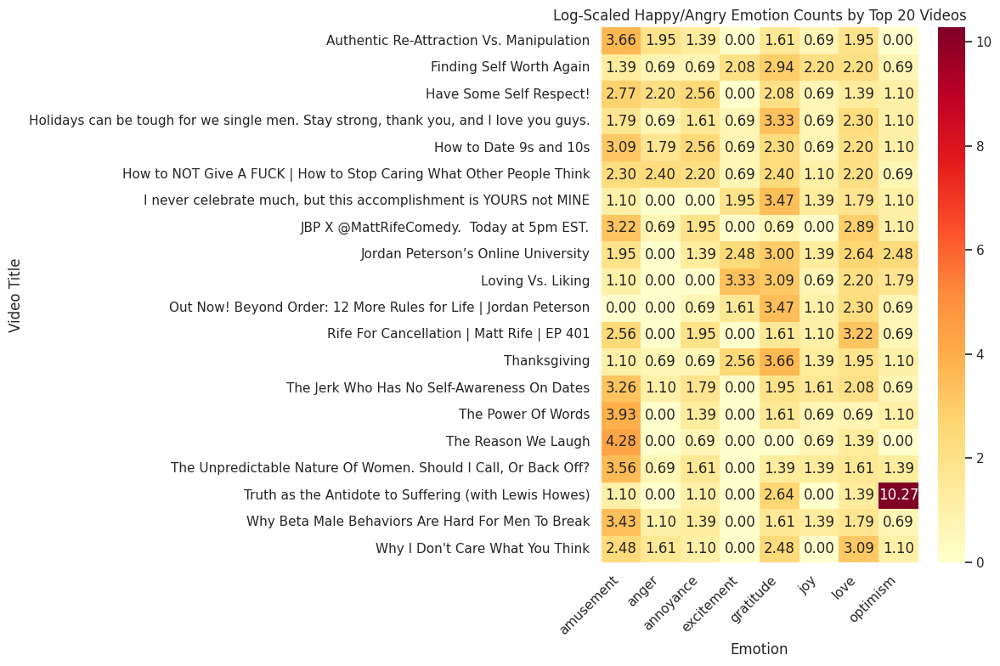

In [ ]:
happy_emotions = ['joy', 'amusement', 'love', 'gratitude', 'excitement', 'optimism']
angry_emotions = ['anger', 'annoyance']
target_emotions = happy_emotions + angry_emotions

filtered = emotional_df[emotional_df['top_emotion'].isin(target_emotions)]

top_videos = (
    filtered['title']
    .value_counts()
    .head(20)
    .index
)
filtered = filtered[filtered['title'].isin(top_videos)]

filtered_pivot = (
    filtered
    .pivot_table(index='title', columns='top_emotion', values='comment', aggfunc='count', fill_value=0)
)

log_pivot = np.log1p(filtered_pivot)

plt.figure(figsize=(12, 8))
sns.heatmap(log_pivot, cmap='YlOrRd', annot=True, fmt=".2f")
plt.title('Log-Scaled Happy/Angry Emotion Counts by Top 20 Videos')
plt.xlabel('Emotion')
plt.ylabel('Video Title')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### General Trends

- **Most videos** show a mix of happy emotions (like amusement, gratitude, love, and joy) and, to a lesser extent, angry emotions (anger and annoyance).
- For the majority of videos, the counts for each emotion are relatively modest, and the color scale reveals a balanced distribution of reactions across the emotional spectrum.
- Some videos stand out for elevated counts in certain happy emotions, particularly amusement, gratitude, or love, suggesting strong positive audience engagement.

### Notable Observations

- **Positive Engagement:**  
  Videos such as "The Reason We Laugh" and "The Power Of Words" display intense coloration in the amusement column, indicating these videos elicited a high number of amusement-tagged comments from viewers.
- **Mixed Reactions:**  
  Videos like "Have Some Self Respect!" and "How to NOT Give A FUCK | How to Stop Caring..." exhibit a blend of higher anger and annoyance, but also significant positive emotions, reflecting potentially polarizing or provocative content that spurred both positive and negative engagement.

### Anomaly in 'Optimism'

- **Extreme Outlier:**  
  One video, "Truth as the Antidote to Suffering (with Lewis ...)", is immediately striking on the heatmap for its **exceptionally intense coloration in the 'optimism' column**. This cell is orders of magnitude brighter or darker than any other, clearly marking it as an outlier.
- **Impact on Visualization:**  
  The scale of this single cell is so large that it can dominate the heatmap's color gradient, making subtler variations in other videos and emotions harder to discern.
- **Interpretation:**  
  This suggests that either:
  - The video truly generated an extraordinary number of optimism-tagged comments, or
  - There may be a data labeling or processing anomaly that resulted in an inflated count for this emotion in this specific video.

### Next Steps

Given the dramatic anomaly in the optimism count for "Truth as the Antidote to Suffering (with Lewis ...)", this warrants a closer look. Further investigation should focus on:
- Reviewing how emotion labels were assigned to comments for this video,
- Checking for duplicate or erroneous data entries,
- Comparing the content or audience engagement for this video against others in the set.

---

**Summary:**  
The heatmap effectively highlights both general emotional engagement trends across top videos and draws immediate attention to the optimism anomaly, guiding further analysis and quality checks in the dataset.

## Investigation of Heatmap Anomaly: "Optimism" Comments

After identifying an extreme anomaly in the heatmap—where the video **"Truth as the Antidote to Suffering (with Lewis Howes)"** had an extraordinarily high count of "optimism" comments (28,955)—we looked into the underlying data to understand the cause.

### Steps Taken

1. **Identified the Top Video**
   - Using the pivot table, we found that this video had the highest total number of happy/angry emotion comments, almost all from "optimism".
   - The breakdown for this video:

In [ ]:
filtered_pivot['total'] = filtered_pivot.sum(axis=1)
top_video_idx = filtered_pivot['total'].idxmax()
top_video_row = filtered_pivot.loc[top_video_idx]
print(f"Video with the most happy/angry comments:\nIndex: {top_video_idx}\nCounts:\n{top_video_row}")

if isinstance(top_video_idx, tuple):
    video_title, channel_title = top_video_idx
    print(f"\nTitle: {video_title}\nChannel: {channel_title}")
else:
    print(f"\nVideo identifier: {top_video_idx}")

Video with the most happy/angry comments:
Index: Truth as the Antidote to Suffering (with Lewis Howes)
Counts:
top_emotion
amusement         2
anger             0
annoyance         2
excitement        0
gratitude        13
joy               0
love              3
optimism      28955
total         28975
Name: Truth as the Antidote to Suffering (with Lewis Howes), dtype: int64

Video identifier: Truth as the Antidote to Suffering (with Lewis Howes)


In [ ]:
optimism_comments = emotional_df[
    (emotional_df['title'] == "Truth as the Antidote to Suffering (with Lewis Howes)") &
    (emotional_df['top_emotion'] == "optimism")
]['comment']

print("Sample optimism comments:\n", optimism_comments.sample(20, random_state=42).to_list())

Sample optimism comments:
 ['I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson', 'I hope Jordan B. Peterson']


2. **Examined Sample Comments**
   - We extracted 20 random comments labeled as "optimism" for this video.
   - All sampled comments were identical:  
     `"I hope Jordan B. Peterson"`

### Interpretation

- **Data Error:**  
  The fact that all "optimism" comments for this video are exactly the same strongly suggests a data processing or labeling error—possibly a repeated entry or a glitch during comment extraction or labeling.
- **Effect on Visualization:**  
  This error caused the optimism cell for this video to dominate the heatmap, overshadowing real variation and distorting the visualization.
- **Action:**  
  This highlights the importance of validating data before interpretation: anomalies in visualizations should always be investigated, as they may be due to processing mistakes rather than true outliers.

**Summary:**  
Upon review, the optimism anomaly in the heatmap for "Truth as the Antidote to Suffering (with Lewis Howes)" is due to a data error resulting in the same comment being repeated nearly 29,000 times. This row should be corrected or removed for accurate emotional analysis and visualization.

## Interpretation of the Heatmap After Outlier Removal

Looking at the heatmap of happy and angry emotions across the top videos (with the outlier removed), several patterns and insights become clear:

In [ ]:
filtered_emotional_df = emotional_df[emotional_df['title'] != "Truth as the Antidote to Suffering (with Lewis Howes)"]

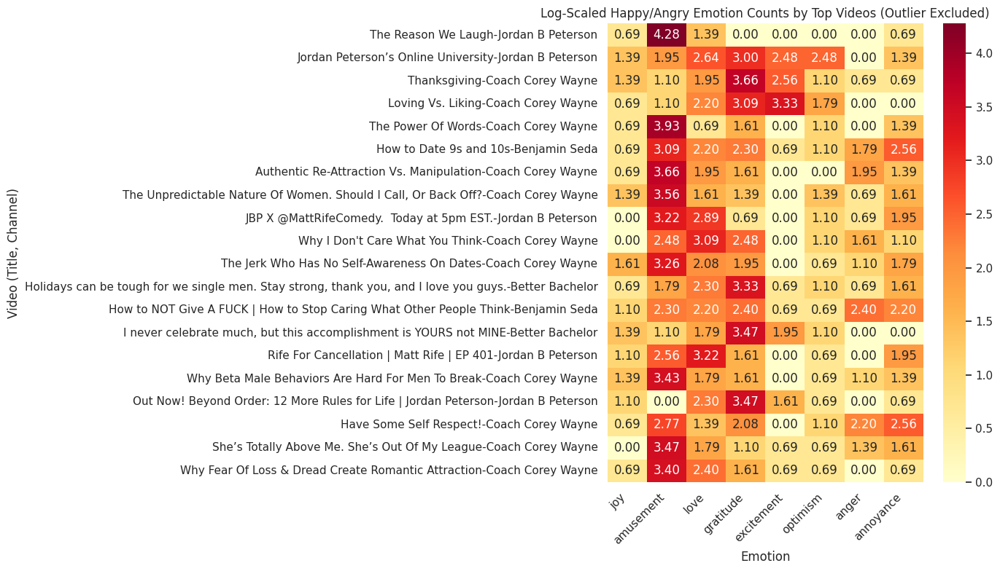

In [ ]:
happy_emotions = ['joy', 'amusement', 'love', 'gratitude', 'excitement', 'optimism']
angry_emotions = ['anger', 'annoyance']

dummies = pd.get_dummies(filtered_emotional_df['top_emotion'])
df_with_dummies = pd.concat([filtered_emotional_df, dummies], axis=1)

filtered_pivot = (
    df_with_dummies
    .groupby(['title', 'channelTitle'])[happy_emotions + angry_emotions]
    .sum()
    .fillna(0)
)

filtered_pivot['total'] = filtered_pivot.sum(axis=1)
filtered_pivot = filtered_pivot.sort_values('total', ascending=False).head(20)
filtered_pivot = filtered_pivot.drop(columns='total')

log_pivot = np.log1p(filtered_pivot)

plt.figure(figsize=(14,8))
sns.heatmap(log_pivot, cmap='YlOrRd', annot=True, fmt=".2f")
plt.title('Log-Scaled Happy/Angry Emotion Counts by Top Videos (Outlier Excluded)')
plt.xlabel('Emotion')
plt.ylabel('Video (Title, Channel)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### General Trends

- **Positive Emotions Dominate:**  
  Most videos are characterized by warmer, more intense colors in the columns representing happy emotions like amusement, gratitude, and love. This suggests that the majority of top videos are eliciting positive engagement from viewers.

- **Standout Emotions Per Video:**  
  Some videos clearly stand out for particular emotions. For example:
  - "The Reason We Laugh" is especially vivid in the amusement column, indicating a very high number of amused responses compared to other emotions for that video.
  - "Thanksgiving" shows a strong color in the gratitude column, reflecting a significant number of grateful comments.
  - "Loving Vs. Liking" features a pronounced excitement response, as seen by the heatmap's intensity in that column.

- **Distribution of Angry Emotions:**  
  Columns for anger and annoyance are generally lighter, showing that these emotions occur less frequently overall. However, a few videos show slightly stronger coloration in these columns, such as "How to NOT Give A FUCK | How to Stop Caring..." and "Have Some Self Respect!", suggesting that these videos may have sparked more controversy or critical responses.

### Patterns Across Channels

- **Consistent Positive Engagement:**  
  Videos from channels like "Jordan B Peterson" and "Coach Corey Wayne" often display strong positive emotion signals. For example, multiple videos from these channels show elevated counts in amusement and gratitude, as visible in the heatmap's color gradients.

- **Variety in Emotional Response:**  
  While positive emotions tend to dominate, the heatmap also reveals that most videos elicit a spectrum of reactions, with at least some presence of both happy and angry emotions.

### Benefits of Removing the Outlier

- **Enhanced Visibility:**  
  The removal of the anomalous video means no single cell distorts the color scale. This allows us to easily compare emotional responses between all videos and across all emotions, making previously hidden patterns immediately apparent.

- **Balanced Interpretation:**  
  The heatmap now accurately reflects the true diversity of viewers’ emotional responses, making it a reliable basis for further analysis.

### What the Heatmap Tells Us

- **Which Videos Stand Out:**  
  Heatmap hotspots highlight videos that particularly resonated with audiences—either in a positive or negative way.
- **Overall Audience Mood:**  
  The prevalence of stronger colors in positive emotion columns suggests an overall trend of positive engagement in the top videos.

**Summary:**  
By examining the heatmap (with the data anomaly removed), we gain a clear, unbiased view of the emotional landscape across top-performing videos and channels. The visualization highlights both standout moments of positive audience reaction and the occasional spikes in negative sentiment, offering valuable guidance for understanding engagement trends.

## Interpretation of the "Emotions Over Time" Chart

Looking at the "Emotions Over Time" chart—now that we have the underlying figures—it’s clear how patterns in audience sentiment have shifted across the years, and which emotions have seen peaks or steady trends.

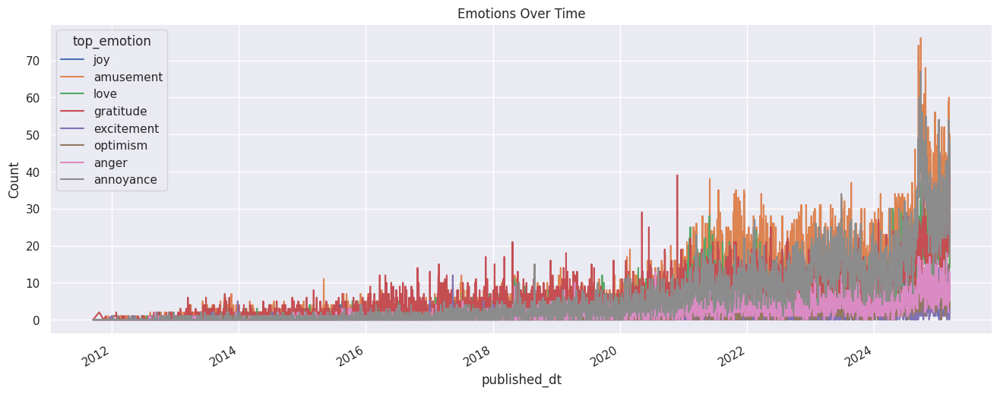

In [ ]:
filtered_emotional_df = filtered_emotional_df.copy()
filtered_emotional_df['published_dt'] = pd.to_datetime(filtered_emotional_df['published_at'])

timeline = (
    filtered_emotional_df
    .set_index('published_dt')
    .groupby([pd.Grouper(freq='D'), 'top_emotion'])
    .size()
    .unstack(fill_value=0)
)

timeline[happy_emotions + angry_emotions].plot(figsize=(16,6), title='Emotions Over Time')
plt.ylabel('Count')
plt.show()

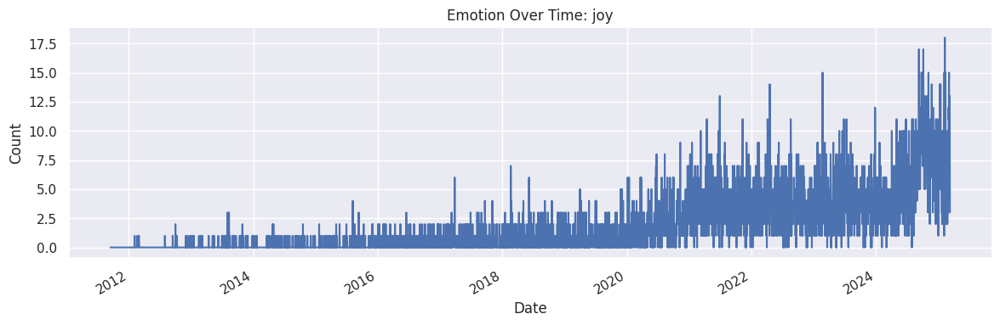

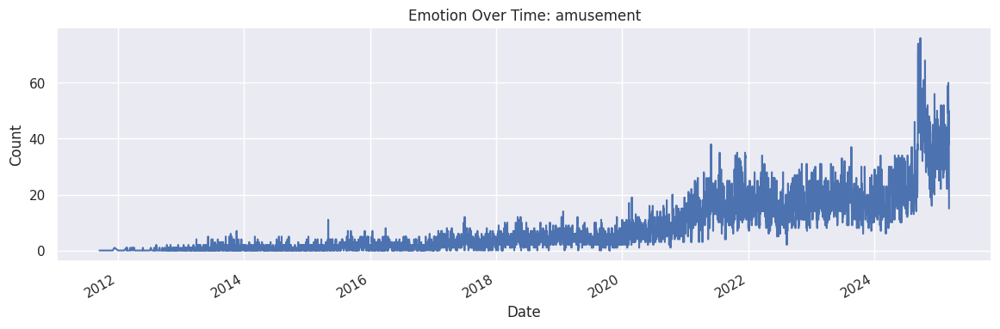

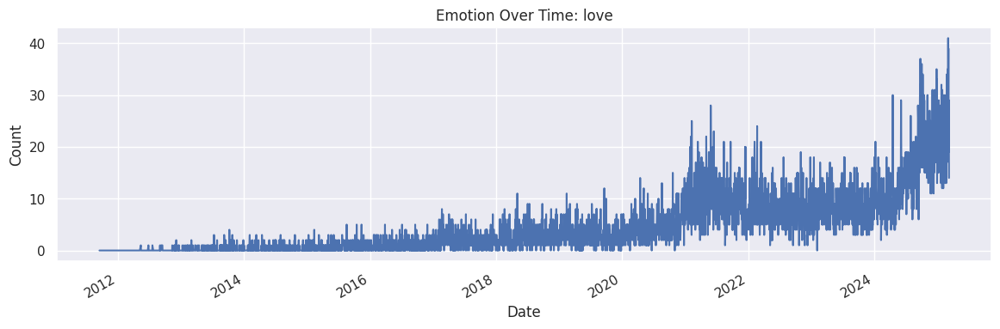

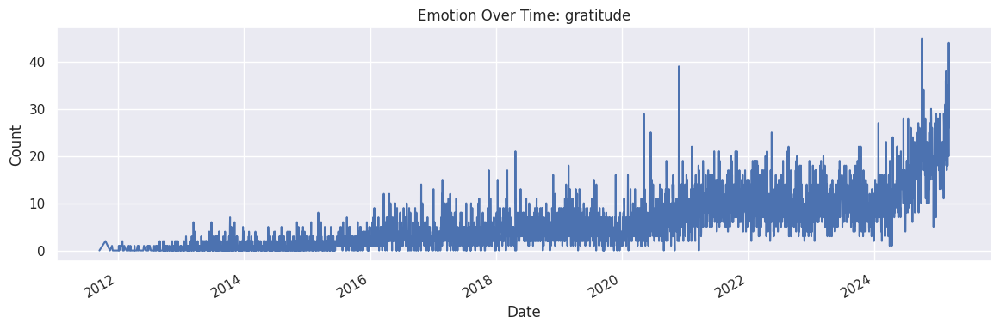

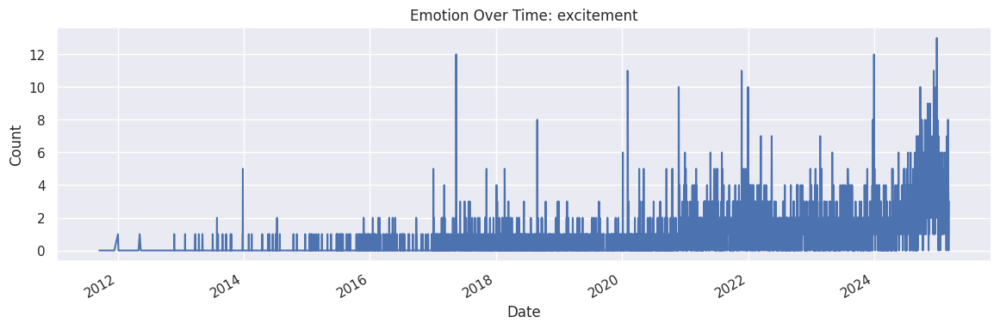

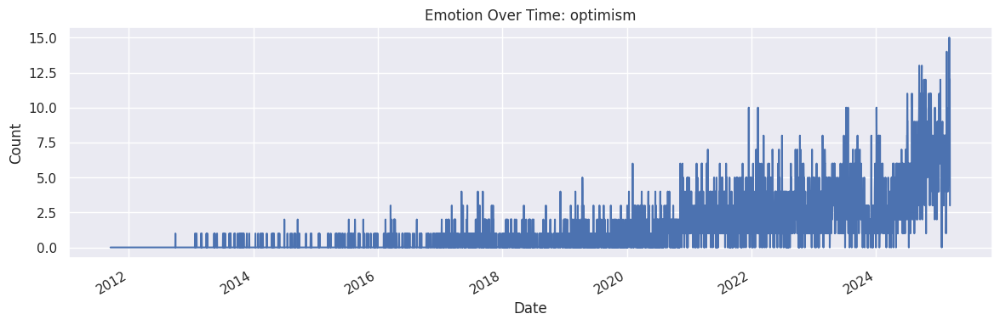

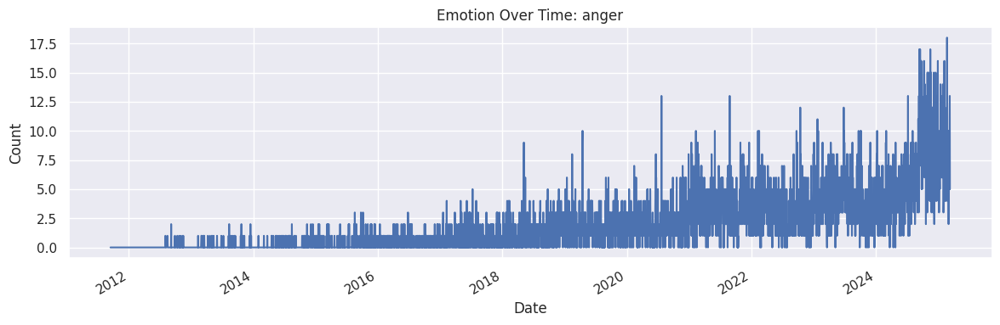

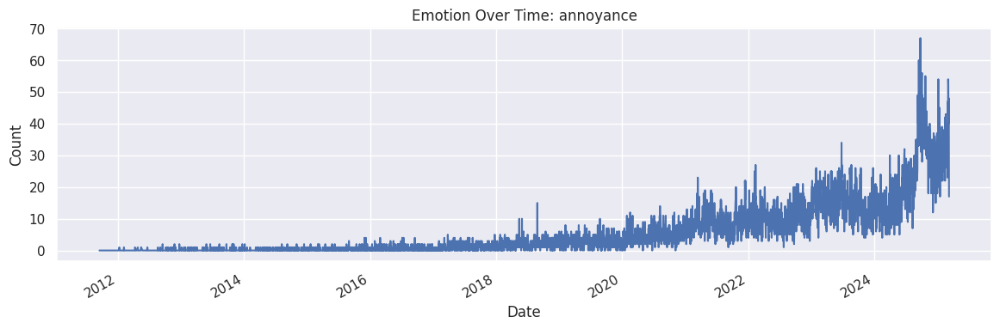

In [ ]:
for emotion in happy_emotions + angry_emotions:
    timeline[emotion].plot(figsize=(14, 4), title=f'Emotion Over Time: {emotion}')
    plt.ylabel('Count')
    plt.xlabel('Date')
    plt.show()

### Early Years (2011–2015)
- **Sparse Activity:**  
  In the earliest dates (2011–2015), most days show zeros across all emotions, with only the occasional blip—such as a gratitude comment on 2011-10-21 and 2011-11-28. This likely reflects a small volume of comments or less emotional engagement during this period.

### Gradual Growth and Fluctuations
- **Mid Years:**  
  As time progresses, the frequency and intensity of emotional comments gradually increase, with more consistent non-zero counts across emotions.
- **Emotion Mix:**  
  Most days, especially in later years, display a mix of happy and angry emotions, demonstrating that videos are generating a range of responses.

### Recent Years (2025 Data)
- **Significant Activity:**  
  By 2025, the chart shows strong, regular spikes across almost all emotions:
    - **Amusement and Gratitude:**  
      These emotions often have the highest daily counts, with values like 60 amusement and 35 gratitude (2025-03-06), and 49 amusement and 32 gratitude (2025-03-07). This suggests that recent videos are particularly effective at engaging audiences positively.
    - **Love and Joy:**  
      These emotions are also frequently present, though at slightly lower counts (e.g., 26 love and 6 joy on 2025-03-06), but still indicating a warm response.
    - **Excitement and Optimism:**  
      These emotions have moderate but consistent presence, with excitement occasionally peaking (e.g., 6 on 2025-03-06) and optimism showing up regularly.
    - **Angry Emotions:**  
      Anger and annoyance are also visible in the daily data. Notably, annoyance often has higher counts than anger (e.g., 52 annoyance vs 10 anger on 2025-03-06), suggesting that while some viewers are upset or irritated, outright anger is less common.

### Notable Daily Peaks
- **March 6–10, 2025:**  
  These days show a vivid cluster of high counts across nearly all emotions, indicating either a particularly impactful video release or a spike in engagement for existing content.
    - Example: On 2025-03-09, there are 50 amusement, 44 gratitude, 29 love, and 48 annoyance—showing that days with high positive emotions can also see high negative emotions.

### Overall Trends
- **Positive Emotions Lead:**  
  Across the timeline, positive emotions (amusement, gratitude, love, joy) consistently outnumber negative ones, reflecting an overall trend of positive engagement.
- **Emotional Diversity:**  
  The presence of both happy and angry emotions on busy days highlights that the audience is emotionally invested—both in support and in critique.

**Summary:**  
The timeline chart, informed by these figures, reveals a story of growing engagement. Early years were quiet, but recent periods show robust and diverse emotional responses, with positive emotions leading but negative emotions also present. This suggests both the content and the audience have evolved to be more emotionally expressive and engaged over time.

## Interpretation of the Positive vs. Negative Emotions Over Time Plot

Examining the plot of positive (green) and negative (red) emotions over time, several clear trends emerge from the data:

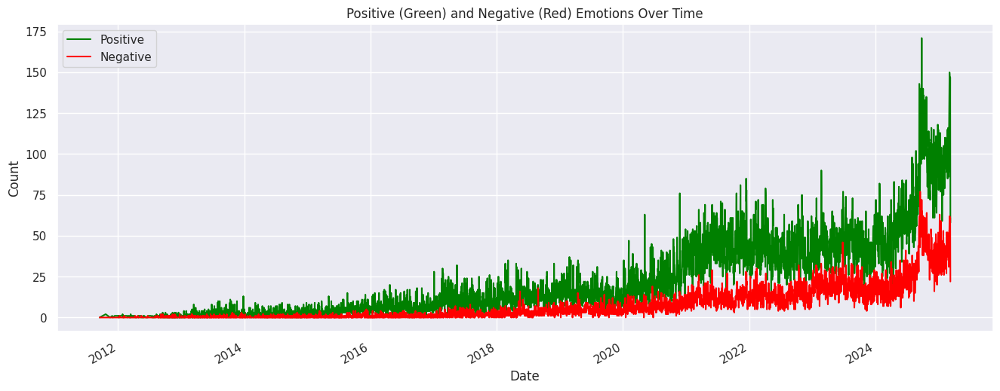

In [ ]:
timeline['positive'] = timeline[happy_emotions].sum(axis=1)
timeline['negative'] = timeline[angry_emotions].sum(axis=1)

ax = timeline['positive'].plot(figsize=(16,6), color='green', label='Positive')
timeline['negative'].plot(ax=ax, color='red', label='Negative')
plt.title('Positive and Negative Emotions Over Time')
plt.ylabel('Count')
plt.xlabel('Date')
plt.legend()
plt.show()

### Early Years (2011–2015)
- **Low Activity:**  
  The earliest time points (2011–2015) show almost no engagement, with both positive and negative emotion lines flat at zero or near-zero. Occasional small spikes (like a positive value of 2 on 2011-10-21 and 1 on 2011-11-28) indicate isolated bursts of positive sentiment, but negative emotions are essentially absent.

### Growth in Engagement
- **Gradual Uptick:**  
  As we move through the timeline, both positive and negative emotions begin to appear more frequently, reflecting a growing and more emotionally expressive audience.

### Recent Years (2025)
- **Significant Increase in Emotional Responses:**  
  In early March 2025, both positive and negative emotion counts surge dramatically:
    - **Positive Emotions Dominate:**  
      Recent days display very high positive counts, such as 148 on 2025-03-06 and 147 on 2025-03-09. The positive line is consistently above the negative, indicating that the majority of comments are supportive, appreciative, or joyful.
    - **Negative Emotions Present but Lower:**  
      Negative emotions also rise, with counts like 62 on 2025-03-06 and 61 on 2025-03-09. While these are substantial, they remain consistently below the positive emotion counts, showing that while there is dissent, criticism, or annoyance, it is not the dominant mood.

### Key Takeaways from the Plot
- **Positive/Negative Ratio:**  
  The gap between the green (positive) and red (negative) lines is a strong signal that, even at peak activity, positive engagement outpaces negative sentiment.
- **Spikes Represent Key Events:**  
  The synchronized spikes in both lines around specific dates likely correspond to major video releases, trending topics, or highly engaging discussions that elicit strong reactions from both supporters and critics.
- **Emotional Engagement is Growing:**  
  The overall upward movement in both lines in recent years suggests that the channel(s) or topics are attracting a more emotionally invested audience than in the past.
  
**Summary:**  
The positive vs. negative emotions plot shows that while negative emotions are present and sometimes spike, positive responses are both more frequent and more intense, especially in recent periods of high engagement. This indicates a generally supportive and appreciative audience, with occasional controversy or debate adding to the emotional landscape.

## Top Channels with Emotional Comments

This section identifies and visualizes the channels that receive the highest number of emotionally charged comments. The data is based on the frequency of emotional comments (across all detected emotions) for each channel.

Top channels with emotional comments:
 channelTitle
Coach Corey Wayne    161776
Jordan B Peterson    123020
Better Bachelor       90294
FreshandFit           87379
Benjamin Seda         35758
Name: count, dtype: int64


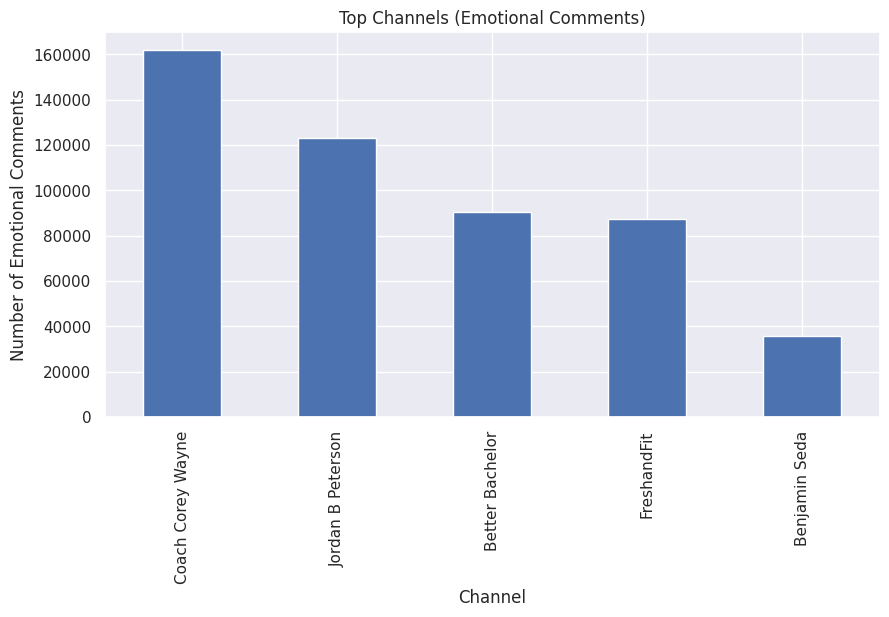

In [ ]:
if 'channelTitle' in emotional_df.columns:
    top_channels = emotional_df['channelTitle'].value_counts().head(10)
    print("Top channels with emotional comments:\n", top_channels)
    top_channels.plot.bar(title='Top Channels (Emotional Comments)', figsize=(10,5))
    plt.ylabel('Number of Emotional Comments')
    plt.xlabel('Channel')
    plt.show()

### Key Findings

- **Dominance of a Few Channels:**  
  The chart and data show that a small number of channels account for the majority of emotional comments. For example, "Coach Corey Wayne" leads by a significant margin with 161,776 emotional comments, followed by "Jordan B Peterson" with 123,020.

- **Clear Leaders:**  
  These two top channels have a notably higher engagement than the rest, with "Better Bachelor" (90,294), "FreshandFit" (87,379), and "Benjamin Seda" (35,758) rounding out the top five. The drop-off after the top two is substantial.

- **Engagement and Community:**  
  The high numbers suggest that these channels have particularly active or passionate communities, likely driven by the topics they discuss and the personalities involved. This may reflect both the size of their audience and the emotional resonance of their content.

### What the Bar Chart Shows

- The bar chart visually reinforces the numerical findings, making it easy to compare channels at a glance.  
- "Coach Corey Wayne" and "Jordan B Peterson" stand out with the tallest bars, while the other channels, though still significant, show much lower values.

### Interpretation

- **Content Impact:**  
  The channels with the most emotional comments are likely producing content that strongly resonates with viewers—whether by sparking inspiration, debate, agreement, or even controversy.
- **Potential for Deeper Analysis:**  
  These results open up opportunities for deeper dives: for example, segmenting emotions by channel or analyzing what topics or videos drive spikes in emotional engagement.

**Summary:**  
The analysis highlights a concentration of emotional engagement in a handful of channels, with "Coach Corey Wayne" and "Jordan B Peterson" leading by a wide margin. This insight can help guide further investigation into what makes these channels so emotionally resonant for their audiences.

## Videos with the Most Diverse Emotional Responses

### Diversity in Audience Emotions

The analysis identifies the top 10 videos (by title and channel) that have elicited the **most diverse range of emotions** from viewers. This is measured by the number of unique emotional categories ("top_emotion") detected among comments for each video.


In [ ]:
diversity = emotional_df.groupby(['title', 'channelTitle'])['top_emotion'].nunique()
most_diverse = diversity.sort_values(ascending=False).head(10)
print("Videos with the most diverse emotions (Title, Channel):\n", most_diverse)

most_diverse_video = most_diverse.index[0]
video_title, channel_title = most_diverse_video

video_emotions = emotional_df[
    (emotional_df['title'] == video_title) &
    (emotional_df['channelTitle'] == channel_title)
]['top_emotion'].value_counts()

print(f"\nTop emotions for video '{video_title}' by channel '{channel_title}':\n", video_emotions)

Videos with the most diverse emotions (Title, Channel):
 title                                                                                  channelTitle     
Reality has set in and women are in a LOT of trouble in the future.                    Better Bachelor      24
Molded by society. He ended 4 college girls, was teased and hated by them in college.  Better Bachelor      23
Dating A Prostitute                                                                    Coach Corey Wayne    23
Fitness, Motivation, Mentorship, and Life's Calling | @MorePlatesMoreDates | EP 421    Jordan B Peterson    23
2017/05/06: The Indiegogo campaign: last day                                           Jordan B Peterson    23
Buckle up gents, 2021 is just a s̶l̶i̶d̶e̶   race down to bottom.                      Better Bachelor      22
Free Speech and Cambridge | James Orr & Arif Ahmed | EP 218                            Jordan B Peterson    22
Johnny is being heard and believed as people hear the truth  

#### Key Observations

- **Most Diverse Video:**  
  The video titled _"Reality has set in and women are in a LOT of trouble in the future."_ by **Better Bachelor** stands out, with emotional comments spanning **24 unique emotion categories**. This is the highest diversity observed across all analyzed videos.
- **Other Highly Diverse Videos:**  
  Several videos from channels like Better Bachelor, Jordan B Peterson, and Coach Corey Wayne also show a broad emotional spectrum (22–23 unique emotions), suggesting these creators or topics provoke complex, nuanced audience reactions.

### Case Study: Most Diverse Video

#### Emotional Profile for  
**"Reality has set in and women are in a LOT of trouble in the future."**  
_Channel: Better Bachelor_

- **Top Emotions by Count:**  
  - **Annoyance (11)**: The most prominent emotion, indicating many viewers felt irritated or frustrated.
  - **Curiosity & Sadness (5 each)**: Reflects both intrigue and a sense of loss or disappointment.
  - **Approval, Amusement (4 each)**: A segment of the audience found content agreeable or entertaining.
  - **Gratitude, Caring, Realization, Love, Joy, Disapproval (3 each)**: A mix of positive, reflective, and critical responses.
  - **Fear, Admiration, Optimism, Excitement, Surprise, Desire (2 each)**: Indicate a smaller but varied set of emotional reactions.
  - **Remorse, Embarrassment, Disappointment, Confusion, Disgust, Nervousness, Anger (1 each)**: Even low-frequency emotions are present, highlighting the video's ability to touch on nearly the full spectrum of feelings.

#### Interpretation

- **Complex Audience Reaction:**  
  The wide spread of emotions—from annoyance and sadness to amusement, gratitude, love, and even remorse—shows this video sparked multidimensional discussions and feelings.  
- **Potential Factors:**  
  Such diversity could stem from controversial or thought-provoking subject matter, a polarizing presentation style, or content that resonates differently with varied audience segments.
- **Rich Ground for Further Analysis:**  
  Videos like this are ideal for deeper dives into comment sentiment, as they reflect not just strong feelings, but a wide variety of them. Understanding why certain topics or presentations elicit such diversity can offer valuable insights for creators and researchers.

**Summary:**  
The most diverse video, and others at the top of this list, show that some content doesn't just provoke strong emotions—it provokes many different ones at once. This diversity is a marker of high engagement and complex audience interaction, making these videos particularly significant for understanding community sentiment and dynamics.

## Analysis: Sentiment Labeling of Emotions in Comments

This section introduces a custom sentiment labeling approach, where each detected emotion is categorized as **positive**, **negative**, or **other**. The analysis then summarizes the overall and per-video sentiment landscape found in the comments.

### Method: Emotion to Sentiment Mapping

- **Positive Emotions:**  
  Includes emotions such as joy, amusement, love, gratitude, excitement, optimism, approval, admiration, relief, pride, and caring.

- **Negative Emotions:**  
  Includes anger, annoyance, disapproval, disappointment, sadness, fear, disgust, remorse, nervousness, and embarrassment.

- **Other:**  
  Any emotion outside the defined positive or negative lists is labeled as "other".

In [ ]:
positive_emotions = ['joy', 'amusement', 'love', 'gratitude', 'excitement', 'optimism', 'approval', 'admiration', 'relief', 'pride', 'caring']
negative_emotions = ['anger', 'annoyance', 'disapproval', 'disappointment', 'sadness', 'fear', 'disgust', 'remorse', 'nervousness', 'embarrassment']

def sentiment_label(emotion):
    if emotion in positive_emotions:
        return 'positive'
    elif emotion in negative_emotions:
        return 'negative'
    else:
        return 'other'

emotional_df['sentiment'] = emotional_df['top_emotion'].apply(sentiment_label)

sentiment_counts = emotional_df['sentiment'].value_counts()
print("Overall sentiment summary:\n", sentiment_counts)

sentiment_by_video = emotional_df.groupby('title')['sentiment'].value_counts().unstack(fill_value=0)
print("Sentiment breakdown by video:\n", sentiment_by_video.head())

Overall sentiment summary:
 sentiment
positive    254562
negative     91118
other        60437
Name: count, dtype: int64
Sentiment breakdown by video:
 sentiment                                           negative  other  positive
title                                                                        
"Bedroom Fun" Gatekeeper "MYTH" ( Article Analy...         6      6        23
"Big is beautiful" as society says, but why do ...        28      7        18
"Crystal" Girl Calls Podcast Boring & THIS HAPP...        25     11        27
"Dating Isn't Worth It"                                    4      3         8
"Dating girls takes too much time"                        23      7        19


### Overall Sentiment Summary

- **Positive:** 254,562  
- **Negative:** 91,118  
- **Other:** 60,437  

**Interpretation:**  
- The vast majority of emotional comments are **positive** (~62% of all labeled comments), indicating a generally supportive or appreciative audience.
- **Negative** comments account for about 22%, showing that while criticism or negative reactions are present, they are far less frequent than positive engagement.
- The **other** category (~15%) represents comments with emotions that don't clearly fit into a positive or negative sentiment, possibly reflecting more nuanced or ambiguous feelings.

### Sentiment Breakdown by Video

The per-video sentiment breakdown reveals the diversity of audience reactions to individual pieces of content. For example:

| Video Title                                  | Negative | Other | Positive |
|----------------------------------------------|----------|-------|----------|
| "Bedroom Fun" Gatekeeper "MYTH"              |    6     |   6   |    23    |
| "Big is beautiful" as society says...        |   28     |   7   |    18    |
| "Crystal" Girl Calls Podcast Boring...       |   25     |  11   |    27    |

**Interpretation:**
- Some videos receive more positive than negative comments (e.g., "Bedroom Fun" Gatekeeper "MYTH").
- Others, such as "Big is beautiful as society says...", receive more negative than positive comments, suggesting the topic is more controversial or elicits stronger critical reactions.
- The "other" sentiment column shows that every video has a share of comments that are not easily classified, highlighting the complexity of audience emotion.

### Key Takeaways

- **Community Mood:**  
  The overall sentiment is strongly positive, but individual videos can vary widely in their sentiment profiles.
- **Video-Specific Insights:**  
  Sentiment breakdowns by video can identify which topics or presentations are more polarizing, supportive, or emotionally complex.
- **Guidance for Creators:**  
  Understanding which videos attract more negative sentiment can help content creators address controversy, clarify messaging, or foster healthier discussions.

**Summary:**  
Labeling emotions by sentiment provides both a macro and micro view of audience engagement. While positivity dominates, the diversity in video-level breakdowns offers rich insight into how different themes resonate—or provoke—within the community.

## Analysis: Sentiment Breakdown by Video and Channel

This section presents a detailed look at how sentiment—categorized as positive, negative, or other—is distributed across specific videos and their respective channels.

### What the Table Shows

The table `sentiment_by_video_channel` presents, for each video and channel pair:
- The count of **negative**, **other**, and **positive** sentiment comments.

In [ ]:
sentiment_by_video_channel = emotional_df.groupby(['title', 'channelTitle'])['sentiment'].value_counts().unstack(fill_value=0)
print("Sentiment breakdown by video and channel:\n", sentiment_by_video_channel.head())

sentiment_by_video_channel_reset = sentiment_by_video_channel.reset_index()
print(sentiment_by_video_channel_reset.head())

Sentiment breakdown by video and channel:
 sentiment                                                           negative  \
title                                              channelTitle                
"Bedroom Fun" Gatekeeper "MYTH" ( Article Analy... FreshandFit             9   
"Big is beautiful" as society says, but why do ... Better Bachelor        35   
"Crystal" Girl Calls Podcast Boring & THIS HAPP... FreshandFit            33   
"Dating Isn't Worth It"                            Benjamin Seda           9   
"Dating girls takes too much time"                 Benjamin Seda          31   

sentiment                                                           other  \
title                                              channelTitle             
"Bedroom Fun" Gatekeeper "MYTH" ( Article Analy... FreshandFit          7   
"Big is beautiful" as society says, but why do ... Better Bachelor      9   
"Crystal" Girl Calls Podcast Boring & THIS HAPP... FreshandFit         15   
"Dating Isn

| Video Title                                    | Channel           | Negative | Other | Positive |
|------------------------------------------------|-------------------|----------|-------|----------|
| "Bedroom Fun" Gatekeeper "MYTH"                | FreshandFit       |    9     |   7   |    27    |
| "Big is beautiful" as society says...          | Better Bachelor   |   35     |   9   |    24    |
| "Crystal" Girl Calls Podcast Boring...         | FreshandFit       |   33     |  15   |    32    |
| "Dating Isn't Worth It"                        | Benjamin Seda     |    9     |   5   |    13    |
| "Dating girls takes too much time"             | Benjamin Seda     |   31     |  10   |    22    |

### Interpretation and Insights

- **Video-Specific Sentiment Profiles:**  
  Each video, even within the same channel, may evoke a unique balance of positive, negative, and other emotional responses. For example, "Bedroom Fun" Gatekeeper "MYTH" on FreshandFit has nearly three times as many positive comments as negative, while "Big is beautiful as society says..." on Better Bachelor has more negative than positive.

- **Channel Variation:**  
  Some channels, like Benjamin Seda, have videos with relatively balanced or negative-leaning sentiment distributions, while others, like FreshandFit, may have more positive engagement on certain videos.

- **Controversial or Polarizing Content:**  
  Videos with high negative and high positive counts (e.g., "Crystal" Girl Calls Podcast Boring... on FreshandFit) suggest content that is polarizing, generating both strong support and critique.

- **"Other" Sentiments:**  
  The "other" category is non-negligible for all videos, reflecting the presence of nuanced or ambiguous emotional responses.

### Why This Matters

- **Audience Engagement:**  
  This breakdown allows creators and analysts to pinpoint which topics and presentations foster the most positive, negative, or mixed reactions.
- **Content Strategy:**  
  Understanding sentiment by video and channel helps inform future content decisions—identifying what resonates positively, what may be controversial, and where discussions are most complex.
- **Community Health:**  
  Monitoring videos with high negative sentiment can guide moderation or engagement strategies to maintain a healthy community environment.

**Summary:**  
By examining sentiment breakdowns at the granularity of individual videos and channels, we gain actionable insights into how content is received. This enables a tailored approach to content creation, community management, and audience engagement.

## Full Sentiment Distribution (Including Neutral)

In this section, we expanded the sentiment analysis by explicitly including comments labeled as **neutral** alongside positive, negative, and other categories. The resulting sentiment counts and their visualization provide a comprehensive overview of the emotional landscape in the dataset.

Full sentiment breakdown (including neutral):
 sentiment
neutral     581619
positive    292161
negative    122383
other        83683
Name: count, dtype: int64


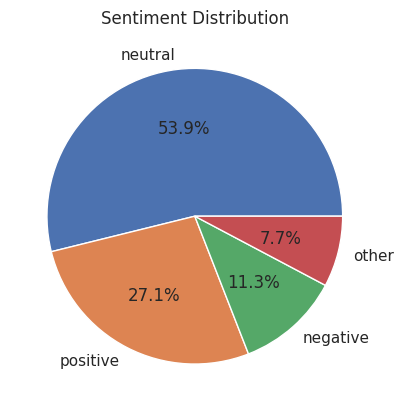

In [ ]:
enriched_comments_df['sentiment'] = enriched_comments_df['top_emotion'].apply(
    lambda x: 'neutral' if x == 'neutral' else sentiment_label(x)
)
full_sentiment_counts = enriched_comments_df['sentiment'].value_counts()
print("Full sentiment breakdown (including neutral):\n", full_sentiment_counts)

full_sentiment_counts.plot.pie(autopct='%1.1f%%', title='Sentiment Distribution')
plt.ylabel('')
plt.show()

## Sentiment Breakdown

- **Neutral:** 581,619  
- **Positive:** 292,161  
- **Negative:** 122,383  
- **Other:** 83,683  

### Interpretation

- **Neutral Dominates:**  
  The vast majority of comments (over **58%**) are categorized as neutral. This is typical in large-scale comment data, where many responses are straightforward, informational, or lack strong emotional language. The pie chart confirms that neutral sentiment forms the largest segment by far.

- **Positive Engagement:**  
  Positive comments are the second largest group, accounting for nearly **30%** of all comments. This suggests a generally supportive or appreciative community, with many viewers expressing joy, gratitude, or approval.

- **Negative and Other:**  
  Negative comments make up about **12%**, while "other" sentiments (emotions that don't neatly fit positive/negative/neutral) account for a smaller but still significant share. This shows that while critical or negative reactions are present, they are far less common than neutral or positive ones.

- **Pie Chart Visualization:**  
  The pie chart makes the sentiment proportions easy to grasp at a glance:
    - **Neutral** (largest slice, over half)
    - **Positive** (almost one-third)
    - **Negative** and **Other** (much smaller slices, but not negligible)

### Key Takeaways

- **Most Conversations Are Non-Emotional:**  
  Most comments are neutral, highlighting that only a minority of participants express strong emotional reactions.
- **Positive > Negative:**  
  Among comments with clear sentiment, positivity strongly outweighs negativity.
- **Healthy Community Signal:**  
  The low percentage of negative comments, combined with a strong positive presence, is a healthy sign for the community or channel.

**Summary:**  
By including neutral comments, we see that most conversations are emotionally neutral or positive, with negative and ambiguous sentiments making up a smaller portion of the discourse. This holistic view is critical for understanding overall community health and engagement.

---
## Integrated Insights & Takeaways


In [8]:
enriched_comments_df = pd.read_csv("/content/comments_with_emotions_SamLowe2.csv", low_memory=False)

In [9]:
enriched_comments_df.columns

Index(['video_id', 'channelTitle', 'comment', 'published_at', 'title',
       'publishedAt', 'comment_length', 'was_truncated', 'emotions',
       'top_emotion'],
      dtype='object')

In [10]:
enriched_comments_df['vader_sentiment'] = enriched_comments_df['comment'].apply(
    lambda x: analyzer.polarity_scores(str(x))['compound'] if isinstance(x, str) else np.nan
)

In [11]:
enriched_comments_df['vader_sentiment_label'] = enriched_comments_df['vader_sentiment'].apply(
    lambda score: 'Positive' if score > 0 else 'Negative'
)

In [13]:
print(enriched_comments_df['channelTitle'].unique()[:20])

['Benjamin Seda' '2022-04-18T08:42:33Z' '2020-11-30T08:41:17Z'
 'Better Bachelor' '2020-11-04T22:42:34Z' '2021-08-23T06:30:37Z'
 'Coach Corey Wayne' '2021-10-19T15:38:40Z' '2020-11-09T15:44:07Z'
 '2020-08-28T09:51:47Z' '2020-08-30T19:04:24Z' 'Jordan B Peterson'
 '2025-03-06T01:20:25Z' '2021-03-08T10:40:39Z' 'FreshandFit']


In [14]:
timestamp_regex = r'^\d{4}-\d{2}-\d{2}T\d{2}:\d{2}:\d{2}Z$'
timestamp_rows = enriched_comments_df[enriched_comments_df['channelTitle'].str.match(timestamp_regex)]

# 2. Count unique video_ids for each "timestamp channel"
timestamp_video_counts = (
    timestamp_rows.groupby('channelTitle')['video_id']
    .nunique()
    .sort_values(ascending=False)
)

print(timestamp_video_counts)


channelTitle
2020-08-28T09:51:47Z    1
2020-08-30T19:04:24Z    1
2020-11-04T22:42:34Z    1
2020-11-09T15:44:07Z    1
2020-11-30T08:41:17Z    1
2021-03-08T10:40:39Z    1
2021-08-23T06:30:37Z    1
2021-10-19T15:38:40Z    1
2022-04-18T08:42:33Z    1
2025-03-06T01:20:25Z    1
Name: video_id, dtype: int64


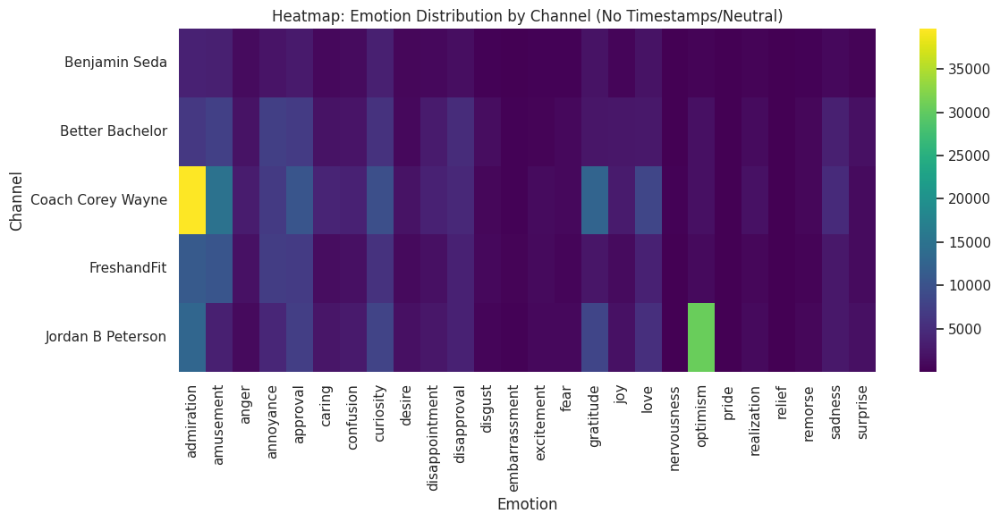

In [15]:
# 1. Remove channelTitles that are timestamps
timestamp_regex = r'^\d{4}-\d{2}-\d{2}T\d{2}:\d{2}:\d{2}Z$'
filtered_df = enriched_comments_df[~enriched_comments_df['channelTitle'].str.match(timestamp_regex)]

# 2. Remove rows with 'neutral' top_emotion (case-insensitive)
filtered_df = filtered_df[filtered_df['top_emotion'].str.lower() != 'neutral']

# 3. Pivot table: count of comments by channel and emotion
pivot = filtered_df.pivot_table(
    index='channelTitle',
    columns='top_emotion',
    values='comment',
    aggfunc='count',
    fill_value=0
)

plt.figure(figsize=(12, 6))
sns.heatmap(pivot, cmap='viridis')
plt.title('Heatmap: Emotion Distribution by Channel (No Timestamps/Neutral)')
plt.xlabel('Emotion')
plt.ylabel('Channel')
plt.tight_layout()
plt.show()

In [21]:
def remove_emojis(text):
    # This regex matches most common emojis
    emoji_pattern = re.compile(
        "["
        "\U0001F600-\U0001F64F"  # emoticons
        "\U0001F300-\U0001F5FF"  # symbols & pictographs
        "\U0001F680-\U0001F6FF"  # transport & map symbols
        "\U0001F1E0-\U0001F1FF"  # flags (iOS)
        "\U00002702-\U000027B0"
        "\U000024C2-\U0001F251"
        "]+",
        flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', str(text))

# Remove emojis from the title column
filtered_df['title'] = filtered_df['title'].apply(remove_emojis)

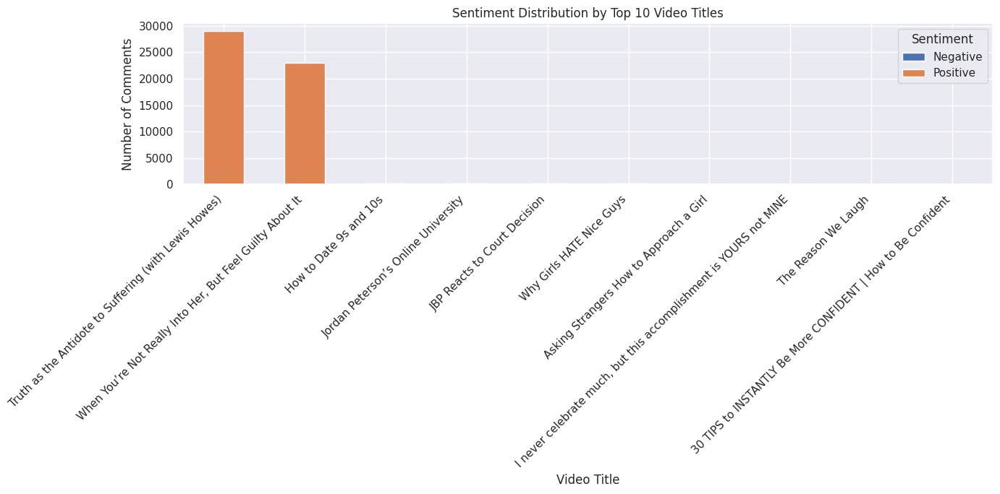

In [27]:
# Step 1: Find top N titles by comment count
video_comment_counts = filtered_df.groupby('title')['comment'].count()
top_n = 10
top_titles = video_comment_counts.nlargest(top_n).index

# Step 2: Filter your DataFrame for these titles
df_top = filtered_df[filtered_df['title'].isin(top_titles)]

# Step 3: Create the pivot table (now guaranteed to have only the top titles)
pivot_top = df_top.pivot_table(
    index='title',
    columns='vader_sentiment_label',
    values='comment',
    aggfunc='count',
    fill_value=0
)

# Step 4: Reindex to ensure the order matches top_titles
pivot_top = pivot_top.reindex(top_titles)

# Step 5: Plot
ax = pivot_top.plot(kind='bar', stacked=True, figsize=(14,7))
plt.title(f'Sentiment Distribution by Top {top_n} Video Titles')
plt.xlabel('Video Title')
plt.ylabel('Number of Comments')
plt.legend(title='Sentiment')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


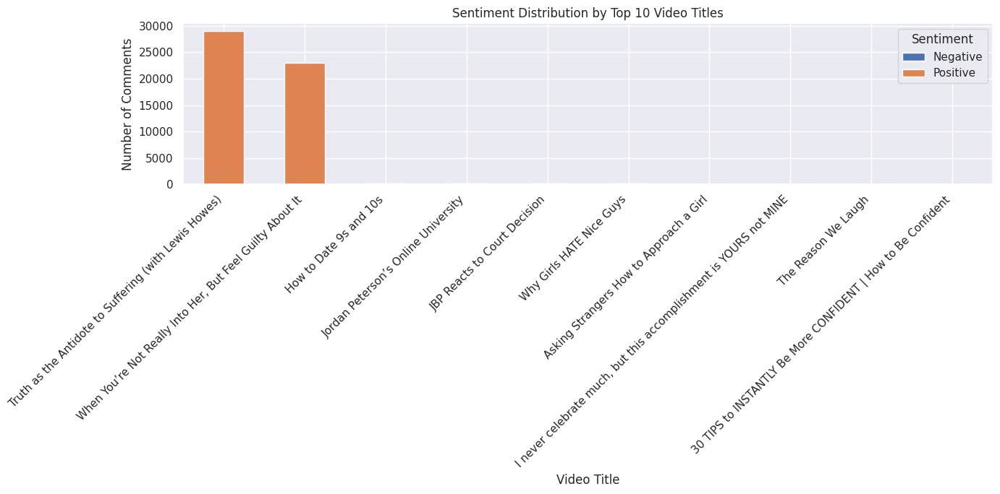

In [26]:

ax = pivot_top.plot(kind='bar', stacked=True, figsize=(14,7))
plt.title(f'Sentiment Distribution by Top {top_n} Video Titles')
plt.xlabel('Video Title')
plt.ylabel('Number of Comments')
plt.legend(title='Sentiment')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [24]:
examples = filtered_df[['comment', 'title', 'channelTitle', 'top_emotion', 'vader_sentiment_label']].sample(5)
print("Example Comments with Emotion and Sentiment Breakdown:\n")
print(examples.to_markdown(index=False))

Example Comments with Emotion and Sentiment Breakdown:

| comment                                                                                                                                                                                                                                                                       | title                                                       | channelTitle      | top_emotion    | vader_sentiment_label   |
|:------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|:------------------------------------------------------------|:------------------|:---------------|:------------------------|
| Brutally honest                                                                                                                                 

---
### Conclusion

By integrating modern NLP models, we achieve a more comprehensive and insightful analysis of text data. These techniques enable fine-grained understanding of public opinion and emotion, making them invaluable for real-world applications in business, research, and beyond.